# Instructions for using this notebook
To use this notebook, follow the instructions below to first install the required libraries. Once all the libraries are place, you can run the notebook by pressing the play button to run just one cell. To run the whole notebook use the double play button and click okay in the dialog that appears.
## Required libraries
1\. PYROSM <br>
2\. PANDAS <br>
3\. GEOPANDAS <br>
4\. GEOJSON <br>
5\. GEOJSONIO <br>
6\. JSON
### Install the libraries
if any library is missing, please use the intructions below to install them. If the instructions are note here then do a goole search with the reported error log for it. That should help.
#### Instructions for installing PYROSM
To perform the installation, please follow the instructions in the link:
__https://pyrosm.readthedocs.io/en/latest/installation.html__
#### Instructions for PANDAS
if Pandas is not already installed, follow the instructions in the link (use pip as instructed in the page): __https://pandas.pydata.org/docs/getting_started/install.html__ 
#### Instructions for GEOPANDAS
Usually the installation of PYROSM will install GEOPANDAS. if GEOPANDAS is not already installed, follow the instructions in the link (use pip as instructed in the page): __https://geopandas.org/en/stable/getting_started/install.html__
#### Instructions for GEOJSON
if GEOJSON is not already installed, follow the instructions in the link (use pip as instructed in the page): __https://pypi.org/project/geojson/__
#### Instructions for GEOJSONIO
This libray is used to display data in geojson format in map through the link: __https://geojson.io/#map=2/20.0/0.0__ <br>
To install GEOJSONIO, follow the instruction in the link: __https://pypi.org/project/geojsonio/__
#### Instructions for JSON
if it is not already in your Python environment then use: pip install json 

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
# import the needed libraries. The import is global
from pyrosm import OSM
from pyrosm import get_data

import geopandas
import pandas as pd

import geojson

import geojsonio

import pika

from turfpy.measurement import rhumb_bearing

import sys
import os
import datetime
from datetime import datetime
from datetime import timedelta


In [4]:
# path for user defined modules
modules_path = os.path.abspath(os.path.join('../python-modules'))
sys.path.insert(0, modules_path)

In [5]:
# import user defined python modules
import shapely_json_lines as sjl
import constant_data as cData
import GeometryData as gdata
import FeatureCollectionData as fcData
import neighbour_search as nb_s
import RoadNetworkManager as nManager
import CummulativeDistanceAndTime
import EnrichedCoordinates
import connectedsegments
import neighboursearch
import filterfunctions

In [6]:
# paths
data_path = "../../../data/"

In [7]:
# set the file containing the map data.
osm = OSM(data_path + "gothenburg.osm.pbf")

In [8]:
# Read road networks from the map
nodes, edges = osm.get_network(network_type="driving", nodes=True)

In [9]:
#edges.explore()

In [10]:
print(len(nodes))

360767


In [11]:
print(len(edges))

371683


In [12]:
nodes.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 360767 entries, 0 to 360766
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype   
---  ------     --------------   -----   
 0   lon        360767 non-null  float64 
 1   lat        360767 non-null  float64 
 2   tags       12684 non-null   object  
 3   timestamp  360767 non-null  int8    
 4   version    360767 non-null  int8    
 5   changeset  360767 non-null  int8    
 6   id         360767 non-null  int64   
 7   geometry   360767 non-null  geometry
dtypes: float64(2), geometry(1), int64(1), int8(3), object(1)
memory usage: 14.8+ MB


In [13]:
def filternetwork():
    return(edges[(edges['name'].isin(cData.selected_road_names)) | \
                     (edges['ref'].isin(cData.road_ref_list)) | \
                     (edges['id'].isin(cData.road_id_list)) | \
                     (edges['highway'].isin(["motorway_link",  "trunk_link", "trunk"]))]
          )

In [14]:
filtered_network_graph = filternetwork()

In [15]:
#filtered_network_graph.explore()

In [16]:
filtered_network_graph.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 13945 entries, 42 to 370533
Data columns (total 38 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   access         141 non-null    object  
 1   area           0 non-null      object  
 2   bicycle        195 non-null    object  
 3   bridge         676 non-null    object  
 4   cycleway       12 non-null     object  
 5   foot           153 non-null    object  
 6   highway        13945 non-null  object  
 7   int_ref        2557 non-null   object  
 8   junction       672 non-null    object  
 9   lanes          10377 non-null  object  
 10  lit            2712 non-null   object  
 11  maxspeed       12547 non-null  object  
 12  motorcar       0 non-null      object  
 13  motorroad      25 non-null     object  
 14  motor_vehicle  2 non-null      object  
 15  name           6436 non-null   object  
 16  oneway         11822 non-null  object  
 17  overtaking     0 non-

In [17]:
def filternodes(rnetwork):
    return(nodes[(nodes['id'].isin(rnetwork.v)) | \
                (nodes['id'].isin(rnetwork.u))])

In [18]:
filtered_nodes = filternodes(filtered_network_graph)

(57.55, 57.875)

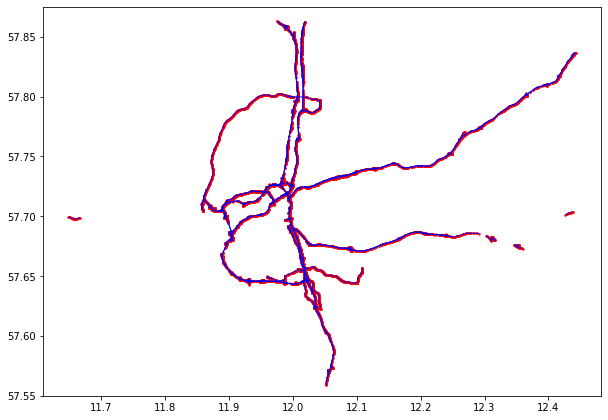

In [19]:
ax = filtered_network_graph.plot(figsize=(10,10), color="blue", lw=1.0)
ax = filtered_nodes.plot(ax=ax, color="red", markersize=2)
ax.set_ylim([57.55, 57.875])

<AxesSubplot:>

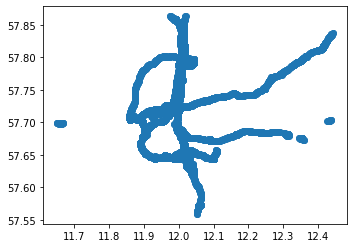

In [20]:
filtered_nodes.plot()

In [21]:
segments = [4040302, 284402021, 226048677]#, 13865743,13865744, 284402510]
gdf_test_segments = filtered_network_graph[filtered_network_graph['id'].isin(segments)]

In [22]:
filtered_nodes_test = filternodes(gdf_test_segments)

(57.855, 57.865)

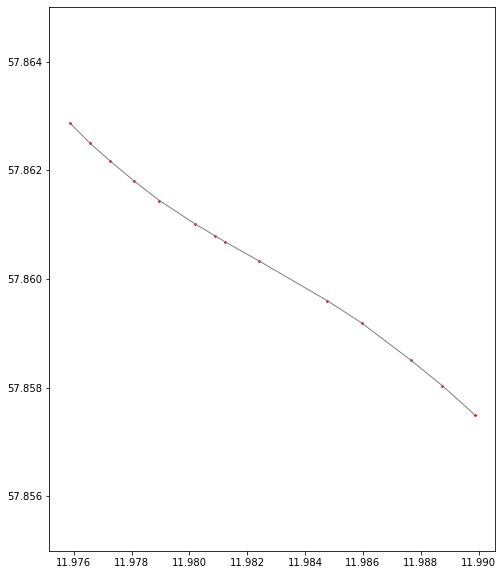

In [23]:
ax1 = gdf_test_segments.plot(figsize=(10,10), color="grey", lw=1.0)
ax1 = filtered_nodes_test.plot(ax=ax1, color="red", markersize=3)
ax1.set_ylim([57.855, 57.865])

In [24]:
filtered_network_graph = filtered_network_graph.loc[~filtered_network_graph["highway"].isin(['cycleway', 'footway', 'pedestrian', 'trail', 'crossing'])].copy()

In [25]:
filtered_nodes_test = filternodes(filtered_network_graph)

(57.55, 57.875)

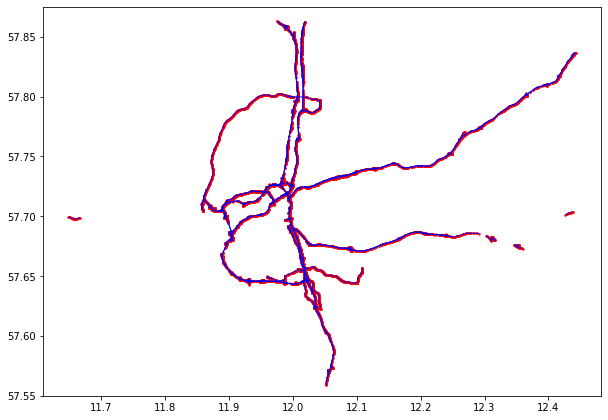

In [26]:
ax3 = filtered_network_graph.plot(figsize=(10,10), color="blue", lw=1.0)
ax3 = filtered_nodes_test.plot(ax=ax3, color="red", markersize=2)
ax3.set_ylim([57.55, 57.875])

In [27]:
filtered_network_graph = CummulativeDistanceAndTime.fixNAForMaxSpeed(filtered_network_graph)
filtered_network_graph["maxspeed"].unique()

<IntegerArray>
[100, 70, 60, 80, <NA>, 50, 90, 40, 30, 110]
Length: 10, dtype: Int64

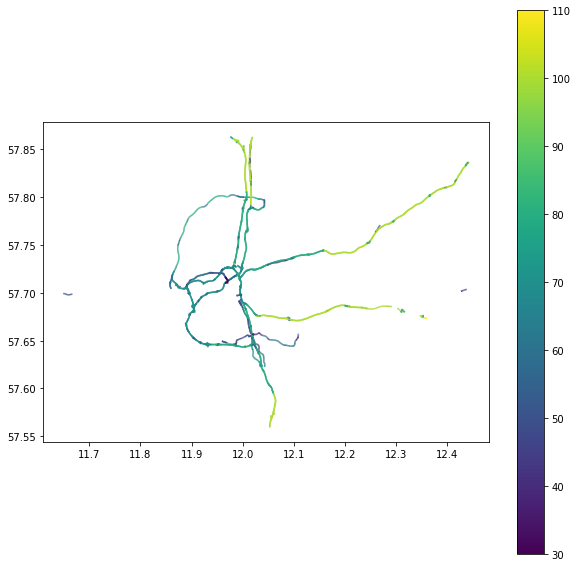

In [28]:
filtered_network_graph = CummulativeDistanceAndTime.replaceNAInMaxSpeed(filtered_network_graph)
ax = filtered_network_graph.plot(column="maxspeed", figsize=(10,10), legend=True)

In [29]:
print(nodes[nodes['id'].isin([2881481573])])

           lon        lat  tags  timestamp  version  changeset          id  \
202  11.980885  57.860795  None          0        0          0  2881481573   

                      geometry  
202  POINT (11.98088 57.86080)  


In [30]:
drive_net = osm.get_network(network_type="driving")

In [31]:
gdf_E6_graph = filtered_network_graph[filtered_network_graph['ref'] == 'E 6']

In [32]:
columns_to_drop = ['access', 'area', 'bicycle', 'cycleway', 'foot', 'lit', 'smoothness', \
                  'sidewalk', 'tags', 'version', 'timestamp', 'psv', 'int_ref']# not needed columns in the dataframe

In [33]:
def filternetworkExt(rNetwork):
    return(drive_net[(rNetwork['name'].isin(cData.selected_road_names)) | \
                     (rNetwork['ref'].isin(cData.road_ref_list)) | \
                     (rNetwork['id'].isin(cData.road_id_list)) | \
                     (rNetwork['highway'].isin(["motorway_link",  "trunk_link", "trunk"]))]
          )

In [34]:
def filterRoadNetwork(rNetwork):
    return(rNetwork[(rNetwork['name'].isin(cData.selected_road_names)) | \
                     (rNetwork['ref'].isin(cData.road_ref_list)) | \
                     (rNetwork['id'].isin(cData.road_id_list)) | \
                     (rNetwork['highway'].isin(["motorway_link",  "trunk_link", "trunk"]))]
          )

In [35]:
graphroadnetwork_E6 = filtered_network_graph[filtered_network_graph['ref'].isin(['E 6'])]

In [36]:
#graphroadnetwork_E6.explore()

In [37]:
ref_list = ['E 6', 'E 6.20', 'E 20', 'E 6;E 20', 'E 45']
nameslist = ['Oscarsleden']

In [38]:
large_graph = edges[(edges['name'].isin(nameslist)) | (edges['ref'].isin(ref_list))]

In [39]:
large_graph.explore()

In [40]:
filterfuncs = filterfunctions.filterfunctions()
filtered_network = drive_net[(drive_net['name'].isin(nameslist)) | (drive_net['ref'].isin(ref_list))] #filterfuncs.filterRoadNetwork(drive_net)

In [41]:
targetNetwork = drive_net[(drive_net['name'].isin(nameslist)) | (drive_net['ref'].isin(ref_list))]

In [42]:
roadNetworkManager_validator = nManager.RoadNetworkManager()

In [43]:
roadNetworkManager_validator.createlinesFromRoadGraphNetwork(targetNetwork, filtered_network, large_graph)

[]
[4040302]
[4040302, 284402021]
[4040302, 284402021, 226048677]
[4040302, 284402021, 226048677, 13865743]
[4040302, 284402021, 226048677, 13865743, 13865744]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754]
[4040302, 284402021, 226048677,

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130,

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 94

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 102302576

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220]
[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 40

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205]
[4040302

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

83   82   941040139
84   83   941040139
85   84   941040139
941040139   3
86   85   941040137
941040137   1
87   86   183156782
88   87   183156782
89   88   183156782
90   89   183156782
91   90   183156782
92   91   183156782
183156782   6
93   92   941040140
94   93   941040140
941040140   2
95   94   1023025761
1023025761   1
96   95   1023025760
1023025760   1
97   96   236557699
98   97   236557699
99   98   236557699
100   99   236557699
236557699   4
101   100   940731566
940731566   1
102   101   940731570
940731570   1
103   102   940731567
940731567   1
104   103   1023025749
1023025749   1
105   104   1023025748
1023025748   1
106   105   4077750
107   106   4077750
108   107   4077750
109   108   4077750
4077750   4
110   109   940731571
940731571   1
111   110   1023025746
1023025746   1
112   111   1023025745
1023025745   1
113   112   290070332
114   113   290070332
115   114   290070332
116   115   290070332
290070332   4
117   116   940731576
940731576   1
118   117  

400   399   296093122
401   400   296093122
296093122   23
402   401   806960338
806960338   1
403   402   806960339
404   403   806960339
405   404   806960339
406   405   806960339
407   406   806960339
408   407   806960339
409   408   806960339
410   409   806960339
411   410   806960339
806960339   9
412   411   4040978
413   412   4040978
414   413   4040978
415   414   4040978
4040978   4
416   415   361204262
361204262   1
417   416   361204265
361204265   1
418   417   806960322
806960322   1
419   418   296093116
420   419   296093116
296093116   2
421   420   10958445
10958445   1
422   421   10958444
423   422   10958444
424   423   10958444
425   424   10958444
426   425   10958444
10958444   5
427   426   806960305
806960305   1
428   427   806960303
429   428   806960303
806960303   2
430   429   806960302
806960302   1
431   430   296093117
432   431   296093117
433   432   296093117
434   433   296093117
435   434   296093117
296093117   5
436   435   4182320
437   436

730   729   297012008
731   730   297012008
732   731   297012008
733   732   297012008
297012008   33
734   733   238455645
735   734   238455645
736   735   238455645
238455645   3
737   736   297012010
738   737   297012010
739   738   297012010
297012010   3
740   739   297012011
741   740   297012011
742   741   297012011
743   742   297012011
297012011   4
744   743   37016052
745   744   37016052
746   745   37016052
747   746   37016052
748   747   37016052
749   748   37016052
750   749   37016052
751   750   37016052
752   751   37016052
753   752   37016052
754   753   37016052
755   754   37016052
756   755   37016052
37016052   13
757   756   37016051
37016051   1
758   757   480294687
759   758   480294687
760   759   480294687
761   760   480294687
762   761   480294687
763   762   480294687
764   763   480294687
765   764   480294687
766   765   480294687
767   766   480294687
768   767   480294687
769   768   480294687
770   769   480294687
771   770   480294687
772   

{"coordinates": [[12.007166, 57.805937], [12.007198, 57.805774], [12.007307, 57.805219]], "type": "LineString"}
incoming line id -: 941040135; this line id -: 941040138;  out going line id -: 941040136
{"coordinates": [[12.007307, 57.805219], [12.007514, 57.804187]], "type": "LineString"}
incoming line id -: 941040138; this line id -: 941040136;  out going line id -: 941040139
{"coordinates": [[12.007514, 57.804187], [12.007556, 57.803871], [12.007597, 57.803487], [12.007607, 57.803137]], "type": "LineString"}
incoming line id -: 941040136; this line id -: 941040139;  out going line id -: 941040137
{"coordinates": [[12.007607, 57.803137], [12.007621, 57.802548]], "type": "LineString"}
incoming line id -: 941040139; this line id -: 941040137;  out going line id -: 183156782
{"coordinates": [[12.007621, 57.802548], [12.007591, 57.801974], [12.007523, 57.801292], [12.007449, 57.800836], [12.007276, 57.800096], [12.007056, 57.799378], [12.006937, 57.799042]], "type": "LineString"}
incoming

incoming line id -: 1023025691; this line id -: 1023025690;  out going line id -: 395613919
{"coordinates": [[11.984831, 57.733397], [11.984749, 57.733209], [11.9846, 57.732944], [11.984174, 57.732259], [11.983906, 57.731771]], "type": "LineString"}
incoming line id -: 1023025690; this line id -: 395613919;  out going line id -: 1022912232
{"coordinates": [[11.983906, 57.731771], [11.983869, 57.731703]], "type": "LineString"}
incoming line id -: 395613919; this line id -: 1022912232;  out going line id -: 1022912231
{"coordinates": [[11.983869, 57.731703], [11.983845, 57.731659], [11.983597, 57.731315], [11.983275, 57.730828]], "type": "LineString"}
incoming line id -: 1022912232; this line id -: 1022912231;  out going line id -: 1022912205
{"coordinates": [[11.983275, 57.730828], [11.983242, 57.730778]], "type": "LineString"}
incoming line id -: 1022912231; this line id -: 1022912205;  out going line id -: 1022912204
{"coordinates": [[11.983242, 57.730778], [11.983095, 57.730555]], "t

{"coordinates": [[11.995233, 57.712438], [11.995706, 57.712205], [11.995996, 57.712046], [11.996274, 57.711879]], "type": "LineString"}
incoming line id -: 4040446; this line id -: 990532283;  out going line id -: 990532282
{"coordinates": [[11.996274, 57.711879], [11.996443, 57.711753], [11.99657, 57.711638], [11.996685, 57.711495], [11.996774, 57.711359], [11.99684, 57.711214], [11.996889, 57.711064]], "type": "LineString"}
incoming line id -: 990532283; this line id -: 990532282;  out going line id -: 285893666
{"coordinates": [[11.996889, 57.711064], [11.996917, 57.710921], [11.996933, 57.710772], [11.996914, 57.710556], [11.996886, 57.710349], [11.996813, 57.710101], [11.996632, 57.7096], [11.996552, 57.709365], [11.996363, 57.70881], [11.9959, 57.707389]], "type": "LineString"}
incoming line id -: 990532282; this line id -: 285893666;  out going line id -: 1023578348
{"coordinates": [[11.9959, 57.707389], [11.995817, 57.707064]], "type": "LineString"}
incoming line id -: 28589366

incoming line id -: 10958444; this line id -: 806960305;  out going line id -: 806960303
{"coordinates": [[12.024656, 57.643808], [12.02513, 57.643329], [12.026121, 57.642317]], "type": "LineString"}
incoming line id -: 806960305; this line id -: 806960303;  out going line id -: 806960302
{"coordinates": [[12.026121, 57.642317], [12.0271, 57.641354]], "type": "LineString"}
incoming line id -: 806960303; this line id -: 806960302;  out going line id -: 296093117
{"coordinates": [[12.0271, 57.641354], [12.027875, 57.64055], [12.02924, 57.639101], [12.030083, 57.638151], [12.030938, 57.637165], [12.032529, 57.635201]], "type": "LineString"}
incoming line id -: 806960302; this line id -: 296093117;  out going line id -: 4182320
{"coordinates": [[12.032529, 57.635201], [12.032921, 57.634691], [12.033143, 57.634391], [12.033449, 57.633936], [12.033731, 57.633475], [12.034105, 57.63278], [12.034383, 57.632199], [12.034684, 57.631444], [12.034927, 57.630665], [12.035084, 57.630039], [12.035169

{"coordinates": [[12.017982, 57.724448], [12.016741, 57.724497], [12.015685, 57.724465], [12.015458, 57.72445]], "type": "LineString"}
incoming line id -: 1023361844; this line id -: 177388064;  out going line id -: 1023361855
{"coordinates": [[12.018125, 57.724442], [12.017982, 57.724448]], "type": "LineString"}
incoming line id -: 1023361845; this line id -: 1023361844;  out going line id -: 177388064
{"coordinates": [[12.0188, 57.724415], [12.018125, 57.724442]], "type": "LineString"}
incoming line id -: 113713018; this line id -: 1023361845;  out going line id -: 1023361844
{"coordinates": [[12.025757, 57.724292], [12.024796, 57.724208], [12.023879, 57.724155], [12.022673, 57.724149], [12.02176, 57.72419], [12.019742, 57.724334], [12.019345, 57.724365], [12.0188, 57.724415]], "type": "LineString"}
incoming line id -: 177388079; this line id -: 113713018;  out going line id -: 1023361845
{"coordinates": [[12.029033, 57.724919], [12.027469, 57.724571], [12.025757, 57.724292]], "type"

{"coordinates": [[12.241992, 57.750962], [12.240112, 57.750312], [12.239128, 57.749965], [12.238036, 57.749592]], "type": "LineString"}
incoming line id -: 297012010; this line id -: 238455645;  out going line id -: 297012008
{"coordinates": [[12.244941, 57.752106], [12.243844, 57.751656], [12.242681, 57.751206], [12.241992, 57.750962]], "type": "LineString"}
incoming line id -: 297012011; this line id -: 297012010;  out going line id -: 238455645
{"coordinates": [[12.24884, 57.754119], [12.247971, 57.753607], [12.247078, 57.753126], [12.245988, 57.752592], [12.244941, 57.752106]], "type": "LineString"}
incoming line id -: 37016052; this line id -: 297012011;  out going line id -: 297012010
{"coordinates": [[12.260206, 57.763113], [12.259166, 57.762383], [12.258111, 57.761605], [12.257719, 57.761305], [12.257186, 57.760893], [12.256644, 57.760449], [12.256105, 57.76], [12.255665, 57.759621], [12.255059, 57.759068], [12.25453, 57.758605], [12.253817, 57.757957], [12.251613, 57.756013], 

1023025754   69  [ 12.0039949 , 57.8230572 ]
printing node
1023025754   70  [ 12.0040417 , 57.8223176 ]
printing node
1023025754   71  [ 12.0041541 , 57.8211818 ]
printing node
1023025754   72  [ 12.0043253 , 57.8200899 ]
printing node
1023025754   73  [ 12.0044781 , 57.8192514 ]
printing node
1023025754   74  [ 12.0051461 , 57.8159956 ]
printing node
1023025754   75  [ 12.0059876 , 57.811791 ]
printing node
941040134   76  [ 12.0062685 , 57.8104281 ]
printing node
941040135   77  [ 12.0065938 , 57.8087624 ]
printing node
941040135   78  [ 12.0068018 , 57.8077478 ]
printing node
941040138   79  [ 12.0071661 , 57.8059375 ]
printing node
941040138   80  [ 12.0071982 , 57.8057738 ]
printing node
941040136   81  [ 12.0073071 , 57.8052191 ]
printing node
941040139   82  [ 12.0075141 , 57.8041869 ]
printing node
941040139   83  [ 12.0075565 , 57.803871 ]
printing node
941040139   84  [ 12.0075967 , 57.8034874 ]
printing node
941040137   85  [ 12.0076071 , 57.8031374 ]
printing node
183156782

printing node
168975966   281  [ 11.9947837 , 57.7126325 ]
printing node
168975966   282  [ 11.9949808 , 57.7125387 ]
printing node
990532265   283  [ 11.9952331 , 57.7124385 ]
printing node
990532265   284  [ 11.9937644 , 57.7143664 ]
printing node
990532283   285  [ 11.9937885 , 57.7142655 ]
printing node
990532283   286  [ 11.9957063 , 57.7122051 ]
printing node
990532283   287  [ 11.9959956 , 57.712046 ]
printing node
990532282   288  [ 11.9962741 , 57.7118789 ]
printing node
990532282   289  [ 11.9964432 , 57.711753 ]
printing node
990532282   290  [ 11.9965701 , 57.711638 ]
printing node
990532282   291  [ 11.9966853 , 57.7114947 ]
printing node
990532282   292  [ 11.9967742 , 57.7113585 ]
printing node
990532282   293  [ 11.9968399 , 57.7112145 ]
printing node
285893666   294  [ 11.9968895 , 57.7110641 ]
printing node
285893666   295  [ 11.9969169 , 57.7109214 ]
printing node
285893666   296  [ 11.9969334 , 57.7107718 ]
printing node
285893666   297  [ 11.9969141 , 57.7105561 ]


4182320   435  [ 12.0325289 , 57.6352005 ]
printing node
4182320   436  [ 12.0329207 , 57.634691 ]
printing node
4182320   437  [ 12.0331433 , 57.6343909 ]
printing node
4182320   438  [ 12.0334491 , 57.6339357 ]
printing node
4182320   439  [ 12.0337307 , 57.6334748 ]
printing node
4182320   440  [ 12.0341052 , 57.6327803 ]
printing node
4182320   441  [ 12.0343833 , 57.6321991 ]
printing node
4182320   442  [ 12.0346839 , 57.6314438 ]
printing node
4182320   443  [ 12.0349274 , 57.630665 ]
printing node
4182320   444  [ 12.0350835 , 57.6300386 ]
printing node
4182320   445  [ 12.0351694 , 57.6295476 ]
printing node
4182320   446  [ 12.0352568 , 57.6289489 ]
printing node
937417542   447  [ 12.035396 , 57.6276995 ]
printing node
296093115   448  [ 12.0354797 , 57.6269923 ]
printing node
296093115   449  [ 12.0355896 , 57.6262928 ]
printing node
296093115   450  [ 12.0356771 , 57.62552 ]
printing node
296093115   451  [ 12.0358041 , 57.6244162 ]
printing node
296093115   452  [ 12.0359

printing node
4077772   657  [ 12.1188958 , 57.7394115 ]
printing node
4077772   658  [ 12.1158589 , 57.739243 ]
printing node
4077772   659  [ 12.1141718 , 57.7391455 ]
printing node
4077772   660  [ 12.1127942 , 57.7390624 ]
printing node
4077772   661  [ 12.1116077 , 57.7389747 ]
printing node
4077772   662  [ 12.1105902 , 57.7388843 ]
printing node
4077772   663  [ 12.1096113 , 57.7387747 ]
printing node
4077772   664  [ 12.1085298 , 57.7386182 ]
printing node
4077772   665  [ 12.1074786 , 57.7384465 ]
printing node
4077772   666  [ 12.1068402 , 57.738343 ]
printing node
297011999   667  [ 12.105898 , 57.7381694 ]
printing node
297012007   668  [ 12.1492983 , 57.7429515 ]
printing node
297012007   669  [ 12.1535993 , 57.7436358 ]
printing node
297012012   670  [ 12.1507003 , 57.7431921 ]
printing node
297012012   671  [ 12.1576776 , 57.7440788 ]
printing node
297012012   672  [ 12.1569954 , 57.7440531 ]
printing node
297012012   673  [ 12.155967 , 57.7439752 ]
printing node
2970120

297013899   877  [ 12.3634386 , 57.8008454 ]
printing node
44131530   878  [ 12.3669764 , 57.8021524 ]
printing node
44131530   879  [ 12.3947723 , 57.8097583 ]
printing node
44131530   880  [ 12.3918469 , 57.8093138 ]
printing node
44131530   881  [ 12.3900612 , 57.8090187 ]
printing node
44131530   882  [ 12.385697 , 57.8081978 ]
printing node
44131530   883  [ 12.3824314 , 57.8076032 ]
printing node
44131530   884  [ 12.3814755 , 57.807394 ]
printing node
44131530   885  [ 12.3806832 , 57.8071517 ]
printing node
44131530   886  [ 12.3797398 , 57.8068215 ]
printing node
44131530   887  [ 12.3775923 , 57.8060444 ]
printing node
44131530   888  [ 12.375397 , 57.8051925 ]
printing node
38805087   889  [ 12.3712184 , 57.8037055 ]
printing node
788071871   890  [ 12.3965865 , 57.8099813 ]
printing node
788071871   891  [ 12.4003369 , 57.810489 ]
printing node
788071871   892  [ 12.3996644 , 57.8103853 ]
printing node
788071871   893  [ 12.3984746 , 57.8102058 ]
printing node
297039823   8

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

80   79   941040138
81   80   941040138
941040138   2
82   81   941040136
941040136   1
83   82   941040139
84   83   941040139
85   84   941040139
941040139   3
86   85   941040137
941040137   1
87   86   183156782
88   87   183156782
89   88   183156782
90   89   183156782
91   90   183156782
92   91   183156782
183156782   6
93   92   941040140
94   93   941040140
941040140   2
95   94   1023025761
1023025761   1
96   95   1023025760
1023025760   1
97   96   236557699
98   97   236557699
99   98   236557699
100   99   236557699
236557699   4
101   100   940731566
940731566   1
102   101   940731570
940731570   1
103   102   940731567
940731567   1
104   103   1023025749
1023025749   1
105   104   1023025748
1023025748   1
106   105   4077750
107   106   4077750
108   107   4077750
109   108   4077750
4077750   4
110   109   940731571
940731571   1
111   110   1023025746
1023025746   1
112   111   1023025745
1023025745   1
113   112   290070332
114   113   290070332
115   114   29007

429   428   806960303
806960303   2
430   429   806960302
806960302   1
431   430   296093117
432   431   296093117
433   432   296093117
434   433   296093117
435   434   296093117
296093117   5
436   435   4182320
437   436   4182320
438   437   4182320
439   438   4182320
440   439   4182320
441   440   4182320
442   441   4182320
443   442   4182320
444   443   4182320
445   444   4182320
446   445   4182320
447   446   4182320
4182320   12
448   447   937417542
937417542   1
449   448   296093115
450   449   296093115
451   450   296093115
452   451   296093115
453   452   296093115
296093115   5
454   453   937417546
455   454   937417546
937417546   2
456   455   937417547
457   456   937417547
458   457   937417547
937417547   3
459   458   937417548
460   459   937417548
461   460   937417548
937417548   3
462   461   937417550
937417550   1
463   462   937417551
464   463   937417551
465   464   937417551
466   465   937417551
937417551   4
467   466   937417552
468   467   9

789   788   788071866
790   789   788071866
791   790   788071866
792   791   788071866
788071866   8
793   792   37016934
794   793   37016934
795   794   37016934
796   795   37016934
797   796   37016934
798   797   37016934
799   798   37016934
800   799   37016934
801   800   37016934
802   801   37016934
803   802   37016934
804   803   37016934
805   804   37016934
806   805   37016934
807   806   37016934
808   807   37016934
809   808   37016934
810   809   37016934
811   810   37016934
812   811   37016934
813   812   37016934
814   813   37016934
815   814   37016934
816   815   37016934
817   816   37016934
37016934   25
818   817   37016935
37016935   1
819   818   297013896
820   819   297013896
821   820   297013896
822   821   297013896
823   822   297013896
824   823   297013896
825   824   297013896
826   825   297013896
827   826   297013896
828   827   297013896
829   828   297013896
830   829   297013896
831   830   297013896
832   831   297013896
833   832   29701

1137   1135   1022919213
1022919213   1
1138   1136   705749709
705749709   1
1139   1137   4498563
4498563   1
1140   1138   1022919223
1022919223   1
1141   1139   1022919224
1022919224   1
1142   1140   116613466
116613466   1
1143   1141   116613464
116613464   1
1144   1142   116613456
116613456   1
1145   1143   116614206
116614206   1
1146   1144   1022912247
1147   1145   1022912247
1022912247   2
1148   1146   1022912248
1022912248   1
1149   1147   116615258
1150   1148   116615258
1151   1149   116615258
116615258   3
1152   1150   50898242
50898242   1
1153   1151   4498560
1154   1152   4498560
1155   1153   4498560
1156   1154   4498560
1157   1155   4498560
4498560   5
1158   1156   1022912245
1022912245   1
1159   1157   1022912246
1022912246   1
1160   1158   286430790
1161   1159   286430790
286430790   2
1162   1160   50898254
1163   1161   50898254
50898254   2
1164   1162   111626846
1165   1163   111626846
111626846   2
1166   1164   4040443
1167   1165   4040443


1439   1437   297013897
1440   1438   297013897
1441   1439   297013897
1442   1440   297013897
1443   1441   297013897
1444   1442   297013897
1445   1443   297013897
1446   1444   297013897
1447   1445   297013897
1448   1446   297013897
1449   1447   297013897
1450   1448   297013897
1451   1449   297013897
1452   1450   297013897
1453   1451   297013897
1454   1452   297013897
1455   1453   297013897
1456   1454   297013897
1457   1455   297013897
1458   1456   297013897
1459   1457   297013897
1460   1458   297013897
1461   1459   297013897
297013897   23
1462   1460   37016937
37016937   1
1463   1461   37016936
1464   1462   37016936
1465   1463   37016936
1466   1464   37016936
1467   1465   37016936
1468   1466   37016936
1469   1467   37016936
1470   1468   37016936
1471   1469   37016936
1472   1470   37016936
1473   1471   37016936
1474   1472   37016936
1475   1473   37016936
1476   1474   37016936
1477   1475   37016936
1478   1476   37016936
1479   1477   37016936
1480  

1807   1805   937417558
1808   1806   937417558
1809   1807   937417558
1810   1808   937417558
1811   1809   937417558
1812   1810   937417558
1813   1811   937417558
1814   1812   937417558
937417558   15
1815   1813   996011177
996011177   1
1816   1814   996011178
996011178   1
1817   1815   440338457
1818   1816   440338457
1819   1817   440338457
1820   1818   440338457
1821   1819   440338457
1822   1820   440338457
1823   1821   440338457
1824   1822   440338457
1825   1823   440338457
1826   1824   440338457
1827   1825   440338457
1828   1826   440338457
1829   1827   440338457
1830   1828   440338457
1831   1829   440338457
440338457   15
1832   1830   935530547
935530547   1
1833   1831   935530548
935530548   1
1834   1832   39887921
1835   1833   39887921
1836   1834   39887921
1837   1835   39887921
1838   1836   39887921
1839   1837   39887921
1840   1838   39887921
1841   1839   39887921
1842   1840   39887921
1843   1841   39887921
1844   1842   39887921
1845   1843  

incoming line id -: 1023025746; this line id -: 1023025745;  out going line id -: 290070332
{"coordinates": [[12.000991, 57.789427], [12.000808, 57.788969], [12.000597, 57.788433], [12.000293, 57.787475], [12.000027, 57.786588]], "type": "LineString"}
incoming line id -: 1023025745; this line id -: 290070332;  out going line id -: 940731576
{"coordinates": [[12.000027, 57.786588], [11.999803, 57.785562]], "type": "LineString"}
incoming line id -: 290070332; this line id -: 940731576;  out going line id -: 940731595
{"coordinates": [[11.999803, 57.785562], [11.9997, 57.78499]], "type": "LineString"}
incoming line id -: 940731576; this line id -: 940731595;  out going line id -: 940731577
{"coordinates": [[11.9997, 57.78499], [11.9995, 57.783978]], "type": "LineString"}
incoming line id -: 940731595; this line id -: 940731577;  out going line id -: 940731594
{"coordinates": [[11.9995, 57.783978], [11.999257, 57.782727]], "type": "LineString"}
incoming line id -: 940731577; this line id -

{"coordinates": [[11.983841, 57.723791], [11.986754, 57.721922]], "type": "LineString"}
incoming line id -: 471650443; this line id -: 116613463;  out going line id -: 116614208
{"coordinates": [[11.986754, 57.721922], [11.989192, 57.72037], [11.98964, 57.720071]], "type": "LineString"}
incoming line id -: 116613463; this line id -: 116614208;  out going line id -: 116614211
{"coordinates": [[11.98964, 57.720071], [11.990012, 57.719818]], "type": "LineString"}
incoming line id -: 116614208; this line id -: 116614211;  out going line id -: 116614205
{"coordinates": [[11.990012, 57.719818], [11.990162, 57.719712], [11.99031, 57.719607], [11.990439, 57.719512]], "type": "LineString"}
incoming line id -: 116614211; this line id -: 116614205;  out going line id -: 116614212
{"coordinates": [[11.990439, 57.719512], [11.990564, 57.719416]], "type": "LineString"}
incoming line id -: 116614205; this line id -: 116614212;  out going line id -: 41291138
{"coordinates": [[11.990564, 57.719416], [1

incoming line id -: 1023578506; this line id -: 1023578505;  out going line id -: 4077779
{"coordinates": [[12.003374, 57.685608], [12.004194, 57.684622], [12.005154, 57.683448], [12.005867, 57.68257], [12.006205, 57.682127], [12.006498, 57.681733], [12.00665, 57.681516], [12.006798, 57.681307], [12.006921, 57.681124]], "type": "LineString"}
incoming line id -: 1023578505; this line id -: 4077779;  out going line id -: 1023578494
{"coordinates": [[12.006921, 57.681124], [12.006959, 57.681073]], "type": "LineString"}
incoming line id -: 4077779; this line id -: 1023578494;  out going line id -: 1023578493
{"coordinates": [[12.006959, 57.681073], [12.006989, 57.681033]], "type": "LineString"}
incoming line id -: 1023578494; this line id -: 1023578493;  out going line id -: 806863916
{"coordinates": [[12.006989, 57.681033], [12.007082, 57.68091], [12.007161, 57.680794], [12.007307, 57.680578], [12.007579, 57.680141], [12.007773, 57.679836], [12.007923, 57.679549], [12.008067, 57.679254]],

incoming line id -: 296533439; this line id -: 935530539;  out going line id -: 935530540
{"coordinates": [[12.058794, 57.59631], [12.059862, 57.594822]], "type": "LineString"}
incoming line id -: 935530539; this line id -: 935530540;  out going line id -: 4182406
{"coordinates": [[12.059862, 57.594822], [12.060904, 57.593376], [12.06182, 57.592076], [12.062474, 57.591157], [12.062853, 57.590583], [12.063098, 57.590144], [12.063433, 57.589431], [12.063653, 57.588808], [12.063815, 57.58815], [12.063905, 57.587536], [12.063921, 57.587057], [12.063903, 57.586535], [12.063833, 57.585914], [12.0637, 57.585289], [12.063295, 57.584043], [12.062404, 57.58157], [12.061847, 57.580121], [12.06103, 57.578109], [12.060232, 57.57628], [12.059916, 57.575578], [12.059389, 57.574422]], "type": "LineString"}
incoming line id -: 935530540; this line id -: 4182406;  out going line id -: 935530565
{"coordinates": [[12.059389, 57.574422], [12.058577, 57.572738], [12.057954, 57.571537]], "type": "LineString"

incoming line id -: 232059517; this line id -: 50302487;  out going line id -: 50302489
{"coordinates": [[12.105167, 57.738036], [12.103366, 57.737691]], "type": "LineString"}
incoming line id -: 232059515; this line id -: 232059517;  out going line id -: 50302487
{"coordinates": [[12.105898, 57.738169], [12.105167, 57.738036]], "type": "LineString"}
incoming line id -: 4077772; this line id -: 232059515;  out going line id -: 232059517
{"coordinates": [[12.149298, 57.742951], [12.144866, 57.742072], [12.140705, 57.741158], [12.139822, 57.740964], [12.139018, 57.740807], [12.138218, 57.740678], [12.137412, 57.740566], [12.136554, 57.740473], [12.135684, 57.740407], [12.134547, 57.740349], [12.131555, 57.740156], [12.129621, 57.740046], [12.129126, 57.740018], [12.127635, 57.739935], [12.125803, 57.73982], [12.125078, 57.739777], [12.122316, 57.739616], [12.120335, 57.739501], [12.118896, 57.739412], [12.115859, 57.739243], [12.114172, 57.739145], [12.112794, 57.739062], [12.111608, 57.

{"coordinates": [[12.41466, 57.815343], [12.414368, 57.81494], [12.414176, 57.814687]], "type": "LineString"}
incoming line id -: 297042448; this line id -: 38870034;  out going line id -: 297039823
{"coordinates": [[12.417063, 57.817816], [12.416062, 57.817006], [12.415693, 57.816631], [12.415245, 57.816146], [12.41466, 57.815343]], "type": "LineString"}
incoming line id -: 297042449; this line id -: 297042448;  out going line id -: 38870034
{"coordinates": [[12.417407, 57.818074], [12.417063, 57.817816]], "type": "LineString"}
incoming line id -: 297042446; this line id -: 297042449;  out going line id -: 297042448
{"coordinates": [[12.418543, 57.818972], [12.417407, 57.818074]], "type": "LineString"}
incoming line id -: 297042445; this line id -: 297042446;  out going line id -: 297042449
{"coordinates": [[12.419023, 57.819382], [12.418543, 57.818972]], "type": "LineString"}
incoming line id -: 10275796; this line id -: 297042445;  out going line id -: 297042446
{"coordinates": [[12

{"coordinates": [[11.998253, 57.776882], [11.998534, 57.777898]], "type": "LineString"}
incoming line id -: 707852415; this line id -: 940731591;  out going line id -: 142028779
{"coordinates": [[11.9981, 57.776378], [11.998253, 57.776882]], "type": "LineString"}
incoming line id -: 940731589; this line id -: 707852415;  out going line id -: 940731591
{"coordinates": [[11.997862, 57.775691], [11.9981, 57.776378]], "type": "LineString"}
incoming line id -: 940731592; this line id -: 940731589;  out going line id -: 707852415
{"coordinates": [[11.997488, 57.774609], [11.997862, 57.775691]], "type": "LineString"}
incoming line id -: 440330694; this line id -: 940731592;  out going line id -: 940731589
{"coordinates": [[11.996809, 57.772719], [11.997488, 57.774609]], "type": "LineString"}
incoming line id -: 440330699; this line id -: 440330694;  out going line id -: 940731592
{"coordinates": [[11.99655, 57.77197], [11.996809, 57.772719]], "type": "LineString"}
incoming line id -: 10230257

incoming line id -: 4498560; this line id -: 50898242;  out going line id -: 116615258
{"coordinates": [[11.993424, 57.716469], [11.993327, 57.716607], [11.992898, 57.717281], [11.992706, 57.71756], [11.992514, 57.717794], [11.992278, 57.718085]], "type": "LineString"}
incoming line id -: 1022912245; this line id -: 4498560;  out going line id -: 50898242
{"coordinates": [[11.993466, 57.716419], [11.993424, 57.716469]], "type": "LineString"}
incoming line id -: 1022912246; this line id -: 1022912245;  out going line id -: 4498560
{"coordinates": [[11.993641, 57.716211], [11.993466, 57.716419]], "type": "LineString"}
incoming line id -: 286430790; this line id -: 1022912246;  out going line id -: 1022912245
{"coordinates": [[11.993951, 57.715909], [11.99376, 57.716092], [11.993641, 57.716211]], "type": "LineString"}
incoming line id -: 50898254; this line id -: 286430790;  out going line id -: 1022912246
{"coordinates": [[11.994396, 57.71548], [11.994129, 57.715736], [11.993951, 57.7159

incoming line id -: 39237215; this line id -: 297008482;  out going line id -: 297008481
{"coordinates": [[12.125291, 57.739674], [12.128338, 57.739852], [12.129953, 57.739945], [12.131574, 57.740038], [12.133266, 57.740135]], "type": "LineString"}
incoming line id -: 297008482; this line id -: 297008481;  out going line id -: 297012004
{"coordinates": [[12.133266, 57.740135], [12.13599, 57.740308], [12.136795, 57.74037]], "type": "LineString"}
incoming line id -: 297008481; this line id -: 297012004;  out going line id -: 297012018
{"coordinates": [[12.136795, 57.74037], [12.137478, 57.74046], [12.138015, 57.740529], [12.138558, 57.74061], [12.139647, 57.740815], [12.14078, 57.741065], [12.145797, 57.742162], [12.147421, 57.742503], [12.14927, 57.742847]], "type": "LineString"}
incoming line id -: 297012004; this line id -: 297012018;  out going line id -: 4077773
{"coordinates": [[12.14927, 57.742847], [12.153627, 57.743537], [12.155894, 57.743845], [12.156873, 57.743939]], "type": "

incoming line id -: 297042444; this line id -: 297042447;  out going line id -: 297042452
{"coordinates": [[12.419206, 57.819348], [12.419822, 57.82001], [12.420693, 57.821064], [12.421303, 57.821792], [12.421579, 57.82209], [12.421847, 57.822348], [12.422253, 57.822666], [12.422668, 57.822967], [12.423239, 57.823308], [12.423837, 57.823637], [12.424479, 57.823997], [12.425149, 57.824418], [12.425608, 57.824776], [12.426131, 57.825261], [12.426941, 57.82617], [12.428716, 57.827752], [12.42967, 57.828699], [12.430041, 57.829078], [12.430386, 57.829368], [12.431202, 57.829884], [12.432977, 57.83086], [12.433613, 57.831213], [12.434733, 57.831887], [12.43542, 57.832385], [12.437341, 57.83389], [12.438978, 57.835158], [12.439372, 57.835406], [12.439663, 57.835559], [12.439709, 57.835578], [12.440176, 57.835808], [12.440649, 57.836003], [12.441608, 57.836335], [12.442373, 57.836553]], "type": "LineString"}
incoming line id -: 297042447; this line id -: 297042452;  out going line id -: None


{"coordinates": [[12.02085, 57.650403], [12.020648, 57.650764]], "type": "LineString"}
incoming line id -: 10958453; this line id -: 361204267;  out going line id -: 361204264
{"coordinates": [[12.022684, 57.64708], [12.022086, 57.648195], [12.021565, 57.649091], [12.02085, 57.650403]], "type": "LineString"}
incoming line id -: 10958440; this line id -: 10958453;  out going line id -: 361204267
{"coordinates": [[12.022974, 57.646534], [12.022684, 57.64708]], "type": "LineString"}
incoming line id -: 292644144; this line id -: 10958440;  out going line id -: 10958453
{"coordinates": [[12.025693, 57.643074], [12.025129, 57.643602], [12.024719, 57.644032], [12.024234, 57.644595], [12.023905, 57.645023], [12.023646, 57.645399], [12.023384, 57.645812], [12.022974, 57.646534]], "type": "LineString"}
incoming line id -: 292644143; this line id -: 292644144;  out going line id -: 10958440
{"coordinates": [[12.02662, 57.642143], [12.025693, 57.643074]], "type": "LineString"}
incoming line id -:

4040303   34  [ 12.0044819 , 57.8440586 ]
printing node
4040303   35  [ 12.0047742 , 57.8433667 ]
printing node
4040303   36  [ 12.005002 , 57.8427477 ]
printing node
4040303   37  [ 12.0051481 , 57.8423205 ]
printing node
4040303   38  [ 12.0053309 , 57.8416874 ]
printing node
4040303   39  [ 12.0054473 , 57.8412458 ]
printing node
4040303   40  [ 12.005539 , 57.8408165 ]
printing node
4040303   41  [ 12.0056686 , 57.8400649 ]
printing node
4040303   42  [ 12.0057499 , 57.839426 ]
printing node
4040303   43  [ 12.0057875 , 57.838892 ]
printing node
4040303   44  [ 12.0058224 , 57.8381481 ]
printing node
4040303   45  [ 12.0058121 , 57.8375895 ]
printing node
4040303   46  [ 12.005766 , 57.8368488 ]
printing node
4040303   47  [ 12.0057033 , 57.8362129 ]
printing node
4040303   48  [ 12.0055944 , 57.8355552 ]
printing node
4040303   49  [ 12.0055219 , 57.8351314 ]
printing node
4040303   50  [ 12.0053924 , 57.8343858 ]
printing node
4040303   51  [ 12.0052734 , 57.8337245 ]
printing no

669005156   199  [ 11.9808967 , 57.7258248 ]
printing node
669005156   200  [ 11.9809433 , 57.7256536 ]
printing node
669005156   201  [ 11.9810316 , 57.7254939 ]
printing node
669005156   202  [ 11.9811772 , 57.7253244 ]
printing node
669005156   203  [ 11.9813288 , 57.7251956 ]
printing node
669005156   204  [ 11.9814196 , 57.7251251 ]
printing node
669005156   205  [ 11.9815808 , 57.7250173 ]
printing node
1022919210   206  [ 11.9817053 , 57.7249436 ]
printing node
1022919209   207  [ 11.9818106 , 57.7248812 ]
printing node
116613465   208  [ 11.9820871 , 57.7247323 ]
printing node
1022919220   209  [ 11.9823585 , 57.7245896 ]
printing node
1022919219   210  [ 11.9824834 , 57.7245228 ]
printing node
471650441   211  [ 11.9827215 , 57.7244018 ]
printing node
471650441   212  [ 11.9828386 , 57.7243408 ]
printing node
1022919226   213  [ 11.9829874 , 57.7242635 ]
printing node
116613461   214  [ 11.9831403 , 57.7241826 ]
printing node
116613461   215  [ 11.9833013 , 57.7241002 ]
printi

296093122   391  [ 12.013738 , 57.66912 ]
printing node
296093122   392  [ 12.0140173 , 57.6685037 ]
printing node
296093122   393  [ 12.0141284 , 57.6682624 ]
printing node
296093122   394  [ 12.0142646 , 57.6679424 ]
printing node
296093122   395  [ 12.0143906 , 57.6676386 ]
printing node
296093122   396  [ 12.0145306 , 57.6671925 ]
printing node
296093122   397  [ 12.0147869 , 57.666149 ]
printing node
296093122   398  [ 12.0148878 , 57.6657565 ]
printing node
296093122   399  [ 12.0150871 , 57.6651529 ]
printing node
296093122   400  [ 12.0153867 , 57.6643807 ]
printing node
806960338   401  [ 12.0157065 , 57.6636026 ]
printing node
806960339   402  [ 12.0161343 , 57.6624214 ]
printing node
806960339   403  [ 12.016476 , 57.6613419 ]
printing node
806960339   404  [ 12.0168939 , 57.6597604 ]
printing node
806960339   405  [ 12.0172804 , 57.6582684 ]
printing node
806960339   406  [ 12.0177423 , 57.6567353 ]
printing node
806960339   407  [ 12.0178898 , 57.6563567 ]
printing node
80

224140163   610  [ 12.0920355 , 57.735516 ]
printing node
224140163   611  [ 12.0907146 , 57.7352778 ]
printing node
224140163   612  [ 12.089831 , 57.735134 ]
printing node
224140163   613  [ 12.088859 , 57.7349945 ]
printing node
224140163   614  [ 12.08748 , 57.734799 ]
printing node
224140163   615  [ 12.0860347 , 57.7346257 ]
printing node
224140163   616  [ 12.0850252 , 57.7345115 ]
printing node
224140163   617  [ 12.0837503 , 57.7343894 ]
printing node
224140163   618  [ 12.0820886 , 57.7342603 ]
printing node
224140163   619  [ 12.0793589 , 57.7340637 ]
printing node
224140163   620  [ 12.0769683 , 57.7338861 ]
printing node
224140163   621  [ 12.0744203 , 57.7337093 ]
printing node
224140163   622  [ 12.0728443 , 57.7335758 ]
printing node
224140163   623  [ 12.0714163 , 57.7334166 ]
printing node
224140163   624  [ 12.0699087 , 57.7332166 ]
printing node
224140163   625  [ 12.0659634 , 57.7325851 ]
printing node
224140163   626  [ 12.0633277 , 57.7321455 ]
printing node
2241

480294687   771  [ 12.2684509 , 57.7676901 ]
printing node
480294687   772  [ 12.2678098 , 57.7674469 ]
printing node
480294687   773  [ 12.2668093 , 57.7670392 ]
printing node
480294687   774  [ 12.2662219 , 57.7667788 ]
printing node
480294687   775  [ 12.2659108 , 57.7666315 ]
printing node
480294687   776  [ 12.2654736 , 57.7664197 ]
printing node
480294687   777  [ 12.2649935 , 57.7661851 ]
printing node
480294687   778  [ 12.2645643 , 57.7659648 ]
printing node
480294687   779  [ 12.2641486 , 57.7657244 ]
printing node
480294687   780  [ 12.2634834 , 57.7653296 ]
printing node
480294687   781  [ 12.2630864 , 57.7650764 ]
printing node
480294687   782  [ 12.2627673 , 57.764866 ]
printing node
480294687   783  [ 12.2616166 , 57.7640734 ]
printing node
788071866   784  [ 12.2604927 , 57.7633094 ]
printing node
788071866   785  [ 12.295171 , 57.7749559 ]
printing node
788071866   786  [ 12.2944948 , 57.7746444 ]
printing node
788071866   787  [ 12.2928135 , 57.7739281 ]
printing node

8132639   1045  [ 12.0035176 , 57.7932171 ]
printing node
8132639   1046  [ 12.0040937 , 57.7940159 ]
printing node
940731569   1047  [ 12.00508 , 57.795385 ]
printing node
940731572   1048  [ 12.0022012 , 57.7912448 ]
printing node
707853635   1049  [ 12.0018524 , 57.7906158 ]
printing node
707853635   1050  [ 12.0012742 , 57.7894644 ]
printing node
213579174   1051  [ 12.0015427 , 57.7900199 ]
printing node
213579174   1052  [ 12.0000827 , 57.7855492 ]
printing node
213579174   1053  [ 12.000307 , 57.7866565 ]
printing node
213579174   1054  [ 12.0005115 , 57.7874709 ]
printing node
213579174   1055  [ 12.0008377 , 57.7884091 ]
printing node
1023025742   1056  [ 12.0010571 , 57.7889355 ]
printing node
1023025743   1057  [ 11.9997702 , 57.7838977 ]
printing node
707853120   1058  [ 11.9997399 , 57.7837492 ]
printing node
707853120   1059  [ 11.9995274 , 57.7827098 ]
printing node
142028779   1060  [ 11.9997344 , 57.7837223 ]
printing node
142028779   1061  [ 11.9986481 , 57.77835 ]
pr

1023059966   1201  [ 11.9969886 , 57.7167151 ]
printing node
1023059965   1202  [ 11.9970302 , 57.7167393 ]
printing node
311088481   1203  [ 11.9975797 , 57.7170328 ]
printing node
1023059957   1204  [ 11.9980669 , 57.7173086 ]
printing node
1023059956   1205  [ 11.9981122 , 57.7173342 ]
printing node
311088493   1206  [ 11.9983551 , 57.7174717 ]
printing node
311088493   1207  [ 11.9992103 , 57.7179486 ]
printing node
311088488   1208  [ 11.9997796 , 57.7182841 ]
printing node
311088488   1209  [ 12.0006559 , 57.7188578 ]
printing node
311088485   1210  [ 12.001165 , 57.7192902 ]
printing node
311088485   1211  [ 12.0016537 , 57.7196788 ]
printing node
307347738   1212  [ 12.0030681 , 57.7206735 ]
printing node
307347738   1213  [ 12.0034038 , 57.7208916 ]
printing node
311088494   1214  [ 12.0043139 , 57.7214491 ]
printing node
311088494   1215  [ 12.0047759 , 57.7217321 ]
printing node
311088494   1216  [ 12.0054557 , 57.7220826 ]
printing node
1023361859   1217  [ 12.0056115 , 57.

297012015   1354  [ 12.1802477 , 57.7405831 ]
printing node
14676011   1355  [ 12.18542 , 57.7410255 ]
printing node
37434727   1356  [ 12.1868981 , 57.7411726 ]
printing node
297012000   1357  [ 12.1904357 , 57.7415278 ]
printing node
37434723   1358  [ 12.1939722 , 57.7418633 ]
printing node
37434723   1359  [ 12.1948595 , 57.7419261 ]
printing node
37434723   1360  [ 12.1963685 , 57.7420085 ]
printing node
37434723   1361  [ 12.1975683 , 57.7420397 ]
printing node
37434723   1362  [ 12.19906 , 57.7420409 ]
printing node
37434723   1363  [ 12.2010035 , 57.7419991 ]
printing node
37434723   1364  [ 12.202932 , 57.7419005 ]
printing node
37434723   1365  [ 12.2058711 , 57.7417229 ]
printing node
37434723   1366  [ 12.2070559 , 57.7416602 ]
printing node
37434723   1367  [ 12.2083908 , 57.741642 ]
printing node
37434723   1368  [ 12.209498 , 57.7416584 ]
printing node
37434723   1369  [ 12.2108968 , 57.7417293 ]
printing node
37434723   1370  [ 12.2121506 , 57.7418353 ]
printing node
37

297013905   1529  [ 12.3825228 , 57.8075083 ]
printing node
297013905   1530  [ 12.3857622 , 57.8080689 ]
printing node
297013905   1531  [ 12.390114 , 57.8088702 ]
printing node
297013905   1532  [ 12.3949384 , 57.8095864 ]
printing node
297013905   1533  [ 12.3962875 , 57.8098087 ]
printing node
38805084   1534  [ 12.3966444 , 57.8098686 ]
printing node
44131532   1535  [ 12.3970374 , 57.8099163 ]
printing node
44131532   1536  [ 12.3985379 , 57.8100921 ]
printing node
44131532   1537  [ 12.3997698 , 57.8102404 ]
printing node
44131532   1538  [ 12.4004491 , 57.8103599 ]
printing node
44131532   1539  [ 12.4052561 , 57.8113515 ]
printing node
44131532   1540  [ 12.4073091 , 57.8116586 ]
printing node
44131532   1541  [ 12.4085281 , 57.8118341 ]
printing node
44131532   1542  [ 12.4093287 , 57.8120044 ]
printing node
44131532   1543  [ 12.4100151 , 57.8121839 ]
printing node
44131532   1544  [ 12.4107914 , 57.8124168 ]
printing node
44131532   1545  [ 12.4117378 , 57.8128055 ]
printin

296093118   1699  [ 12.0093339 , 57.677219 ]
printing node
296093118   1700  [ 12.014597 , 57.6676964 ]
printing node
296093118   1701  [ 12.0144321 , 57.6681029 ]
printing node
806960345   1702  [ 12.0141914 , 57.6686427 ]
printing node
4683336   1703  [ 12.0147548 , 57.6672294 ]
printing node
4683336   1704  [ 12.0196605 , 57.6526638 ]
printing node
4683336   1705  [ 12.0191516 , 57.6537497 ]
printing node
4683336   1706  [ 12.0187168 , 57.6547839 ]
printing node
4683336   1707  [ 12.0182376 , 57.6560318 ]
printing node
4683336   1708  [ 12.0179844 , 57.6567549 ]
printing node
4683336   1709  [ 12.017512 , 57.6582872 ]
printing node
4683336   1710  [ 12.0171195 , 57.6597802 ]
printing node
4683336   1711  [ 12.016702 , 57.6613583 ]
printing node
4683336   1712  [ 12.0161551 , 57.6630581 ]
printing node
4683336   1713  [ 12.0153189 , 57.665158 ]
printing node
4683336   1714  [ 12.01511 , 57.6657746 ]
printing node
4683336   1715  [ 12.0150034 , 57.6662464 ]
printing node
806960323   1

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

59   58   1023025754
60   59   1023025754
61   60   1023025754
62   61   1023025754
63   62   1023025754
64   63   1023025754
65   64   1023025754
66   65   1023025754
67   66   1023025754
68   67   1023025754
69   68   1023025754
70   69   1023025754
71   70   1023025754
72   71   1023025754
73   72   1023025754
74   73   1023025754
75   74   1023025754
76   75   1023025754
1023025754   20
77   76   941040134
941040134   1
78   77   941040135
79   78   941040135
941040135   2
80   79   941040138
81   80   941040138
941040138   2
82   81   941040136
941040136   1
83   82   941040139
84   83   941040139
85   84   941040139
941040139   3
86   85   941040137
941040137   1
87   86   183156782
88   87   183156782
89   88   183156782
90   89   183156782
91   90   183156782
92   91   183156782
183156782   6
93   92   941040140
94   93   941040140
941040140   2
95   94   1023025761
1023025761   1
96   95   1023025760
1023025760   1
97   96   236557699
98   97   236557699
99   98   236557699
10

382   381   296093122
383   382   296093122
384   383   296093122
385   384   296093122
386   385   296093122
387   386   296093122
388   387   296093122
389   388   296093122
390   389   296093122
391   390   296093122
392   391   296093122
393   392   296093122
394   393   296093122
395   394   296093122
396   395   296093122
397   396   296093122
398   397   296093122
399   398   296093122
400   399   296093122
401   400   296093122
296093122   23
402   401   806960338
806960338   1
403   402   806960339
404   403   806960339
405   404   806960339
406   405   806960339
407   406   806960339
408   407   806960339
409   408   806960339
410   409   806960339
411   410   806960339
806960339   9
412   411   4040978
413   412   4040978
414   413   4040978
415   414   4040978
4040978   4
416   415   361204262
361204262   1
417   416   361204265
361204265   1
418   417   806960322
806960322   1
419   418   296093116
420   419   296093116
296093116   2
421   420   10958445
10958445   1
422  

744   743   37016052
745   744   37016052
746   745   37016052
747   746   37016052
748   747   37016052
749   748   37016052
750   749   37016052
751   750   37016052
752   751   37016052
753   752   37016052
754   753   37016052
755   754   37016052
756   755   37016052
37016052   13
757   756   37016051
37016051   1
758   757   480294687
759   758   480294687
760   759   480294687
761   760   480294687
762   761   480294687
763   762   480294687
764   763   480294687
765   764   480294687
766   765   480294687
767   766   480294687
768   767   480294687
769   768   480294687
770   769   480294687
771   770   480294687
772   771   480294687
773   772   480294687
774   773   480294687
775   774   480294687
776   775   480294687
777   776   480294687
778   777   480294687
779   778   480294687
780   779   480294687
781   780   480294687
782   781   480294687
783   782   480294687
784   783   480294687
480294687   27
785   784   788071866
786   785   788071866
787   786   788071866
788 

1110   1109   1022912220
1022912220   1
1111   1110   1022912221
1022912221   1
1112   1111   655106674
1113   1112   655106674
655106674   2
1114   1113   408861788
1115   1114   408861788
1116   1115   408861788
408861788   3
1117   1116   408861785
408861785   1
1118   1117   222217362
222217362   1
1119   1118   222217364
222217364   0
1120   1118   222217365
1121   1119   222217365
1122   1120   222217365
1123   1121   222217365
222217365   4
1124   1122   1022912241
1022912241   1
1125   1123   1022912242
1126   1124   1022912242
1022912242   2
1127   1125   58703991
1128   1126   58703991
1129   1127   58703991
1130   1128   58703991
1131   1129   58703991
1132   1130   58703991
1133   1131   58703991
1134   1132   58703991
1135   1133   58703991
58703991   9
1136   1134   1022919212
1022919212   1
1137   1135   1022919213
1022919213   1
1138   1136   705749709
705749709   1
1139   1137   4498563
4498563   1
1140   1138   1022919223
1022919223   1
1141   1139   1022919224
102291

1454   1452   297013897
1455   1453   297013897
1456   1454   297013897
1457   1455   297013897
1458   1456   297013897
1459   1457   297013897
1460   1458   297013897
1461   1459   297013897
297013897   23
1462   1460   37016937
37016937   1
1463   1461   37016936
1464   1462   37016936
1465   1463   37016936
1466   1464   37016936
1467   1465   37016936
1468   1466   37016936
1469   1467   37016936
1470   1468   37016936
1471   1469   37016936
1472   1470   37016936
1473   1471   37016936
1474   1472   37016936
1475   1473   37016936
1476   1474   37016936
1477   1475   37016936
1478   1476   37016936
1479   1477   37016936
1480   1478   37016936
1481   1479   37016936
1482   1480   37016936
1483   1481   37016936
1484   1482   37016936
1485   1483   37016936
1486   1484   37016936
1487   1485   37016936
1488   1486   37016936
1489   1487   37016936
1490   1488   37016936
1491   1489   37016936
1492   1490   37016936
1493   1491   37016936
1494   1492   37016936
1495   1493   3701693

1775   1773   937417555
1776   1774   937417555
937417555   7
1777   1775   937417556
1778   1776   937417556
1779   1777   937417556
937417556   3
1780   1778   182731875
1781   1779   182731875
1782   1780   182731875
1783   1781   182731875
1784   1782   182731875
1785   1783   182731875
1786   1784   182731875
1787   1785   182731875
1788   1786   182731875
1789   1787   182731875
1790   1788   182731875
1791   1789   182731875
1792   1790   182731875
1793   1791   182731875
1794   1792   182731875
1795   1793   182731875
1796   1794   182731875
1797   1795   182731875
1798   1796   182731875
182731875   19
1799   1797   937417557
937417557   1
1800   1798   937417558
1801   1799   937417558
1802   1800   937417558
1803   1801   937417558
1804   1802   937417558
1805   1803   937417558
1806   1804   937417558
1807   1805   937417558
1808   1806   937417558
1809   1807   937417558
1810   1808   937417558
1811   1809   937417558
1812   1810   937417558
1813   1811   937417558
1814   

2112   2110   1023361627
1023361627   2
2113   2111   1023361628
1023361628   1
2114   2112   15676998
2115   2113   15676998
2116   2114   15676998
2117   2115   15676998
15676998   4
2118   2116   15676994
2119   2117   15676994
2120   2118   15676994
2121   2119   15676994
2122   2120   15676994
2123   2121   15676994
2124   2122   15676994
2125   2123   15676994
2126   2124   15676994
2127   2125   15676994
2128   2126   15676994
2129   2127   15676994
2130   2128   15676994
2131   2129   15676994
15676994   14
2132   2130   1023361630
1023361630   1
2133   2131   1023361631
2134   2132   1023361631
2135   2133   1023361631
1023361631   3
2136   2134   159588676
2137   2135   159588676
2138   2136   159588676
2139   2137   159588676
2140   2138   159588676
2141   2139   159588676
2142   2140   159588676
2143   2141   159588676
2144   2142   159588676
159588676   9
2145   2143   136449120
2146   2144   136449120
2147   2145   136449120
136449120   3
2148   2146   136449123
2149   21

2409   2407   296756789
2410   2408   296756789
2411   2409   296756789
2412   2410   296756789
2413   2411   296756789
296756789   11
2414   2412   620077873
2415   2413   620077873
2416   2414   620077873
2417   2415   620077873
620077873   4
2418   2416   222484833
2419   2417   222484833
2420   2418   222484833
2421   2419   222484833
222484833   4
2422   2420   1023578361
1023578361   1
2423   2421   1023578362
1023578362   1
2424   2422   296755303
2425   2423   296755303
2426   2424   296755303
2427   2425   296755303
2428   2426   296755303
2429   2427   296755303
2430   2428   296755303
2431   2429   296755303
296755303   8
2432   2430   296755301
2433   2431   296755301
296755301   2
2434   2432   41191175
41191175   1
2435   2433   41191174
41191174   1
2436   2434   165768776
165768776   1
2437   2435   116029040
116029040   1
2438   2436   222535987
2439   2437   222535987
2440   2438   222535987
222535987   3
2441   2439   440634771
2442   2440   440634771
440634771   2
2

2714   2712   231110569
2715   2713   231110569
2716   2714   231110569
2717   2715   231110569
2718   2716   231110569
2719   2717   231110569
2720   2718   231110569
2721   2719   231110569
2722   2720   231110569
2723   2721   231110569
2724   2722   231110569
2725   2723   231110569
2726   2724   231110569
2727   2725   231110569
2728   2726   231110569
2729   2727   231110569
2730   2728   231110569
231110569   17
2731   2729   940573289
940573289   1
2732   2730   940573290
2733   2731   940573290
2734   2732   940573290
940573290   3
2735   2733   940573291
2736   2734   940573291
2737   2735   940573291
940573291   3
2738   2736   1022940072
1022940072   1
2739   2737   1022940071
2740   2738   1022940071
1022940071   2
2741   2739   115972126
2742   2740   115972126
2743   2741   115972126
2744   2742   115972126
115972126   4
2745   2743   115972118
115972118   1
2746   2744   1022940068
1022940068   1
2747   2745   1022940067
1022940067   1
2748   2746   1022940070
102294007

3028   3026   1028496675
3029   3027   1028496675
3030   3028   1028496675
3031   3029   1028496675
3032   3030   1028496675
3033   3031   1028496675
1028496675   7
3034   3032   1022939984
1022939984   1
3035   3033   1022939985
1022939985   1
3036   3034   351869933
351869933   1
3037   3035   1022940001
1022940001   1
3038   3036   1022940002
1022940002   1
3039   3037   166220942
3040   3038   166220942
166220942   2
3041   3039   41191178
3042   3040   41191178
41191178   2
3043   3041   41191179
41191179   1
3044   3042   1023578355
1023578355   1
3045   3043   1023578356
1023578356   1
3046   3044   296755299
296755299   1
3047   3045   296755297
296755297   1
3048   3046   222510784
3049   3047   222510784
3050   3048   222510784
3051   3049   222510784
3052   3050   222510784
3053   3051   222510784
3054   3052   222510784
3055   3053   222510784
222510784   8
3056   3054   1023578363
1023578363   1
3057   3055   1023578364
1023578364   1
3058   3056   191095237
3059   3057   

3333   3331   168170120
3334   3332   168170120
3335   3333   168170120
3336   3334   168170120
3337   3335   168170120
3338   3336   168170120
3339   3337   168170120
168170120   7
3340   3338   1022940073
3341   3339   1022940073
3342   3340   1022940073
1022940073   3
3343   3341   1022940074
1022940074   1
3344   3342   252263338
3345   3343   252263338
3346   3344   252263338
3347   3345   252263338
3348   3346   252263338
3349   3347   252263338
3350   3348   252263338
252263338   7
3351   3349   1022940077
1022940077   1
3352   3350   1022940078
1022940078   1
3353   3351   1022940100
1022940100   1
3354   3352   1022940099
1022940099   1
3355   3353   183001814
3356   3354   183001814
183001814   2
3357   3355   211902629
211902629   1
3358   3356   183001811
3359   3357   183001811
3360   3358   183001811
3361   3359   183001811
3362   3360   183001811
3363   3361   183001811
3364   3362   183001811
3365   3363   183001811
3366   3364   183001811
3367   3365   183001811
3368  

3666   3664   183156792
3667   3665   183156792
3668   3666   183156792
3669   3667   183156792
3670   3668   183156792
3671   3669   183156792
3672   3670   183156792
183156792   8
3673   3671   54719555
3674   3672   54719555
3675   3673   54719555
3676   3674   54719555
3677   3675   54719555
3678   3676   54719555
3679   3677   54719555
3680   3678   54719555
3681   3679   54719555
3682   3680   54719555
3683   3681   54719555
3684   3682   54719555
3685   3683   54719555
3686   3684   54719555
3687   3685   54719555
3688   3686   54719555
3689   3687   54719555
3690   3688   54719555
54719555   18
3691   3689   44128852
44128852   1
3692   3690   44128853
3693   3691   44128853
3694   3692   44128853
3695   3693   44128853
3696   3694   44128853
3697   3695   44128853
44128853   6
3698   3696   38605509
3699   3697   38605509
3700   3698   38605509
3701   3699   38605509
38605509   4
3702   3700   49853086
3703   3701   49853086
3704   3702   49853086
3705   3703   49853086
498530

3986   3984   231037645
3987   3985   231037645
3988   3986   231037645
3989   3987   231037645
231037645   4
3990   3988   159588688
3991   3989   159588688
3992   3990   159588688
3993   3991   159588688
3994   3992   159588688
3995   3993   159588688
3996   3994   159588688
3997   3995   159588688
3998   3996   159588688
3999   3997   159588688
4000   3998   159588688
159588688   11
4001   3999   15677001
4002   4000   15677001
4003   4001   15677001
4004   4002   15677001
4005   4003   15677001
4006   4004   15677001
4007   4005   15677001
4008   4006   15677001
4009   4007   15677001
4010   4008   15677001
4011   4009   15677001
4012   4010   15677001
4013   4011   15677001
4014   4012   15677001
15677001   14
4015   4013   23093407
23093407   1
4016   4014   136450902
4017   4015   136450902
4018   4016   136450902
4019   4017   136450902
4020   4018   136450902
4021   4019   136450902
4022   4020   136450902
4023   4021   136450902
4024   4022   136450902
4025   4023   136450902

incoming line id -: 290070332; this line id -: 940731576;  out going line id -: 940731595
{"coordinates": [[11.999803, 57.785562], [11.9997, 57.78499]], "type": "LineString"}
incoming line id -: 940731576; this line id -: 940731595;  out going line id -: 940731577
{"coordinates": [[11.9997, 57.78499], [11.9995, 57.783978]], "type": "LineString"}
incoming line id -: 940731595; this line id -: 940731577;  out going line id -: 940731594
{"coordinates": [[11.9995, 57.783978], [11.999257, 57.782727]], "type": "LineString"}
incoming line id -: 940731577; this line id -: 940731594;  out going line id -: 213798704
{"coordinates": [[11.999257, 57.782727], [11.999102, 57.781961], [11.99838, 57.778369], [11.998272, 57.777909], [11.997999, 57.776916], [11.997559, 57.775586], [11.996529, 57.772751], [11.996268, 57.771983], [11.995555, 57.77003], [11.994461, 57.76697], [11.993019, 57.76299]], "type": "LineString"}
incoming line id -: 940731594; this line id -: 213798704;  out going line id -: 940731

incoming line id -: 1022912239; this line id -: 669005156;  out going line id -: 1022919210
{"coordinates": [[11.981705, 57.724944], [11.981811, 57.724881]], "type": "LineString"}
incoming line id -: 669005156; this line id -: 1022919210;  out going line id -: 1022919209
{"coordinates": [[11.981811, 57.724881], [11.982087, 57.724732]], "type": "LineString"}
incoming line id -: 1022919210; this line id -: 1022919209;  out going line id -: 116613465
{"coordinates": [[11.982087, 57.724732], [11.982359, 57.72459]], "type": "LineString"}
incoming line id -: 1022919209; this line id -: 116613465;  out going line id -: 1022919220
{"coordinates": [[11.982359, 57.72459], [11.982483, 57.724523]], "type": "LineString"}
incoming line id -: 116613465; this line id -: 1022919220;  out going line id -: 1022919219
{"coordinates": [[11.982483, 57.724523], [11.982722, 57.724402]], "type": "LineString"}
incoming line id -: 1022919220; this line id -: 1022919219;  out going line id -: 471650441
{"coordina

{"coordinates": [[11.994951, 57.700669], [11.995001, 57.700289]], "type": "LineString"}
incoming line id -: 285893665; this line id -: 1023578488;  out going line id -: 1023578487
{"coordinates": [[11.995001, 57.700289], [11.995007, 57.700241]], "type": "LineString"}
incoming line id -: 1023578488; this line id -: 1023578487;  out going line id -: 285893667
{"coordinates": [[11.995007, 57.700241], [11.99512, 57.699385], [11.995268, 57.698429], [11.995427, 57.697874]], "type": "LineString"}
incoming line id -: 1023578487; this line id -: 285893667;  out going line id -: 40814687
{"coordinates": [[11.995427, 57.697874], [11.995621, 57.697408]], "type": "LineString"}
incoming line id -: 285893667; this line id -: 40814687;  out going line id -: 40814688
{"coordinates": [[11.995621, 57.697408], [11.995747, 57.697153], [11.995903, 57.696879], [11.996212, 57.69638], [11.996325, 57.69618], [11.996433, 57.695958], [11.996517, 57.695687]], "type": "LineString"}
incoming line id -: 40814687; thi

{"coordinates": [[12.036198, 57.6228], [12.036371, 57.622406], [12.036564, 57.622032], [12.036745, 57.621729]], "type": "LineString"}
incoming line id -: 937417546; this line id -: 937417547;  out going line id -: 937417548
{"coordinates": [[12.036745, 57.621729], [12.037045, 57.621304], [12.037353, 57.620929], [12.037873, 57.620377]], "type": "LineString"}
incoming line id -: 937417547; this line id -: 937417548;  out going line id -: 937417550
{"coordinates": [[12.037873, 57.620377], [12.038347, 57.619946]], "type": "LineString"}
incoming line id -: 937417548; this line id -: 937417550;  out going line id -: 937417551
{"coordinates": [[12.038347, 57.619946], [12.038823, 57.619557], [12.039321, 57.61914], [12.040268, 57.618333], [12.040807, 57.617819]], "type": "LineString"}
incoming line id -: 937417550; this line id -: 937417551;  out going line id -: 937417552
{"coordinates": [[12.040807, 57.617819], [12.041061, 57.617574], [12.041551, 57.617064], [12.041856, 57.616728], [12.042273

incoming line id -: 224204323; this line id -: 177388057;  out going line id -: 1023361825
{"coordinates": [[12.038522, 57.726877], [12.038082, 57.726746], [12.036604, 57.726431], [12.035578, 57.726211], [12.032335, 57.725552]], "type": "LineString"}
incoming line id -: 1054074518; this line id -: 224204323;  out going line id -: 177388057
{"coordinates": [[12.038622, 57.726907], [12.038522, 57.726877]], "type": "LineString"}
incoming line id -: 1054074519; this line id -: 1054074518;  out going line id -: 224204323
{"coordinates": [[12.042746, 57.728082], [12.040029, 57.727326], [12.038622, 57.726907]], "type": "LineString"}
incoming line id -: 1023361814; this line id -: 1054074519;  out going line id -: 1054074518
{"coordinates": [[12.042852, 57.728104], [12.042746, 57.728082]], "type": "LineString"}
incoming line id -: 1023361815; this line id -: 1023361814;  out going line id -: 1054074519
{"coordinates": [[12.042924, 57.72812], [12.042852, 57.728104]], "type": "LineString"}
incom

incoming line id -: 297013899; this line id -: 297013902;  out going line id -: 297013900
{"coordinates": [[12.371218, 57.803705], [12.366976, 57.802152]], "type": "LineString"}
incoming line id -: 44131530; this line id -: 297013899;  out going line id -: 297013902
{"coordinates": [[12.396586, 57.809981], [12.394772, 57.809758], [12.391847, 57.809314], [12.390061, 57.809019], [12.385697, 57.808198], [12.382431, 57.807603], [12.381476, 57.807394], [12.380683, 57.807152], [12.37974, 57.806821], [12.377592, 57.806044], [12.375397, 57.805192], [12.371218, 57.803705]], "type": "LineString"}
incoming line id -: 38805087; this line id -: 44131530;  out going line id -: 297013899
{"coordinates": [[12.396985, 57.810026], [12.396586, 57.809981]], "type": "LineString"}
incoming line id -: 788071871; this line id -: 38805087;  out going line id -: 44131530
{"coordinates": [[12.401545, 57.81073], [12.400337, 57.810489], [12.399664, 57.810385], [12.398475, 57.810206], [12.396985, 57.810026]], "type

{"coordinates": [[11.99974, 57.783749], [11.99977, 57.783898]], "type": "LineString"}
incoming line id -: 1023025743; this line id -: 1023025742;  out going line id -: 213579174
{"coordinates": [[11.999734, 57.783722], [11.99974, 57.783749]], "type": "LineString"}
incoming line id -: 707853120; this line id -: 1023025743;  out going line id -: 1023025742
{"coordinates": [[11.999383, 57.781959], [11.999527, 57.78271], [11.999734, 57.783722]], "type": "LineString"}
incoming line id -: 142028779; this line id -: 707853120;  out going line id -: 1023025743
{"coordinates": [[11.998534, 57.777898], [11.998648, 57.77835], [11.999383, 57.781959]], "type": "LineString"}
incoming line id -: 940731591; this line id -: 142028779;  out going line id -: 707853120
{"coordinates": [[11.998253, 57.776882], [11.998534, 57.777898]], "type": "LineString"}
incoming line id -: 707852415; this line id -: 940731591;  out going line id -: 142028779
{"coordinates": [[11.9981, 57.776378], [11.998253, 57.776882]]

incoming line id -: 1022912248; this line id -: 1022912247;  out going line id -: 116614206
{"coordinates": [[11.990375, 57.719756], [11.990346, 57.719778]], "type": "LineString"}
incoming line id -: 116615258; this line id -: 1022912248;  out going line id -: 1022912247
{"coordinates": [[11.992142, 57.71825], [11.99189, 57.718447], [11.99117, 57.719133], [11.990375, 57.719756]], "type": "LineString"}
incoming line id -: 50898242; this line id -: 116615258;  out going line id -: 1022912248
{"coordinates": [[11.992278, 57.718085], [11.992142, 57.71825]], "type": "LineString"}
incoming line id -: 4498560; this line id -: 50898242;  out going line id -: 116615258
{"coordinates": [[11.993424, 57.716469], [11.993327, 57.716607], [11.992898, 57.717281], [11.992706, 57.71756], [11.992514, 57.717794], [11.992278, 57.718085]], "type": "LineString"}
incoming line id -: 1022912245; this line id -: 4498560;  out going line id -: 50898242
{"coordinates": [[11.993466, 57.716419], [11.993424, 57.7164

{"coordinates": [[12.092914, 57.735553], [12.094191, 57.735798]], "type": "LineString"}
incoming line id -: 211442625; this line id -: 1047427650;  out going line id -: 1047427651
{"coordinates": [[12.094191, 57.735798], [12.094976, 57.735951]], "type": "LineString"}
incoming line id -: 1047427650; this line id -: 1047427651;  out going line id -: 211442626
{"coordinates": [[12.094976, 57.735951], [12.096117, 57.736174], [12.096964, 57.736338], [12.098073, 57.736554]], "type": "LineString"}
incoming line id -: 1047427651; this line id -: 211442626;  out going line id -: 1047427653
{"coordinates": [[12.098073, 57.736554], [12.098904, 57.736719], [12.099384, 57.73681]], "type": "LineString"}
incoming line id -: 211442626; this line id -: 1047427653;  out going line id -: 297008483
{"coordinates": [[12.099384, 57.73681], [12.101612, 57.737243], [12.105246, 57.737929]], "type": "LineString"}
incoming line id -: 1047427653; this line id -: 297008483;  out going line id -: 232059516
{"coordi

incoming line id -: 37016936; this line id -: 297013904;  out going line id -: 297013901
{"coordinates": [[12.36324, 57.800635], [12.365096, 57.801344], [12.366371, 57.8018], [12.366948, 57.801999]], "type": "LineString"}
incoming line id -: 297013904; this line id -: 297013901;  out going line id -: 297013898
{"coordinates": [[12.366948, 57.801999], [12.371032, 57.803508]], "type": "LineString"}
incoming line id -: 297013901; this line id -: 297013898;  out going line id -: 297013905
{"coordinates": [[12.371032, 57.803508], [12.3755, 57.805101], [12.377702, 57.80595], [12.379854, 57.806745], [12.380729, 57.807059], [12.381518, 57.807284], [12.382523, 57.807508], [12.385762, 57.808069], [12.390114, 57.80887], [12.394938, 57.809586], [12.396287, 57.809809], [12.396644, 57.809869]], "type": "LineString"}
incoming line id -: 297013898; this line id -: 297013905;  out going line id -: 38805084
{"coordinates": [[12.396644, 57.809869], [12.397037, 57.809916]], "type": "LineString"}
incoming 

{"coordinates": [[12.003633, 57.685603], [12.003603, 57.685639]], "type": "LineString"}
incoming line id -: 164691754; this line id -: 1023578508;  out going line id -: 1023578507
{"coordinates": [[12.007055, 57.681259], [12.006569, 57.6819], [12.005994, 57.68267], [12.003773, 57.685437], [12.003633, 57.685603]], "type": "LineString"}
incoming line id -: 1023578495; this line id -: 164691754;  out going line id -: 1023578508
{"coordinates": [[12.007188, 57.68107], [12.007055, 57.681259]], "type": "LineString"}
incoming line id -: 1023578496; this line id -: 1023578495;  out going line id -: 164691754
{"coordinates": [[12.007219, 57.681025], [12.007188, 57.68107]], "type": "LineString"}
incoming line id -: 972789118; this line id -: 1023578496;  out going line id -: 1023578495
{"coordinates": [[12.007986, 57.679868], [12.007793, 57.680177], [12.007506, 57.680615], [12.007219, 57.681025]], "type": "LineString"}
incoming line id -: 806863917; this line id -: 972789118;  out going line id 

{"coordinates": [[12.060461, 57.576272], [12.061254, 57.578099]], "type": "LineString"}
incoming line id -: 39887921; this line id -: 935530548;  out going line id -: 935530547
{"coordinates": [[12.052792, 57.559431], [12.052753, 57.560169], [12.052785, 57.560914], [12.052922, 57.562028], [12.053169, 57.563045], [12.053368, 57.563635], [12.053594, 57.564223], [12.053863, 57.564829], [12.054183, 57.565427], [12.054757, 57.566347], [12.05544, 57.56733], [12.057096, 57.569714], [12.057487, 57.570337], [12.057963, 57.571154], [12.058776, 57.572709], [12.059596, 57.574395], [12.060133, 57.575552], [12.060461, 57.576272]], "type": "LineString"}
incoming line id -: None; this line id -: 39887921;  out going line id -: 935530548
{"coordinates": [[11.982446, 57.727905], [11.982462, 57.727983], [11.982481, 57.728179], [11.982525, 57.728327], [11.982605, 57.728499], [11.982642, 57.72856], [11.982678, 57.728623]], "type": "LineString"}
incoming line id -: 1022912244; this line id -: 1022912243;  o

incoming line id -: 944411525; this line id -: 259569963;  out going line id -: 183156781
{"coordinates": [[12.041307, 57.789836], [12.041141, 57.789735]], "type": "LineString"}
incoming line id -: 1023361596; this line id -: 944411525;  out going line id -: 259569963
{"coordinates": [[12.041619, 57.790051], [12.041464, 57.789929], [12.041307, 57.789836]], "type": "LineString"}
incoming line id -: 1023361597; this line id -: 1023361596;  out going line id -: 944411525
{"coordinates": [[12.041652, 57.79009], [12.041619, 57.790051]], "type": "LineString"}
incoming line id -: 47735298; this line id -: 1023361597;  out going line id -: 1023361596
{"coordinates": [[12.042182, 57.794691], [12.042182, 57.792788], [12.042193, 57.791979], [12.042192, 57.791828], [12.042192, 57.791494], [12.042178, 57.791267], [12.042156, 57.791063], [12.042097, 57.790817], [12.042033, 57.790632], [12.041969, 57.790517], [12.041867, 57.790348], [12.041719, 57.790169], [12.041652, 57.79009]], "type": "LineString"

{"coordinates": [[12.000801, 57.732606], [12.000914, 57.732795], [12.001166, 57.733162], [12.001457, 57.73361], [12.001855, 57.734216], [12.002117, 57.734644], [12.002405, 57.735145], [12.00268, 57.735671], [12.002959, 57.736193], [12.003174, 57.736606], [12.003451, 57.737132], [12.00355, 57.737345], [12.003622, 57.737558], [12.003658, 57.73777], [12.003679, 57.738317], [12.003703, 57.738635], [12.003746, 57.738968], [12.003796, 57.739145], [12.003843, 57.739288], [12.003969, 57.739598], [12.004283, 57.740221], [12.004574, 57.740781], [12.004922, 57.741447], [12.005362, 57.742288], [12.005519, 57.742594], [12.005947, 57.743409], [12.006269, 57.744029], [12.006545, 57.744555], [12.006678, 57.744864], [12.00675, 57.745059], [12.006801, 57.745192], [12.00686, 57.745383], [12.00697, 57.745806], [12.007032, 57.746128], [12.007063, 57.746349], [12.007082, 57.746559], [12.007103, 57.746876], [12.007105, 57.747089], [12.007075, 57.747516], [12.007041, 57.747741], [12.006954, 57.748188], [12.00

incoming line id -: 1023059899; this line id -: 1023059898;  out going line id -: 46827875
{"coordinates": [[11.988246, 57.718174], [11.988303, 57.718187]], "type": "LineString"}
incoming line id -: 168975965; this line id -: 1023059899;  out going line id -: 1023059898
{"coordinates": [[11.987664, 57.718047], [11.987994, 57.71812], [11.988246, 57.718174]], "type": "LineString"}
incoming line id -: 1023059895; this line id -: 168975965;  out going line id -: 1023059899
{"coordinates": [[11.987592, 57.718031], [11.987664, 57.718047]], "type": "LineString"}
incoming line id -: 1023059896; this line id -: 1023059895;  out going line id -: 168975965
{"coordinates": [[11.986898, 57.717878], [11.987592, 57.718031]], "type": "LineString"}
incoming line id -: 844533530; this line id -: 1023059896;  out going line id -: 1023059895
{"coordinates": [[11.986201, 57.717723], [11.986898, 57.717878]], "type": "LineString"}
incoming line id -: 756571033; this line id -: 844533530;  out going line id -

{"coordinates": [[11.906112, 57.686185], [11.906868, 57.686819]], "type": "LineString"}
incoming line id -: 1028496677; this line id -: 1028496676;  out going line id -: 440634771
{"coordinates": [[11.905939, 57.68604], [11.906112, 57.686185]], "type": "LineString"}
incoming line id -: 19202372; this line id -: 1028496677;  out going line id -: 1028496676
{"coordinates": [[11.905692, 57.685832], [11.905939, 57.68604]], "type": "LineString"}
incoming line id -: 103704881; this line id -: 19202372;  out going line id -: 1028496677
{"coordinates": [[11.904659, 57.68241], [11.904493, 57.683471], [11.904451, 57.684227], [11.90454, 57.684579], [11.904897, 57.685069], [11.905692, 57.685832]], "type": "LineString"}
incoming line id -: 103704887; this line id -: 103704881;  out going line id -: 19202372
{"coordinates": [[11.904637, 57.681964], [11.904666, 57.682191], [11.904659, 57.68241]], "type": "LineString"}
incoming line id -: 39408741; this line id -: 103704887;  out going line id -: 1037

{"coordinates": [[11.874316, 57.706458], [11.874353, 57.706507], [11.874366, 57.706561], [11.874362, 57.706615], [11.87434, 57.706702]], "type": "LineString"}
incoming line id -: 940573282; this line id -: 511683615;  out going line id -: 167223524
{"coordinates": [[11.874182, 57.706393], [11.874255, 57.706423], [11.874316, 57.706458]], "type": "LineString"}
incoming line id -: None; this line id -: 940573282;  out going line id -: 511683615
{"coordinates": [[11.874924, 57.706369], [11.874688, 57.706482], [11.874538, 57.70657], [11.87434, 57.706702]], "type": "LineString"}
incoming line id -: None; this line id -: 940573285;  out going line id -: 167223524
{"coordinates": [[11.870077, 57.709214], [11.869495, 57.709508], [11.868011, 57.710209], [11.86794, 57.710244]], "type": "LineString"}
incoming line id -: 115972114; this line id -: 1022940082;  out going line id -: 1022940081
{"coordinates": [[11.86794, 57.710244], [11.867914, 57.710257]], "type": "LineString"}
incoming line id -: 1

{"coordinates": [[11.872566, 57.706701], [11.872568, 57.706697]], "type": "LineString"}
incoming line id -: 1022940070; this line id -: 1022940069;  out going line id -: 115972115
{"coordinates": [[11.872568, 57.706697], [11.872645, 57.706536], [11.872739, 57.706371]], "type": "LineString"}
incoming line id -: 1022940069; this line id -: 115972115;  out going line id -: 115972120
{"coordinates": [[11.872739, 57.706371], [11.872922, 57.706133], [11.873136, 57.705911], [11.873194, 57.705859], [11.873268, 57.705792]], "type": "LineString"}
incoming line id -: 115972115; this line id -: 115972120;  out going line id -: 115972116
{"coordinates": [[11.873268, 57.705792], [11.87344, 57.705668], [11.873719, 57.705495]], "type": "LineString"}
incoming line id -: 115972120; this line id -: 115972116;  out going line id -: 115972117
{"coordinates": [[11.873719, 57.705495], [11.873949, 57.705369], [11.874272, 57.705226], [11.874499, 57.705132]], "type": "LineString"}
incoming line id -: 115972116;

incoming line id -: 28055188; this line id -: 166331046;  out going line id -: 1022939925
{"coordinates": [[11.899994, 57.679636], [11.899938, 57.679617]], "type": "LineString"}
incoming line id -: 166331046; this line id -: 1022939925;  out going line id -: 1022939924
{"coordinates": [[11.899938, 57.679617], [11.898958, 57.679286]], "type": "LineString"}
incoming line id -: 1022939925; this line id -: 1022939924;  out going line id -: 359305639
{"coordinates": [[11.898958, 57.679286], [11.898608, 57.679132], [11.897929, 57.67881]], "type": "LineString"}
incoming line id -: 1022939924; this line id -: 359305639;  out going line id -: 1022939939
{"coordinates": [[11.897929, 57.67881], [11.897684, 57.67865]], "type": "LineString"}
incoming line id -: 359305639; this line id -: 1022939939;  out going line id -: 1022939938
{"coordinates": [[11.897684, 57.67865], [11.897657, 57.678633]], "type": "LineString"}
incoming line id -: 1022939939; this line id -: 1022939938;  out going line id -: 

incoming line id -: 1022934269; this line id -: 620154152;  out going line id -: 807291954
{"coordinates": [[11.955302, 57.64577], [11.958359, 57.645757]], "type": "LineString"}
incoming line id -: 620154152; this line id -: 807291954;  out going line id -: 807291961
{"coordinates": [[11.958359, 57.645757], [11.960837, 57.645755]], "type": "LineString"}
incoming line id -: 807291954; this line id -: 807291961;  out going line id -: 199230893
{"coordinates": [[11.960837, 57.645755], [11.963035, 57.64575], [11.964885, 57.645726], [11.967666, 57.645664], [11.970202, 57.64559], [11.97419, 57.645424]], "type": "LineString"}
incoming line id -: 807291961; this line id -: 199230893;  out going line id -: 1044567369
{"coordinates": [[11.97419, 57.645424], [11.974277, 57.64542]], "type": "LineString"}
incoming line id -: 199230893; this line id -: 1044567369;  out going line id -: 1044567368
{"coordinates": [[11.974277, 57.64542], [11.974467, 57.645412], [11.977602, 57.645239], [11.980722, 57.6

{"coordinates": [[11.966784, 57.710918], [11.965442, 57.710497], [11.965216, 57.710409], [11.964996, 57.710307], [11.964814, 57.710202], [11.964645, 57.710094], [11.964412, 57.709914], [11.964297, 57.709811], [11.964177, 57.709662], [11.96349, 57.708614], [11.962288, 57.70601], [11.961998, 57.705563], [11.961662, 57.705169], [11.960912, 57.704466], [11.960699, 57.704258], [11.960461, 57.704069], [11.960292, 57.703958], [11.959713, 57.70367], [11.958937, 57.703293], [11.958559, 57.703115], [11.958253, 57.702958], [11.957732, 57.702787], [11.956943, 57.702554], [11.956134, 57.702327], [11.955224, 57.702099], [11.954288, 57.701884]], "type": "LineString"}
incoming line id -: 125074860; this line id -: 4361874;  out going line id -: 117090877
{"coordinates": [[11.967321, 57.711084], [11.966784, 57.710918]], "type": "LineString"}
incoming line id -: 754283078; this line id -: 125074860;  out going line id -: 4361874
{"coordinates": [[11.969973, 57.712072], [11.969056, 57.711743], [11.968835

{"coordinates": [[11.998771, 57.729823], [11.998596, 57.729564], [11.998371, 57.729228]], "type": "LineString"}
incoming line id -: 547407107; this line id -: 46759578;  out going line id -: 221131562
{"coordinates": [[11.999322, 57.730642], [11.999024, 57.730207], [11.998771, 57.729823]], "type": "LineString"}
incoming line id -: 8108307; this line id -: 547407107;  out going line id -: 46759578
{"coordinates": [[11.999517, 57.730928], [11.999322, 57.730642]], "type": "LineString"}
incoming line id -: 166754881; this line id -: 8108307;  out going line id -: 547407107
{"coordinates": [[12.006934, 57.747151], [12.006941, 57.746977], [12.006917, 57.74645], [12.006887, 57.746222], [12.006789, 57.745694], [12.006699, 57.745379], [12.006631, 57.745177], [12.006417, 57.744646], [12.006061, 57.743928], [12.00569, 57.743211], [12.005309, 57.742475], [12.005095, 57.742072], [12.004717, 57.741347], [12.004445, 57.740831], [12.004071, 57.740108], [12.003815, 57.739592], [12.003733, 57.73941], [1

incoming line id -: 1022940107; this line id -: 183001818;  out going line id -: 1022940110
{"coordinates": [[11.877213, 57.755575], [11.87723, 57.755599]], "type": "LineString"}
incoming line id -: 183001818; this line id -: 1022940110;  out going line id -: 1022940109
{"coordinates": [[11.87723, 57.755599], [11.87736, 57.755781], [11.87755, 57.756048], [11.877641, 57.756176], [11.877669, 57.756214]], "type": "LineString"}
incoming line id -: 1022940110; this line id -: 1022940109;  out going line id -: 225658923
{"coordinates": [[11.877669, 57.756214], [11.877768, 57.75637], [11.877968, 57.756644], [11.878093, 57.756806]], "type": "LineString"}
incoming line id -: 1022940109; this line id -: 225658923;  out going line id -: 1023025814
{"coordinates": [[11.878093, 57.756806], [11.878107, 57.756823]], "type": "LineString"}
incoming line id -: 225658923; this line id -: 1023025814;  out going line id -: 1023025813
{"coordinates": [[11.878107, 57.756823], [11.878554, 57.757401]], "type":

{"coordinates": [[11.998249, 57.799873], [11.998187, 57.799876]], "type": "LineString"}
incoming line id -: 941040146; this line id -: 1023025779;  out going line id -: 1023025778
{"coordinates": [[11.999476, 57.799819], [11.998249, 57.799873]], "type": "LineString"}
incoming line id -: 38605508; this line id -: 941040146;  out going line id -: 1023025779
{"coordinates": [[12.002666, 57.799703], [12.000818, 57.79977], [11.999476, 57.799819]], "type": "LineString"}
incoming line id -: 941040145; this line id -: 38605508;  out going line id -: 941040146
{"coordinates": [[12.002666, 57.799703], [12.017843, 57.79962]], "type": "LineString"}
incoming line id -: 941040145; this line id -: 14923447;  out going line id -: 4392843
{"coordinates": [[12.017843, 57.79962], [12.019052, 57.799612], [12.020131, 57.799592], [12.020831, 57.799561], [12.021486, 57.799519]], "type": "LineString"}
incoming line id -: 14923447; this line id -: 4392843;  out going line id -: 4392841
{"coordinates": [[12.021

incoming line id -: 1022939954; this line id -: 4272214;  out going line id -: 1022939943
{"coordinates": [[11.895708, 57.676381], [11.895718, 57.676404]], "type": "LineString"}
incoming line id -: 1022939955; this line id -: 1022939954;  out going line id -: 4272214
{"coordinates": [[11.895568, 57.6759], [11.895588, 57.675969], [11.895667, 57.676275], [11.895708, 57.676381]], "type": "LineString"}
incoming line id -: 1022939946; this line id -: 1022939955;  out going line id -: 1022939954
{"coordinates": [[11.895563, 57.675881], [11.895568, 57.6759]], "type": "LineString"}
incoming line id -: 1022939947; this line id -: 1022939946;  out going line id -: 1022939955
{"coordinates": [[11.895307, 57.675077], [11.895425, 57.675409], [11.895563, 57.675881]], "type": "LineString"}
incoming line id -: 4272215; this line id -: 1022939947;  out going line id -: 1022939946
{"coordinates": [[11.890488, 57.669224], [11.894633, 57.673629], [11.894936, 57.674077], [11.895141, 57.674507], [11.895307,

{"coordinates": [[11.952498, 57.645899], [11.949167, 57.645908]], "type": "LineString"}
incoming line id -: 572692259; this line id -: 551099236;  out going line id -: 546905176
{"coordinates": [[11.956443, 57.645907], [11.955621, 57.645891], [11.953415, 57.645896], [11.952498, 57.645899]], "type": "LineString"}
incoming line id -: 1022934271; this line id -: 572692259;  out going line id -: 551099236
{"coordinates": [[11.957057, 57.645906], [11.956443, 57.645907]], "type": "LineString"}
incoming line id -: 1022934272; this line id -: 1022934271;  out going line id -: 572692259
{"coordinates": [[11.95712, 57.645906], [11.957057, 57.645906]], "type": "LineString"}
incoming line id -: 807291958; this line id -: 1022934272;  out going line id -: 1022934271
{"coordinates": [[11.957169, 57.645906], [11.95712, 57.645906]], "type": "LineString"}
incoming line id -: 807291960; this line id -: 807291958;  out going line id -: 1022934272
{"coordinates": [[11.959125, 57.645902], [11.957169, 57.64

4040303   45  [ 12.0058121 , 57.8375895 ]
printing node
4040303   46  [ 12.005766 , 57.8368488 ]
printing node
4040303   47  [ 12.0057033 , 57.8362129 ]
printing node
4040303   48  [ 12.0055944 , 57.8355552 ]
printing node
4040303   49  [ 12.0055219 , 57.8351314 ]
printing node
4040303   50  [ 12.0053924 , 57.8343858 ]
printing node
4040303   51  [ 12.0052734 , 57.8337245 ]
printing node
4040303   52  [ 12.0051416 , 57.832978 ]
printing node
4040303   53  [ 12.0050319 , 57.8323335 ]
printing node
4040303   54  [ 12.0048816 , 57.831481 ]
printing node
1023025755   55  [ 12.0047654 , 57.8308398 ]
printing node
1023025754   56  [ 12.0047587 , 57.8308025 ]
printing node
1023025754   57  [ 12.0047232 , 57.8306066 ]
printing node
1023025754   58  [ 12.0045959 , 57.829862 ]
printing node
1023025754   59  [ 12.0044786 , 57.829212 ]
printing node
1023025754   60  [ 12.0043887 , 57.8286906 ]
printing node
1023025754   61  [ 12.0043471 , 57.8284494 ]
printing node
1023025754   62  [ 12.0042404 , 

471650441   211  [ 11.9827215 , 57.7244018 ]
printing node
471650441   212  [ 11.9828386 , 57.7243408 ]
printing node
1022919226   213  [ 11.9829874 , 57.7242635 ]
printing node
116613461   214  [ 11.9831403 , 57.7241826 ]
printing node
116613461   215  [ 11.9833013 , 57.7241002 ]
printing node
471650443   216  [ 11.9835413 , 57.7239774 ]
printing node
471650443   217  [ 11.9837107 , 57.7238717 ]
printing node
116613463   218  [ 11.9838406 , 57.7237909 ]
printing node
116614208   219  [ 11.9867544 , 57.7219218 ]
printing node
116614208   220  [ 11.9891923 , 57.7203702 ]
printing node
116614211   221  [ 11.9896399 , 57.7200707 ]
printing node
116614205   222  [ 11.9900116 , 57.7198182 ]
printing node
116614205   223  [ 11.990162 , 57.7197118 ]
printing node
116614205   224  [ 11.9903097 , 57.7196069 ]
printing node
116614212   225  [ 11.9904392 , 57.7195119 ]
printing node
41291138   226  [ 11.9905644 , 57.719416 ]
printing node
41291138   227  [ 11.9907631 , 57.7192742 ]
printing node


806863916   367  [ 12.0073071 , 57.6805779 ]
printing node
806863916   368  [ 12.0075789 , 57.6801407 ]
printing node
806863916   369  [ 12.0077727 , 57.6798356 ]
printing node
806863916   370  [ 12.007923 , 57.6795494 ]
printing node
1023578502   371  [ 12.0080669 , 57.6792536 ]
printing node
1023578502   372  [ 12.0082038 , 57.6789231 ]
printing node
1023578502   373  [ 12.0083323 , 57.6786194 ]
printing node
1023578502   374  [ 12.008517 , 57.6781819 ]
printing node
1023578502   375  [ 12.0086308 , 57.6779582 ]
printing node
1023578502   376  [ 12.0087579 , 57.6777284 ]
printing node
1023578501   377  [ 12.0090396 , 57.6772824 ]
printing node
296093122   378  [ 12.0090741 , 57.6772325 ]
printing node
296093122   379  [ 12.0091876 , 57.6770747 ]
printing node
296093122   380  [ 12.0094691 , 57.6766487 ]
printing node
296093122   381  [ 12.0102837 , 57.6754442 ]
printing node
296093122   382  [ 12.0107861 , 57.6747163 ]
printing node
296093122   383  [ 12.0111179 , 57.6742236 ]
printi

935530567   530  [ 12.0577747 , 57.571192 ]
printing node
935530567   531  [ 12.0572897 , 57.570376 ]
printing node
935530567   532  [ 12.05689 , 57.569757 ]
printing node
935530568   533  [ 12.0552204 , 57.5673653 ]
printing node
935530568   534  [ 12.0545554 , 57.5664041 ]
printing node
935530569   535  [ 12.0539818 , 57.5654799 ]
printing node
935530569   536  [ 12.0536532 , 57.5648635 ]
printing node
935530569   537  [ 12.0533748 , 57.5642416 ]
printing node
935530569   538  [ 12.0531478 , 57.5636563 ]
printing node
935530569   539  [ 12.0529484 , 57.5630762 ]
printing node
935530569   540  [ 12.0526993 , 57.562024 ]
printing node
935530569   541  [ 12.0525608 , 57.5609135 ]
printing node
935530569   542  [ 12.0525309 , 57.5601536 ]
printing node
937417553   543  [ 12.0525685 , 57.5594013 ]
printing node
937417553   544  [ 12.0389708 , 57.6193018 ]
printing node
937417553   545  [ 12.0394369 , 57.6188734 ]
printing node
937417553   546  [ 12.0397885 , 57.6185745 ]
printing node
937

14676018   694  [ 12.1773398 , 57.7404512 ]
printing node
14676018   695  [ 12.1762583 , 57.7404124 ]
printing node
14676018   696  [ 12.1752124 , 57.7404254 ]
printing node
14676018   697  [ 12.1743393 , 57.7404663 ]
printing node
14676018   698  [ 12.1733321 , 57.7405517 ]
printing node
14676029   699  [ 12.1723953 , 57.7406678 ]
printing node
297012008   700  [ 12.1853097 , 57.7412181 ]
printing node
297012008   701  [ 12.2355203 , 57.7487578 ]
printing node
297012008   702  [ 12.2346351 , 57.7485171 ]
printing node
297012008   703  [ 12.233599 , 57.7482738 ]
printing node
297012008   704  [ 12.232534 , 57.7480676 ]
printing node
297012008   705  [ 12.2303819 , 57.7477273 ]
printing node
297012008   706  [ 12.2291704 , 57.7475011 ]
printing node
297012008   707  [ 12.2279029 , 57.7472073 ]
printing node
297012008   708  [ 12.226933 , 57.7469248 ]
printing node
297012008   709  [ 12.2260781 , 57.7466234 ]
printing node
297012008   710  [ 12.2252717 , 57.7462863 ]
printing node
297012

297013899   877  [ 12.3634386 , 57.8008454 ]
printing node
44131530   878  [ 12.3669764 , 57.8021524 ]
printing node
44131530   879  [ 12.3947723 , 57.8097583 ]
printing node
44131530   880  [ 12.3918469 , 57.8093138 ]
printing node
44131530   881  [ 12.3900612 , 57.8090187 ]
printing node
44131530   882  [ 12.385697 , 57.8081978 ]
printing node
44131530   883  [ 12.3824314 , 57.8076032 ]
printing node
44131530   884  [ 12.3814755 , 57.807394 ]
printing node
44131530   885  [ 12.3806832 , 57.8071517 ]
printing node
44131530   886  [ 12.3797398 , 57.8068215 ]
printing node
44131530   887  [ 12.3775923 , 57.8060444 ]
printing node
44131530   888  [ 12.375397 , 57.8051925 ]
printing node
38805087   889  [ 12.3712184 , 57.8037055 ]
printing node
788071871   890  [ 12.3965865 , 57.8099813 ]
printing node
788071871   891  [ 12.4003369 , 57.810489 ]
printing node
788071871   892  [ 12.3996644 , 57.8103853 ]
printing node
788071871   893  [ 12.3984746 , 57.8102058 ]
printing node
297039823   8

236557696   1027  [ 12.0078639 , 57.801982 ]
printing node
236557696   1028  [ 12.0078954 , 57.8025469 ]
printing node
236557696   1029  [ 12.0078695 , 57.8031382 ]
printing node
236557696   1030  [ 12.0078407 , 57.8034859 ]
printing node
941040141   1031  [ 12.0077892 , 57.803875 ]
printing node
941040141   1032  [ 12.0077299 , 57.8008452 ]
printing node
226048675   1033  [ 12.0077983 , 57.8012915 ]
printing node
226048675   1034  [ 12.0059978 , 57.7966887 ]
printing node
226048675   1035  [ 12.006428 , 57.7973824 ]
printing node
226048675   1036  [ 12.0067528 , 57.7979793 ]
printing node
226048675   1037  [ 12.0070972 , 57.7987482 ]
printing node
226048675   1038  [ 12.0073356 , 57.7993622 ]
printing node
1023025763   1039  [ 12.0075604 , 57.8000938 ]
printing node
1023025764   1040  [ 12.0056144 , 57.7961444 ]
printing node
940731568   1041  [ 12.0053982 , 57.7958371 ]
printing node
8132639   1042  [ 12.005372 , 57.7957999 ]
printing node
8132639   1043  [ 12.0025457 , 57.7918223 ]


4040439   1192  [ 11.9941817 , 57.7147226 ]
printing node
4040439   1193  [ 11.9942333 , 57.7149052 ]
printing node
4040439   1194  [ 11.9943042 , 57.7150519 ]
printing node
4040439   1195  [ 11.9944286 , 57.7152103 ]
printing node
4040439   1196  [ 11.994587 , 57.7153414 ]
printing node
4040439   1197  [ 11.9947089 , 57.7154192 ]
printing node
4040439   1198  [ 11.9948565 , 57.7155021 ]
printing node
4040439   1199  [ 11.9953 , 57.715754 ]
printing node
236128323   1200  [ 11.9956848 , 57.7159575 ]
printing node
1023059966   1201  [ 11.9969886 , 57.7167151 ]
printing node
1023059965   1202  [ 11.9970302 , 57.7167393 ]
printing node
311088481   1203  [ 11.9975797 , 57.7170328 ]
printing node
1023059957   1204  [ 11.9980669 , 57.7173086 ]
printing node
1023059956   1205  [ 11.9981122 , 57.7173342 ]
printing node
311088493   1206  [ 11.9983551 , 57.7174717 ]
printing node
311088493   1207  [ 11.9992103 , 57.7179486 ]
printing node
311088488   1208  [ 11.9997796 , 57.7182841 ]
printing no

37016134   1414  [ 12.26585 , 57.7664753 ]
printing node
37016134   1415  [ 12.2668531 , 57.766949 ]
printing node
37016134   1416  [ 12.2678566 , 57.7673522 ]
printing node
37016134   1417  [ 12.2689202 , 57.7677447 ]
printing node
37016134   1418  [ 12.2700397 , 57.7681286 ]
printing node
37016134   1419  [ 12.2735594 , 57.7693009 ]
printing node
37016134   1420  [ 12.2757785 , 57.770055 ]
printing node
37016134   1421  [ 12.2767443 , 57.7703716 ]
printing node
37016134   1422  [ 12.2777147 , 57.7706623 ]
printing node
37016134   1423  [ 12.2786237 , 57.7708872 ]
printing node
37016134   1424  [ 12.2795102 , 57.7710622 ]
printing node
37016134   1425  [ 12.2803534 , 57.7711934 ]
printing node
37016134   1426  [ 12.2816977 , 57.7713588 ]
printing node
37016134   1427  [ 12.2832737 , 57.7715039 ]
printing node
37016134   1428  [ 12.2850416 , 57.7717383 ]
printing node
37016134   1429  [ 12.2866149 , 57.7720122 ]
printing node
37016134   1430  [ 12.288191 , 57.7723396 ]
printing node
29

1022912250   1594  [ 11.9954256 , 57.7126238 ]
printing node
164688607   1595  [ 11.9954886 , 57.7125864 ]
printing node
286430792   1596  [ 11.995506 , 57.7125761 ]
printing node
286430792   1597  [ 11.9971893 , 57.7110773 ]
printing node
286430792   1598  [ 11.9971207 , 57.7112777 ]
printing node
286430792   1599  [ 11.9970653 , 57.7113884 ]
printing node
286430792   1600  [ 11.9969681 , 57.7115332 ]
printing node
286430792   1601  [ 11.9968676 , 57.7116604 ]
printing node
286430792   1602  [ 11.9967356 , 57.7117992 ]
printing node
286430792   1603  [ 11.9965687 , 57.7119346 ]
printing node
286430792   1604  [ 11.9963559 , 57.71208 ]
printing node
286430792   1605  [ 11.9961676 , 57.7121947 ]
printing node
1022912235   1606  [ 11.9957042 , 57.712459 ]
printing node
1022912236   1607  [ 11.9972102 , 57.7109817 ]
printing node
1022912236   1608  [ 11.9971855 , 57.7103247 ]
printing node
1022912236   1609  [ 11.9972295 , 57.7105426 ]
printing node
1022912236   1610  [ 11.9972383 , 57.71

8135078   1749  [ 12.0358363 , 57.6263009 ]
printing node
8135078   1750  [ 12.0375833 , 57.6209819 ]
printing node
8135078   1751  [ 12.0373004 , 57.6213291 ]
printing node
8135078   1752  [ 12.0370117 , 57.6217329 ]
printing node
8135078   1753  [ 12.0368202 , 57.6220481 ]
printing node
8135078   1754  [ 12.0366015 , 57.6224365 ]
printing node
8135078   1755  [ 12.0364328 , 57.6228258 ]
printing node
8135078   1756  [ 12.0363643 , 57.6230374 ]
printing node
8135078   1757  [ 12.0362291 , 57.6234603 ]
printing node
8135078   1758  [ 12.0361487 , 57.6238113 ]
printing node
8135078   1759  [ 12.036059 , 57.6244223 ]
printing node
8135078   1760  [ 12.0359317 , 57.6255249 ]
printing node
937417549   1761  [ 12.0358825 , 57.6258941 ]
printing node
937417554   1762  [ 12.0380197 , 57.62051 ]
printing node
937417554   1763  [ 12.0412463 , 57.6176232 ]
printing node
937417554   1764  [ 12.0409878 , 57.617872 ]
printing node
937417554   1765  [ 12.0404273 , 57.618383 ]
printing node
937417554

15676997   1952  [ 12.0103468 , 57.7857694 ]
printing node
15676997   1953  [ 12.0101789 , 57.785557 ]
printing node
15676997   1954  [ 12.00994 , 57.7852266 ]
printing node
15676997   1955  [ 12.0097059 , 57.7848736 ]
printing node
15676996   1956  [ 12.0087578 , 57.7833544 ]
printing node
15676996   1957  [ 12.0155051 , 57.7881926 ]
printing node
15676996   1958  [ 12.0149943 , 57.7881148 ]
printing node
39313838   1959  [ 12.0142267 , 57.7879461 ]
printing node
39313835   1960  [ 12.0160138 , 57.7882545 ]
printing node
15676995   1961  [ 12.0165418 , 57.7882964 ]
printing node
15676995   1962  [ 12.0217377 , 57.7879574 ]
printing node
15676995   1963  [ 12.0214597 , 57.7880047 ]
printing node
15676995   1964  [ 12.0208325 , 57.7881012 ]
printing node
15676995   1965  [ 12.0204427 , 57.7881574 ]
printing node
15676995   1966  [ 12.0198954 , 57.7882155 ]
printing node
15676995   1967  [ 12.0193482 , 57.7882674 ]
printing node
15676995   1968  [ 12.0187609 , 57.788304 ]
printing node
1

168170116   2091  [ 12.027832 , 57.7865593 ]
printing node
168170116   2092  [ 12.0284422 , 57.7864906 ]
printing node
168170116   2093  [ 12.0290701 , 57.7864502 ]
printing node
168170116   2094  [ 12.0295904 , 57.7864351 ]
printing node
168170116   2095  [ 12.0303863 , 57.7864534 ]
printing node
168170116   2096  [ 12.0307316 , 57.7864742 ]
printing node
168170116   2097  [ 12.0312732 , 57.786524 ]
printing node
168170116   2098  [ 12.0317202 , 57.7865769 ]
printing node
168170116   2099  [ 12.0320785 , 57.7866438 ]
printing node
168170116   2100  [ 12.0326414 , 57.7867503 ]
printing node
168170116   2101  [ 12.0334112 , 57.7869552 ]
printing node
168170116   2102  [ 12.0340876 , 57.7871783 ]
printing node
168170116   2103  [ 12.0346578 , 57.7874075 ]
printing node
44047534   2104  [ 12.0349651 , 57.787549 ]
printing node
44047534   2105  [ 12.0172292 , 57.7882317 ]
printing node
44047534   2106  [ 12.0175075 , 57.78823 ]
printing node
39313832   2107  [ 12.0178169 , 57.7882246 ]
pri

221131563   2277  [ 11.9985622 , 57.7247674 ]
printing node
221131563   2278  [ 11.9986004 , 57.7249892 ]
printing node
1023361688   2279  [ 11.9986064 , 57.725028 ]
printing node
1023361689   2280  [ 11.9982513 , 57.723974 ]
printing node
1023361689   2281  [ 11.9978287 , 57.7232739 ]
printing node
1023361689   2282  [ 11.9979862 , 57.7234918 ]
printing node
1023361689   2283  [ 11.9981342 , 57.7237473 ]
printing node
1023059929   2284  [ 11.9982408 , 57.7239536 ]
printing node
1023059929   2285  [ 11.9973367 , 57.7226933 ]
printing node
1023059930   2286  [ 11.9976927 , 57.7231019 ]
printing node
288451590   2287  [ 11.997293 , 57.722647 ]
printing node
288451590   2288  [ 11.9962924 , 57.7217615 ]
printing node
288451590   2289  [ 11.996447 , 57.7218709 ]
printing node
288451590   2290  [ 11.9967608 , 57.7221346 ]
printing node
288451590   2291  [ 11.9971281 , 57.7224726 ]
printing node
1023059926   2292  [ 11.9972671 , 57.7226197 ]
printing node
1023059927   2293  [ 11.9960397 , 57

222535987   2437  [ 11.9084153 , 57.6881006 ]
printing node
222535987   2438  [ 11.9091493 , 57.6886561 ]
printing node
440634771   2439  [ 11.9094844 , 57.6888794 ]
printing node
440634771   2440  [ 11.9075946 , 57.6874464 ]
printing node
1028496676   2441  [ 11.9079954 , 57.6877718 ]
printing node
1028496677   2442  [ 11.9068684 , 57.6868193 ]
printing node
19202372   2443  [ 11.906112 , 57.6861846 ]
printing node
103704881   2444  [ 11.9059392 , 57.6860396 ]
printing node
103704881   2445  [ 11.9044931 , 57.6834714 ]
printing node
103704881   2446  [ 11.904451 , 57.6842271 ]
printing node
103704881   2447  [ 11.90454 , 57.6845791 ]
printing node
103704881   2448  [ 11.9048969 , 57.6850695 ]
printing node
103704887   2449  [ 11.9056921 , 57.6858323 ]
printing node
103704887   2450  [ 11.9046661 , 57.6821907 ]
printing node
39408741   2451  [ 11.9046589 , 57.6824103 ]
printing node
39408741   2452  [ 11.9045737 , 57.681736 ]
printing node
1022939934   2453  [ 11.9046372 , 57.6819639 ]

1022940082   2608  [ 11.8694955 , 57.7095075 ]
printing node
1022940082   2609  [ 11.8680105 , 57.7102087 ]
printing node
1022940081   2610  [ 11.8679399 , 57.7102441 ]
printing node
222854923   2611  [ 11.867914 , 57.7102571 ]
printing node
222854923   2612  [ 11.8672675 , 57.7105812 ]
printing node
222854923   2613  [ 11.8661383 , 57.7111357 ]
printing node
222854923   2614  [ 11.8651593 , 57.7116343 ]
printing node
222854923   2615  [ 11.8641722 , 57.7121286 ]
printing node
222854923   2616  [ 11.8636009 , 57.7124481 ]
printing node
222854923   2617  [ 11.8632951 , 57.7126487 ]
printing node
222854923   2618  [ 11.8629089 , 57.7129367 ]
printing node
222854923   2619  [ 11.8626997 , 57.7131201 ]
printing node
222854923   2620  [ 11.8624207 , 57.7134038 ]
printing node
222854923   2621  [ 11.8622357 , 57.713623 ]
printing node
222854923   2622  [ 11.8620667 , 57.7138851 ]
printing node
222854923   2623  [ 11.8618816 , 57.7142748 ]
printing node
222854923   2624  [ 11.8617428 , 57.714

printing node
211144046   2785  [ 11.8852813 , 57.7042218 ]
printing node
211144046   2786  [ 11.885791 , 57.7042748 ]
printing node
211144046   2787  [ 11.8863967 , 57.7043336 ]
printing node
43048111   2788  [ 11.8870718 , 57.7043947 ]
printing node
43048111   2789  [ 11.8877676 , 57.7044568 ]
printing node
43048111   2790  [ 11.8884438 , 57.7044897 ]
printing node
43048111   2791  [ 11.8889242 , 57.7044948 ]
printing node
43048111   2792  [ 11.8893482 , 57.7044824 ]
printing node
43048111   2793  [ 11.8897826 , 57.7044591 ]
printing node
43048111   2794  [ 11.8902033 , 57.7044173 ]
printing node
43048111   2795  [ 11.8905331 , 57.7043602 ]
printing node
43048111   2796  [ 11.8908794 , 57.704288 ]
printing node
43048111   2797  [ 11.8911683 , 57.7042164 ]
printing node
43048111   2798  [ 11.8914583 , 57.704124 ]
printing node
43048111   2799  [ 11.8917822 , 57.7040087 ]
printing node
43048111   2800  [ 11.8920242 , 57.7038953 ]
printing node
43048111   2801  [ 11.8922062 , 57.7037947

807291961   2970  [ 11.9583592 , 57.6457571 ]
printing node
199230893   2971  [ 11.9608372 , 57.6457551 ]
printing node
199230893   2972  [ 11.9630349 , 57.6457496 ]
printing node
199230893   2973  [ 11.9648855 , 57.6457261 ]
printing node
199230893   2974  [ 11.9676663 , 57.6456638 ]
printing node
199230893   2975  [ 11.970202 , 57.6455896 ]
printing node
1044567369   2976  [ 11.97419 , 57.6454236 ]
printing node
1044567368   2977  [ 11.9742774 , 57.64542 ]
printing node
1044567368   2978  [ 11.9744667 , 57.6454121 ]
printing node
1044567368   2979  [ 11.9776025 , 57.6452389 ]
printing node
1044567368   2980  [ 11.9807219 , 57.6450369 ]
printing node
807291967   2981  [ 11.984084 , 57.6447883 ]
printing node
807291967   2982  [ 11.9855754 , 57.644679 ]
printing node
807291967   2983  [ 11.9877516 , 57.6444873 ]
printing node
199230894   2984  [ 11.9902517 , 57.6442301 ]
printing node
199230894   2985  [ 11.9987743 , 57.6433353 ]
printing node
199230894   2986  [ 12.000022 , 57.6432371

539515647   3144  [ 11.9780362 , 57.7150809 ]
printing node
539515647   3145  [ 11.9848263 , 57.7174704 ]
printing node
539515647   3146  [ 11.9845498 , 57.7173858 ]
printing node
539515647   3147  [ 11.9841128 , 57.7172415 ]
printing node
539515647   3148  [ 11.9822022 , 57.7165834 ]
printing node
539515647   3149  [ 11.9816329 , 57.7163787 ]
printing node
4498663   3150  [ 11.9811994 , 57.7162746 ]
printing node
4498663   3151  [ 11.9878884 , 57.718217 ]
printing node
4498663   3152  [ 11.987439 , 57.7181037 ]
printing node
4498663   3153  [ 11.9864178 , 57.7178707 ]
printing node
46827874   3154  [ 11.9855958 , 57.717683 ]
printing node
46827648   3155  [ 11.9885516 , 57.718369 ]
printing node
46827648   3156  [ 11.9895667 , 57.7185785 ]
printing node
631654614   3157  [ 11.9887768 , 57.718415 ]
printing node
46827861   3158  [ 11.9900671 , 57.7186836 ]
printing node
46827861   3159  [ 11.9912596 , 57.7189569 ]
printing node
204412185   3160  [ 11.9907845 , 57.7188382 ]
printing nod

360164716   3302  [ 12.0041513 , 57.75699 ]
printing node
360164716   3303  [ 12.0041218 , 57.7568827 ]
printing node
360164716   3304  [ 12.0041044 , 57.7567775 ]
printing node
360164716   3305  [ 12.0040816 , 57.7566194 ]
printing node
360164716   3306  [ 12.0040762 , 57.7564527 ]
printing node
360164716   3307  [ 12.0040762 , 57.7562509 ]
printing node
360164716   3308  [ 12.0041098 , 57.7559397 ]
printing node
360164716   3309  [ 12.0041565 , 57.7557212 ]
printing node
360164716   3310  [ 12.0041889 , 57.7556077 ]
printing node
360164716   3311  [ 12.0042586 , 57.7553994 ]
printing node
360164716   3312  [ 12.0045734 , 57.7546982 ]
printing node
360164713   3313  [ 12.0048219 , 57.7542424 ]
printing node
360164713   3314  [ 12.0046841 , 57.7613941 ]
printing node
136449128   3315  [ 12.0045228 , 57.7607111 ]
printing node
136449128   3316  [ 12.0051863 , 57.7624619 ]
printing node
136449119   3317  [ 12.0048858 , 57.7618782 ]
printing node
136449119   3318  [ 12.0078004 , 57.765266

183156789   3465  [ 11.8836148 , 57.7626163 ]
printing node
183156789   3466  [ 11.8837869 , 57.7628497 ]
printing node
183156789   3467  [ 11.884093 , 57.7633089 ]
printing node
183156789   3468  [ 11.8842771 , 57.7636201 ]
printing node
183156789   3469  [ 11.8845378 , 57.7641329 ]
printing node
183156789   3470  [ 11.8846597 , 57.7644161 ]
printing node
1023025811   3471  [ 11.8848176 , 57.7648702 ]
printing node
1023025811   3472  [ 11.8848828 , 57.76507 ]
printing node
1023025811   3473  [ 11.8849401 , 57.7653098 ]
printing node
1023025810   3474  [ 11.8850611 , 57.7658256 ]
printing node
183156787   3475  [ 11.885067 , 57.7658509 ]
printing node
183156787   3476  [ 11.8851476 , 57.7661945 ]
printing node
183156787   3477  [ 11.8852513 , 57.766587 ]
printing node
183156787   3478  [ 11.8854123 , 57.767139 ]
printing node
183156787   3479  [ 11.8855423 , 57.7675168 ]
printing node
183156787   3480  [ 11.8857378 , 57.7679798 ]
printing node
183156788   3481  [ 11.8858523 , 57.768202

183156791   3642  [ 11.9636107 , 57.8009429 ]
printing node
183156791   3643  [ 11.9642198 , 57.8008399 ]
printing node
183156791   3644  [ 11.9656565 , 57.8005694 ]
printing node
183156791   3645  [ 11.9664553 , 57.8004207 ]
printing node
183156791   3646  [ 11.9668492 , 57.8003614 ]
printing node
183156791   3647  [ 11.9673411 , 57.8002983 ]
printing node
183156791   3648  [ 11.9677857 , 57.8002552 ]
printing node
183156791   3649  [ 11.9681326 , 57.8002307 ]
printing node
183156791   3650  [ 11.9684733 , 57.8002153 ]
printing node
183156791   3651  [ 11.968889 , 57.8002069 ]
printing node
183156791   3652  [ 11.9691863 , 57.800205 ]
printing node
183156791   3653  [ 11.9694437 , 57.8002121 ]
printing node
183156791   3654  [ 11.969863 , 57.8002288 ]
printing node
183156791   3655  [ 11.9702618 , 57.8002546 ]
printing node
183156791   3656  [ 11.9707367 , 57.8003022 ]
printing node
183156791   3657  [ 11.9712299 , 57.8003623 ]
printing node
183156791   3658  [ 11.9717058 , 57.8004439

1022939943   3815  [ 11.8973689 , 57.6783217 ]
printing node
4272214   3816  [ 11.8963456 , 57.6774361 ]
printing node
4272214   3817  [ 11.8958348 , 57.676704 ]
printing node
4272214   3818  [ 11.8960066 , 57.6770026 ]
printing node
4272214   3819  [ 11.8961774 , 57.6772355 ]
printing node
1022939954   3820  [ 11.8963189 , 57.6774043 ]
printing node
1022939955   3821  [ 11.8957177 , 57.6764042 ]
printing node
1022939955   3822  [ 11.8955884 , 57.6759692 ]
printing node
1022939955   3823  [ 11.8956671 , 57.6762746 ]
printing node
1022939946   3824  [ 11.8957085 , 57.6763806 ]
printing node
1022939947   3825  [ 11.8955682 , 57.6758996 ]
printing node
1022939947   3826  [ 11.8954255 , 57.6754085 ]
printing node
4272215   3827  [ 11.8955628 , 57.675881 ]
printing node
4272215   3828  [ 11.8946332 , 57.673629 ]
printing node
4272215   3829  [ 11.8949355 , 57.6740774 ]
printing node
4272215   3830  [ 11.8951406 , 57.6745072 ]
printing node
292106226   3831  [ 11.8953073 , 57.6750772 ]
print

159588688   3991  [ 12.0158136 , 57.7949192 ]
printing node
159588688   3992  [ 12.0158283 , 57.7954596 ]
printing node
159588688   3993  [ 12.0158391 , 57.7957776 ]
printing node
159588688   3994  [ 12.0158498 , 57.79621 ]
printing node
159588688   3995  [ 12.0158632 , 57.7967118 ]
printing node
159588688   3996  [ 12.0158873 , 57.7970291 ]
printing node
159588688   3997  [ 12.0159061 , 57.7973736 ]
printing node
159588688   3998  [ 12.0159826 , 57.7978067 ]
printing node
15677001   3999  [ 12.0160536 , 57.7981047 ]
printing node
15677001   4000  [ 12.0165416 , 57.7999313 ]
printing node
15677001   4001  [ 12.0166736 , 57.8010237 ]
printing node
15677001   4002  [ 12.0166258 , 57.8014424 ]
printing node
15677001   4003  [ 12.016446 , 57.8028083 ]
printing node
15677001   4004  [ 12.0163458 , 57.8038445 ]
printing node
15677001   4005  [ 12.0162663 , 57.8054495 ]
printing node
15677001   4006  [ 12.0163658 , 57.808726 ]
printing node
15677001   4007  [ 12.0164233 , 57.8105123 ]
printin

1   1   4040302
2   2   4040302
3   2   4040302
4   3   4040302
5   4   4040302
6   5   4040302
7   6   4040302
4040302   7
8   7   284402021
9   8   284402021
10   9   284402021
284402021   3
11   10   226048677
12   11   226048677
13   12   226048677
14   13   226048677
226048677   4
15   14   13865743
13865743   1
16   15   13865744
17   16   13865744
18   17   13865744
19   18   13865744
20   19   13865744
21   20   13865744
22   21   13865744
23   22   13865744
24   23   13865744
13865744   9
25   24   284402510
284402510   1
26   25   284402511
27   26   284402511
28   27   284402511
284402511   3
29   28   941040131
941040131   1
30   29   215041207
31   30   215041207
32   31   215041207
215041207   3
33   32   941040130
34   33   941040130
941040130   2
35   34   4040303
36   35   4040303
37   36   4040303
38   37   4040303
39   38   4040303
40   39   4040303
41   40   4040303
42   41   4040303
43   42   4040303
44   43   4040303
45   44   4040303
46   45   4040303
47   46   4

335   334   704606515
704606515   2
336   335   285893669
285893669   1
337   336   1023578526
1023578526   1
338   337   165346636
339   338   165346636
340   339   165346636
341   340   165346636
342   341   165346636
165346636   5
343   342   1023578521
1023578521   1
344   343   1023578520
1023578520   1
345   344   182725088
346   345   182725088
347   346   182725088
348   347   182725088
349   348   182725088
182725088   5
350   349   1023578511
1023578511   1
351   350   1023578506
352   351   1023578506
353   352   1023578506
1023578506   3
354   353   1023578505
1023578505   1
355   354   4077779
356   355   4077779
357   356   4077779
358   357   4077779
359   358   4077779
360   359   4077779
361   360   4077779
362   361   4077779
4077779   8
363   362   1023578494
1023578494   1
364   363   1023578493
1023578493   1
365   364   806863916
366   365   806863916
367   366   806863916
368   367   806863916
369   368   806863916
370   369   806863916
371   370   806863916
8068

680   679   297011998
681   680   297011998
682   681   297011998
683   682   297011998
684   683   297011998
685   684   297011998
686   685   297011998
687   686   297011998
688   687   297011998
689   688   297011998
690   689   297011998
691   690   297011998
297011998   12
692   691   14676018
693   692   14676018
694   693   14676018
695   694   14676018
696   695   14676018
697   696   14676018
698   697   14676018
699   698   14676018
14676018   8
700   699   14676029
14676029   1
701   700   297012008
702   701   297012008
703   702   297012008
704   703   297012008
705   704   297012008
706   705   297012008
707   706   297012008
708   707   297012008
709   708   297012008
710   709   297012008
711   710   297012008
712   711   297012008
713   712   297012008
714   713   297012008
715   714   297012008
716   715   297012008
717   716   297012008
718   717   297012008
719   718   297012008
720   719   297012008
721   720   297012008
722   721   297012008
723   722   297012008


1041   1040   1023025764
1023025764   1
1042   1041   940731568
940731568   1
1043   1042   8132639
1044   1043   8132639
1045   1044   8132639
1046   1045   8132639
1047   1046   8132639
8132639   5
1048   1047   940731569
940731569   1
1049   1048   940731572
940731572   1
1050   1049   707853635
1051   1050   707853635
707853635   2
1052   1051   213579174
1053   1052   213579174
1054   1053   213579174
1055   1054   213579174
1056   1055   213579174
213579174   5
1057   1056   1023025742
1023025742   1
1058   1057   1023025743
1023025743   1
1059   1058   707853120
1060   1059   707853120
707853120   2
1061   1060   142028779
1062   1061   142028779
142028779   2
1063   1062   940731591
940731591   1
1064   1063   707852415
707852415   1
1065   1064   940731589
940731589   1
1066   1065   940731592
940731592   1
1067   1066   440330694
440330694   1
1068   1067   440330699
440330699   1
1069   1068   1023025740
1023025740   1
1070   1069   440330703
440330703   1
1071   1070   6195

1386   1384   37434723
1387   1385   37434723
1388   1386   37434723
1389   1387   37434723
1390   1388   37434723
1391   1389   37434723
1392   1390   37434723
1393   1391   37434723
37434723   34
1394   1392   297012002
297012002   1
1395   1393   297012001
297012001   1
1396   1394   238455646
1397   1395   238455646
1398   1396   238455646
238455646   3
1399   1397   297012006
1400   1398   297012006
297012006   2
1401   1399   297012009
1402   1400   297012009
1403   1401   297012009
1404   1402   297012009
1405   1403   297012009
1406   1404   297012009
1407   1405   297012009
297012009   7
1408   1406   37016053
37016053   1
1409   1407   37016134
1410   1408   37016134
1411   1409   37016134
1412   1410   37016134
1413   1411   37016134
1414   1412   37016134
1415   1413   37016134
1416   1414   37016134
1417   1415   37016134
1418   1416   37016134
1419   1417   37016134
1420   1418   37016134
1421   1419   37016134
1422   1420   37016134
1423   1421   37016134
1424   1422   3

1718   1716   806960323
806960323   1
1719   1717   361204264
361204264   1
1720   1718   361204267
361204267   1
1721   1719   10958453
1722   1720   10958453
1723   1721   10958453
10958453   3
1724   1722   10958440
10958440   1
1725   1723   292644144
1726   1724   292644144
1727   1725   292644144
1728   1726   292644144
1729   1727   292644144
1730   1728   292644144
1731   1729   292644144
292644144   7
1732   1730   292644143
292644143   1
1733   1731   8132654
1734   1732   8132654
1735   1733   8132654
1736   1734   8132654
1737   1735   8132654
1738   1736   8132654
8132654   6
1739   1737   806960301
1740   1738   806960301
1741   1739   806960301
806960301   3
1742   1740   806960299
1743   1741   806960299
1744   1742   806960299
1745   1743   806960299
1746   1744   806960299
1747   1745   806960299
1748   1746   806960299
806960299   7
1749   1747   937417543
937417543   1
1750   1748   806960300
806960300   1
1751   1749   8135078
1752   1750   8135078
1753   1751   81

2062   2060   39313977
2063   2061   39313977
2064   2062   39313977
2065   2063   39313977
2066   2064   39313977
39313977   8
2067   2065   548723621
2068   2066   548723621
2069   2067   548723621
2070   2068   548723621
2071   2069   548723621
2072   2070   548723621
2073   2071   548723621
2074   2072   548723621
548723621   8
2075   2073   39313978
39313978   1
2076   2074   168170116
2077   2075   168170116
2078   2076   168170116
2079   2077   168170116
2080   2078   168170116
2081   2079   168170116
2082   2080   168170116
2083   2081   168170116
2084   2082   168170116
2085   2083   168170116
2086   2084   168170116
2087   2085   168170116
2088   2086   168170116
2089   2087   168170116
2090   2088   168170116
2091   2089   168170116
2092   2090   168170116
2093   2091   168170116
2094   2092   168170116
2095   2093   168170116
2096   2094   168170116
2097   2095   168170116
2098   2096   168170116
2099   2097   168170116
2100   2098   168170116
2101   2099   168170116
2102  

2392   2390   1023578396
1023578396   1
2393   2391   1023578397
2394   2392   1023578397
1023578397   2
2395   2393   1019682210
2396   2394   1019682210
2397   2395   1019682210
1019682210   3
2398   2396   1023578389
1023578389   1
2399   2397   1023578390
1023578390   1
2400   2398   117090882
2401   2399   117090882
2402   2400   117090882
117090882   3
2403   2401   296756789
2404   2402   296756789
2405   2403   296756789
2406   2404   296756789
2407   2405   296756789
2408   2406   296756789
2409   2407   296756789
2410   2408   296756789
2411   2409   296756789
2412   2410   296756789
2413   2411   296756789
296756789   11
2414   2412   620077873
2415   2413   620077873
2416   2414   620077873
2417   2415   620077873
620077873   4
2418   2416   222484833
2419   2417   222484833
2420   2418   222484833
2421   2419   222484833
222484833   4
2422   2420   1023578361
1023578361   1
2423   2421   1023578362
1023578362   1
2424   2422   296755303
2425   2423   296755303
2426   2424 

2685   2683   4361828
2686   2684   4361828
2687   2685   4361828
2688   2686   4361828
2689   2687   4361828
2690   2688   4361828
2691   2689   4361828
4361828   11
2692   2690   1022940080
1022940080   1
2693   2691   1022940079
2694   2692   1022940079
1022940079   2
2695   2693   1022940076
1022940076   1
2696   2694   1022940075
1022940075   1
2697   2695   231110565
2698   2696   231110565
2699   2697   231110565
2700   2698   231110565
2701   2699   231110565
2702   2700   231110565
2703   2701   231110565
2704   2702   231110565
2705   2703   231110565
2706   2704   231110565
2707   2705   231110565
2708   2706   231110565
2709   2707   231110565
2710   2708   231110565
2711   2709   231110565
2712   2710   231110565
2713   2711   231110565
231110565   17
2714   2712   231110569
2715   2713   231110569
2716   2714   231110569
2717   2715   231110569
2718   2716   231110569
2719   2717   231110569
2720   2718   231110569
2721   2719   231110569
2722   2720   231110569
2723   27

2979   2977   1044567368
2980   2978   1044567368
2981   2979   1044567368
2982   2980   1044567368
1044567368   4
2983   2981   807291967
2984   2982   807291967
2985   2983   807291967
807291967   3
2986   2984   199230894
2987   2985   199230894
2988   2986   199230894
2989   2987   199230894
2990   2988   199230894
2991   2989   199230894
199230894   6
2992   2990   806960311
2993   2991   806960311
2994   2992   806960311
2995   2993   806960311
2996   2994   806960311
2997   2995   806960311
2998   2996   806960311
2999   2997   806960311
3000   2998   806960311
3001   2999   806960311
806960311   10
3002   3000   806960310
3003   3001   806960310
3004   3002   806960310
806960310   3
3005   3003   292158436
3006   3004   292158436
3007   3005   292158436
292158436   3
3008   3006   292158434
3009   3007   292158434
292158434   2
3010   3008   292158435
3011   3009   292158435
292158435   2
3012   3010   116029039
3013   3011   116029039
3014   3012   116029039
3015   3013   1160

3343   3341   1022940074
1022940074   1
3344   3342   252263338
3345   3343   252263338
3346   3344   252263338
3347   3345   252263338
3348   3346   252263338
3349   3347   252263338
3350   3348   252263338
252263338   7
3351   3349   1022940077
1022940077   1
3352   3350   1022940078
1022940078   1
3353   3351   1022940100
1022940100   1
3354   3352   1022940099
1022940099   1
3355   3353   183001814
3356   3354   183001814
183001814   2
3357   3355   211902629
211902629   1
3358   3356   183001811
3359   3357   183001811
3360   3358   183001811
3361   3359   183001811
3362   3360   183001811
3363   3361   183001811
3364   3362   183001811
3365   3363   183001811
3366   3364   183001811
3367   3365   183001811
3368   3366   183001811
3369   3367   183001811
3370   3368   183001811
3371   3369   183001811
3372   3370   183001811
3373   3371   183001811
3374   3372   183001811
3375   3373   183001811
3376   3374   183001811
3377   3375   183001811
3378   3376   183001811
3379   3377   

3702   3700   49853086
3703   3701   49853086
3704   3702   49853086
3705   3703   49853086
49853086   4
3706   3704   1023025785
1023025785   1
3707   3705   1023025786
1023025786   1
3708   3706   941040149
3709   3707   941040149
3710   3708   941040149
941040149   3
3711   3709   1023025782
1023025782   1
3712   3710   1023025783
1023025783   1
3713   3711   941040148
941040148   1
3714   3712   941040147
3715   3713   941040147
941040147   2
3716   3714   1023025778
1023025778   1
3717   3715   1023025779
1023025779   1
3718   3716   941040146
941040146   1
3719   3717   38605508
3720   3718   38605508
38605508   2
3721   3719   14923447
14923447   1
3722   3720   4392843
3723   3721   4392843
3724   3722   4392843
3725   3723   4392843
4392843   4
3726   3724   4392841
3727   3725   4392841
3728   3726   4392841
3729   3727   4392841
4392841   4
3730   3728   1019645808
3731   3729   1019645808
1019645808   2
3732   3730   1023361572
1023361572   1
3733   3731   1023361573
102336

4027   4025   1023361621
4028   4026   1023361621
4029   4027   1023361621
4030   4028   1023361621
4031   4029   1023361621
4032   4030   1023361621
4033   4031   1023361621
4034   4032   1023361621
4035   4033   1023361621
1023361621   9
4036   4034   1023361620
1023361620   1
4037   4035   237666040
4038   4036   237666040
4039   4037   237666040
4040   4038   237666040
4041   4039   237666040
4042   4040   237666040
4043   4041   237666040
4044   4042   237666040
4045   4043   237666040
4046   4044   237666040
4047   4045   237666040
4048   4046   237666040
4049   4047   237666040
4050   4048   237666040
4051   4049   237666040
4052   4050   237666040
4053   4051   237666040
4054   4052   237666040
4055   4053   237666040
4056   4054   237666040
4057   4055   237666040
4058   4056   237666040
4059   4057   237666040
4060   4058   237666040
237666040   24
4061   4059   793540800
4062   4060   793540800
4063   4061   793540800
4064   4062   793540800
793540800   4
4065   4063   79354

incoming line id -: 4077750; this line id -: 940731571;  out going line id -: 1023025746
{"coordinates": [[12.001068, 57.789586], [12.001052, 57.789552]], "type": "LineString"}
incoming line id -: 940731571; this line id -: 1023025746;  out going line id -: 1023025745
{"coordinates": [[12.001052, 57.789552], [12.000991, 57.789427]], "type": "LineString"}
incoming line id -: 1023025746; this line id -: 1023025745;  out going line id -: 290070332
{"coordinates": [[12.000991, 57.789427], [12.000808, 57.788969], [12.000597, 57.788433], [12.000293, 57.787475], [12.000027, 57.786588]], "type": "LineString"}
incoming line id -: 1023025745; this line id -: 290070332;  out going line id -: 940731576
{"coordinates": [[12.000027, 57.786588], [11.999803, 57.785562]], "type": "LineString"}
incoming line id -: 290070332; this line id -: 940731576;  out going line id -: 940731595
{"coordinates": [[11.999803, 57.785562], [11.9997, 57.78499]], "type": "LineString"}
incoming line id -: 940731576; this l

{"coordinates": [[11.982359, 57.72459], [11.982483, 57.724523]], "type": "LineString"}
incoming line id -: 116613465; this line id -: 1022919220;  out going line id -: 1022919219
{"coordinates": [[11.982483, 57.724523], [11.982722, 57.724402]], "type": "LineString"}
incoming line id -: 1022919220; this line id -: 1022919219;  out going line id -: 471650441
{"coordinates": [[11.982722, 57.724402], [11.982839, 57.724341], [11.982987, 57.724263]], "type": "LineString"}
incoming line id -: 1022919219; this line id -: 471650441;  out going line id -: 1022919226
{"coordinates": [[11.982987, 57.724263], [11.98314, 57.724183]], "type": "LineString"}
incoming line id -: 471650441; this line id -: 1022919226;  out going line id -: 116613461
{"coordinates": [[11.98314, 57.724183], [11.983301, 57.7241], [11.983541, 57.723977]], "type": "LineString"}
incoming line id -: 1022919226; this line id -: 116613461;  out going line id -: 471650443
{"coordinates": [[11.983541, 57.723977], [11.983711, 57.723

incoming line id -: 165346636; this line id -: 1023578521;  out going line id -: 1023578520
{"coordinates": [[11.999868, 57.689811], [11.999901, 57.68978]], "type": "LineString"}
incoming line id -: 1023578521; this line id -: 1023578520;  out going line id -: 182725088
{"coordinates": [[11.999901, 57.68978], [11.999918, 57.689764], [12.000158, 57.689511], [12.000439, 57.68921], [12.000728, 57.688832], [12.001012, 57.688483]], "type": "LineString"}
incoming line id -: 1023578520; this line id -: 182725088;  out going line id -: 1023578511
{"coordinates": [[12.001012, 57.688483], [12.001028, 57.688463]], "type": "LineString"}
incoming line id -: 182725088; this line id -: 1023578511;  out going line id -: 1023578506
{"coordinates": [[12.001028, 57.688463], [12.002056, 57.687205], [12.002909, 57.686168], [12.003349, 57.685639]], "type": "LineString"}
incoming line id -: 1023578511; this line id -: 1023578506;  out going line id -: 1023578505
{"coordinates": [[12.003349, 57.685639], [12.0

{"coordinates": [[12.057899, 57.597629], [12.058112, 57.597278], [12.058344, 57.596938], [12.058794, 57.59631]], "type": "LineString"}
incoming line id -: 296533439; this line id -: 935530539;  out going line id -: 935530540
{"coordinates": [[12.058794, 57.59631], [12.059862, 57.594822]], "type": "LineString"}
incoming line id -: 935530539; this line id -: 935530540;  out going line id -: 4182406
{"coordinates": [[12.059862, 57.594822], [12.060904, 57.593376], [12.06182, 57.592076], [12.062474, 57.591157], [12.062853, 57.590583], [12.063098, 57.590144], [12.063433, 57.589431], [12.063653, 57.588808], [12.063815, 57.58815], [12.063905, 57.587536], [12.063921, 57.587057], [12.063903, 57.586535], [12.063833, 57.585914], [12.0637, 57.585289], [12.063295, 57.584043], [12.062404, 57.58157], [12.061847, 57.580121], [12.06103, 57.578109], [12.060232, 57.57628], [12.059916, 57.575578], [12.059389, 57.574422]], "type": "LineString"}
incoming line id -: 935530540; this line id -: 4182406;  out go

{"coordinates": [[12.101013, 57.737235], [12.099387, 57.73692], [12.098021, 57.73668], [12.097047, 57.736495], [12.095617, 57.736221], [12.094145, 57.735921]], "type": "LineString"}
incoming line id -: 50302487; this line id -: 50302489;  out going line id -: 224140163
{"coordinates": [[12.103366, 57.737691], [12.101013, 57.737235]], "type": "LineString"}
incoming line id -: 232059517; this line id -: 50302487;  out going line id -: 50302489
{"coordinates": [[12.105167, 57.738036], [12.103366, 57.737691]], "type": "LineString"}
incoming line id -: 232059515; this line id -: 232059517;  out going line id -: 50302487
{"coordinates": [[12.105898, 57.738169], [12.105167, 57.738036]], "type": "LineString"}
incoming line id -: 4077772; this line id -: 232059515;  out going line id -: 232059517
{"coordinates": [[12.149298, 57.742951], [12.144866, 57.742072], [12.140705, 57.741158], [12.139822, 57.740964], [12.139018, 57.740807], [12.138218, 57.740678], [12.137412, 57.740566], [12.136554, 57.7

incoming line id -: 38870034; this line id -: 297039823;  out going line id -: 788071871
{"coordinates": [[12.41466, 57.815343], [12.414368, 57.81494], [12.414176, 57.814687]], "type": "LineString"}
incoming line id -: 297042448; this line id -: 38870034;  out going line id -: 297039823
{"coordinates": [[12.417063, 57.817816], [12.416062, 57.817006], [12.415693, 57.816631], [12.415245, 57.816146], [12.41466, 57.815343]], "type": "LineString"}
incoming line id -: 297042449; this line id -: 297042448;  out going line id -: 38870034
{"coordinates": [[12.417407, 57.818074], [12.417063, 57.817816]], "type": "LineString"}
incoming line id -: 297042446; this line id -: 297042449;  out going line id -: 297042448
{"coordinates": [[12.418543, 57.818972], [12.417407, 57.818074]], "type": "LineString"}
incoming line id -: 297042445; this line id -: 297042446;  out going line id -: 297042449
{"coordinates": [[12.419023, 57.819382], [12.418543, 57.818972]], "type": "LineString"}
incoming line id -: 

{"coordinates": [[11.99615, 57.770883], [11.996527, 57.771906]], "type": "LineString"}
incoming line id -: 619559322; this line id -: 440330703;  out going line id -: 1023025740
{"coordinates": [[11.995842, 57.770024], [11.99615, 57.770883]], "type": "LineString"}
incoming line id -: 440330706; this line id -: 619559322;  out going line id -: 440330703
{"coordinates": [[11.993569, 57.763736], [11.99473, 57.766941], [11.995842, 57.770024]], "type": "LineString"}
incoming line id -: 440330697; this line id -: 440330706;  out going line id -: 619559322
{"coordinates": [[11.993121, 57.762452], [11.993569, 57.763736]], "type": "LineString"}
incoming line id -: 165528067; this line id -: 440330697;  out going line id -: 440330706
{"coordinates": [[11.991594, 57.755104], [11.991719, 57.756955], [11.991811, 57.757738], [11.992026, 57.758852], [11.992274, 57.759904], [11.99247, 57.76064], [11.992707, 57.76132], [11.993121, 57.762452]], "type": "LineString"}
incoming line id -: 1043543291; this 

incoming line id -: 1023059965; this line id -: 311088481;  out going line id -: 1023059957
{"coordinates": [[11.998067, 57.717309], [11.998112, 57.717334]], "type": "LineString"}
incoming line id -: 311088481; this line id -: 1023059957;  out going line id -: 1023059956
{"coordinates": [[11.998112, 57.717334], [11.998355, 57.717472]], "type": "LineString"}
incoming line id -: 1023059957; this line id -: 1023059956;  out going line id -: 311088493
{"coordinates": [[11.998355, 57.717472], [11.99921, 57.717949], [11.99978, 57.718284]], "type": "LineString"}
incoming line id -: 1023059956; this line id -: 311088493;  out going line id -: 311088488
{"coordinates": [[11.99978, 57.718284], [12.000656, 57.718858], [12.001165, 57.71929]], "type": "LineString"}
incoming line id -: 311088493; this line id -: 311088488;  out going line id -: 311088485
{"coordinates": [[12.001165, 57.71929], [12.001654, 57.719679], [12.003068, 57.720673]], "type": "LineString"}
incoming line id -: 311088488; this 

incoming line id -: 4077773; this line id -: 297012003;  out going line id -: 38805554
{"coordinates": [[12.158806, 57.743968], [12.159488, 57.743931]], "type": "LineString"}
incoming line id -: 297012003; this line id -: 38805554;  out going line id -: 36834984
{"coordinates": [[12.159488, 57.743931], [12.160737, 57.743819], [12.161781, 57.743679], [12.162323, 57.743586], [12.16288, 57.743474], [12.163409, 57.743357], [12.164079, 57.743177], [12.16503, 57.742861], [12.165806, 57.742566], [12.166728, 57.742191], [12.1682, 57.741601], [12.169088, 57.741299], [12.1702, 57.740967], [12.171318, 57.740734], [12.172362, 57.74056]], "type": "LineString"}
incoming line id -: 38805554; this line id -: 36834984;  out going line id -: 297012015
{"coordinates": [[12.172362, 57.74056], [12.173287, 57.740436], [12.174331, 57.740345], [12.175173, 57.740307], [12.176286, 57.740291], [12.177339, 57.740328], [12.178381, 57.740414], [12.180248, 57.740583], [12.18542, 57.741025]], "type": "LineString"}
in

incoming line id -: 297042451; this line id -: 297042450;  out going line id -: 297042444
{"coordinates": [[12.417927, 57.818301], [12.418665, 57.818872]], "type": "LineString"}
incoming line id -: 297042450; this line id -: 297042444;  out going line id -: 297042447
{"coordinates": [[12.418665, 57.818872], [12.419206, 57.819348]], "type": "LineString"}
incoming line id -: 297042444; this line id -: 297042447;  out going line id -: 297042452
{"coordinates": [[12.419206, 57.819348], [12.419822, 57.82001], [12.420693, 57.821064], [12.421303, 57.821792], [12.421579, 57.82209], [12.421847, 57.822348], [12.422253, 57.822666], [12.422668, 57.822967], [12.423239, 57.823308], [12.423837, 57.823637], [12.424479, 57.823997], [12.425149, 57.824418], [12.425608, 57.824776], [12.426131, 57.825261], [12.426941, 57.82617], [12.428716, 57.827752], [12.42967, 57.828699], [12.430041, 57.829078], [12.430386, 57.829368], [12.431202, 57.829884], [12.432977, 57.83086], [12.433613, 57.831213], [12.434733, 57

{"coordinates": [[12.014896, 57.666664], [12.014755, 57.667229]], "type": "LineString"}
incoming line id -: 4683336; this line id -: 806960345;  out going line id -: 296093118
{"coordinates": [[12.019884, 57.652229], [12.019661, 57.652664], [12.019152, 57.65375], [12.018717, 57.654784], [12.018238, 57.656032], [12.017984, 57.656755], [12.017512, 57.658287], [12.017119, 57.65978], [12.016702, 57.661358], [12.016155, 57.663058], [12.015319, 57.665158], [12.01511, 57.665775], [12.015003, 57.666246], [12.014896, 57.666664]], "type": "LineString"}
incoming line id -: 806960323; this line id -: 4683336;  out going line id -: 806960345
{"coordinates": [[12.020404, 57.651231], [12.019884, 57.652229]], "type": "LineString"}
incoming line id -: 361204264; this line id -: 806960323;  out going line id -: 4683336
{"coordinates": [[12.020648, 57.650764], [12.020404, 57.651231]], "type": "LineString"}
incoming line id -: 361204267; this line id -: 361204264;  out going line id -: 806960323
{"coordin

incoming line id -: 237772646; this line id -: 793540806;  out going line id -: 793540803
{"coordinates": [[12.016542, 57.858391], [12.015439, 57.855772], [12.014581, 57.853181], [12.014188, 57.851834], [12.013939, 57.850728]], "type": "LineString"}
incoming line id -: 793540806; this line id -: 793540803;  out going line id -: 793540801
{"coordinates": [[12.013939, 57.850728], [12.013751, 57.849628], [12.013697, 57.849174]], "type": "LineString"}
incoming line id -: 793540803; this line id -: 793540801;  out going line id -: 237772649
{"coordinates": [[12.013697, 57.849174], [12.01364, 57.848629], [12.01359, 57.847925], [12.013508, 57.846237], [12.013207, 57.840293], [12.013149, 57.837962], [12.013066, 57.834101], [12.013077, 57.833327], [12.013102, 57.831685], [12.013108, 57.831411], [12.013182, 57.829936], [12.013352, 57.828305], [12.013586, 57.826153], [12.013756, 57.824943], [12.013949, 57.823788], [12.014357, 57.821586], [12.0148, 57.819344], [12.014859, 57.819002], [12.014994, 5

incoming line id -: 168170116; this line id -: 39313978;  out going line id -: 548723621
{"coordinates": [[12.017817, 57.788225], [12.018341, 57.788215], [12.018744, 57.788193], [12.01913, 57.78817], [12.019523, 57.788138], [12.019996, 57.788093], [12.020444, 57.788041], [12.020861, 57.787986], [12.021462, 57.787897], [12.022017, 57.78779], [12.023252, 57.787529], [12.023914, 57.787378], [12.024662, 57.7872], [12.025811, 57.786931], [12.026513, 57.786784], [12.026885, 57.786709], [12.027411, 57.786616], [12.027832, 57.786559], [12.028442, 57.786491], [12.02907, 57.78645], [12.02959, 57.786435], [12.030386, 57.786453], [12.030732, 57.786474], [12.031273, 57.786524], [12.03172, 57.786577], [12.032079, 57.786644], [12.032641, 57.78675], [12.033411, 57.786955], [12.034088, 57.787178], [12.034658, 57.787408], [12.034965, 57.787549]], "type": "LineString"}
incoming line id -: 44047534; this line id -: 168170116;  out going line id -: 39313978
{"coordinates": [[12.01681, 57.788221], [12.01722

incoming line id -: 322636828; this line id -: 1023361664;  out going line id -: 1023361663
{"coordinates": [[11.998344, 57.728623], [11.998373, 57.728744], [11.998443, 57.728937], [11.998473, 57.729003]], "type": "LineString"}
incoming line id -: 322636825; this line id -: 322636828;  out going line id -: 1023361664
{"coordinates": [[11.998282, 57.728334], [11.998344, 57.728623]], "type": "LineString"}
incoming line id -: 378419819; this line id -: 322636825;  out going line id -: 322636828
{"coordinates": [[11.998322, 57.727302], [11.998314, 57.727444], [11.998284, 57.727651], [11.99829, 57.728003], [11.998309, 57.728261], [11.998282, 57.728334]], "type": "LineString"}
incoming line id -: 322636829; this line id -: 378419819;  out going line id -: 322636825
{"coordinates": [[11.998455, 57.726708], [11.998374, 57.727004], [11.998322, 57.727302]], "type": "LineString"}
incoming line id -: 1023361686; this line id -: 322636829;  out going line id -: 378419819
{"coordinates": [[11.998458

{"coordinates": [[11.95035, 57.701267], [11.951917, 57.701416], [11.954407, 57.701773]], "type": "LineString"}
incoming line id -: 630771371; this line id -: 19203432;  out going line id -: 117090878
{"coordinates": [[11.947226, 57.700932], [11.947859, 57.700993], [11.949273, 57.701144], [11.95035, 57.701267]], "type": "LineString"}
incoming line id -: 1023578403; this line id -: 630771371;  out going line id -: 19203432
{"coordinates": [[11.94714, 57.700924], [11.947226, 57.700932]], "type": "LineString"}
incoming line id -: 1023578401; this line id -: 1023578403;  out going line id -: 630771371
{"coordinates": [[11.944784, 57.700683], [11.94714, 57.700924]], "type": "LineString"}
incoming line id -: 1023578402; this line id -: 1023578401;  out going line id -: 1023578403
{"coordinates": [[11.944706, 57.700676], [11.944784, 57.700683]], "type": "LineString"}
incoming line id -: 296762121; this line id -: 1023578402;  out going line id -: 1023578401
{"coordinates": [[11.943588, 57.7005

{"coordinates": [[11.904792, 57.681941], [11.904834, 57.682188], [11.90484, 57.682424]], "type": "LineString"}
incoming line id -: 25039783; this line id -: 103704878;  out going line id -: 103704874
{"coordinates": [[11.90484, 57.682424], [11.904803, 57.684195]], "type": "LineString"}
incoming line id -: 103704878; this line id -: 103704874;  out going line id -: 25039790
{"coordinates": [[11.904803, 57.684195], [11.90479, 57.684681]], "type": "LineString"}
incoming line id -: 103704874; this line id -: 25039790;  out going line id -: 4330874
{"coordinates": [[11.90479, 57.684681], [11.90476, 57.685154], [11.904693, 57.68562]], "type": "LineString"}
incoming line id -: 25039790; this line id -: 4330874;  out going line id -: 4330873
{"coordinates": [[11.904693, 57.68562], [11.904602, 57.685977], [11.904457, 57.686307], [11.904253, 57.686743]], "type": "LineString"}
incoming line id -: 4330874; this line id -: 4330873;  out going line id -: 43048095
{"coordinates": [[11.904253, 57.6867

incoming line id -: None; this line id -: 940573285;  out going line id -: 167223524
{"coordinates": [[11.870077, 57.709214], [11.869495, 57.709508], [11.868011, 57.710209], [11.86794, 57.710244]], "type": "LineString"}
incoming line id -: 115972114; this line id -: 1022940082;  out going line id -: 1022940081
{"coordinates": [[11.86794, 57.710244], [11.867914, 57.710257]], "type": "LineString"}
incoming line id -: 1022940082; this line id -: 1022940081;  out going line id -: 222854923
{"coordinates": [[11.867914, 57.710257], [11.867268, 57.710581], [11.866138, 57.711136], [11.865159, 57.711634], [11.864172, 57.712129], [11.863601, 57.712448], [11.863295, 57.712649], [11.862909, 57.712937], [11.8627, 57.71312], [11.862421, 57.713404], [11.862236, 57.713623], [11.862067, 57.713885], [11.861882, 57.714275], [11.861743, 57.714729], [11.861697, 57.715028], [11.861715, 57.71526], [11.861731, 57.71553], [11.861755, 57.715729], [11.861801, 57.716034], [11.861847, 57.716425], [11.86196, 57.717

incoming line id -: 511683612; this line id -: 231110547;  out going line id -: 1023039443
{"coordinates": [[11.879981, 57.70438], [11.880116, 57.704365]], "type": "LineString"}
incoming line id -: 231110547; this line id -: 1023039443;  out going line id -: 1023039442
{"coordinates": [[11.880116, 57.704365], [11.880564, 57.704316]], "type": "LineString"}
incoming line id -: 1023039443; this line id -: 1023039442;  out going line id -: 141500876
{"coordinates": [[11.880564, 57.704316], [11.881121, 57.704256], [11.881579, 57.704212], [11.882164, 57.704167], [11.882527, 57.704147], [11.88335, 57.704111]], "type": "LineString"}
incoming line id -: 1023039442; this line id -: 141500876;  out going line id -: 1022939977
{"coordinates": [[11.88335, 57.704111], [11.883554, 57.704133], [11.883933, 57.704145]], "type": "LineString"}
incoming line id -: 141500876; this line id -: 1022939977;  out going line id -: 1022939976
{"coordinates": [[11.883933, 57.704145], [11.884037, 57.704149]], "type"

{"coordinates": [[11.890716, 57.663076], [11.891597, 57.661727], [11.892239, 57.660929], [11.892979, 57.660173]], "type": "LineString"}
incoming line id -: 223241562; this line id -: 207494948;  out going line id -: 34426594
{"coordinates": [[11.892979, 57.660173], [11.893436, 57.659771], [11.893719, 57.659525], [11.894726, 57.658653]], "type": "LineString"}
incoming line id -: 207494948; this line id -: 34426594;  out going line id -: 165768725
{"coordinates": [[11.894726, 57.658653], [11.895937, 57.657691], [11.896368, 57.657366]], "type": "LineString"}
incoming line id -: 34426594; this line id -: 165768725;  out going line id -: 297136848
{"coordinates": [[11.896368, 57.657366], [11.896884, 57.656977], [11.897263, 57.656701], [11.89729, 57.656681], [11.898366, 57.655927], [11.900238, 57.654733]], "type": "LineString"}
incoming line id -: 165768725; this line id -: 297136848;  out going line id -: 1022939957
{"coordinates": [[11.900238, 57.654733], [11.900392, 57.654643]], "type": "

incoming line id -: 292158434; this line id -: 292158436;  out going line id -: 28055188
{"coordinates": [[11.904485, 57.682408], [11.904474, 57.682198], [11.904434, 57.681976]], "type": "LineString"}
incoming line id -: 292158435; this line id -: 292158434;  out going line id -: 292158436
{"coordinates": [[11.904345, 57.683338], [11.90445, 57.682746], [11.904485, 57.682408]], "type": "LineString"}
incoming line id -: 116029039; this line id -: 292158435;  out going line id -: 292158434
{"coordinates": [[11.905777, 57.686106], [11.905587, 57.685943], [11.90517, 57.685598], [11.904544, 57.684934], [11.904486, 57.684864], [11.904432, 57.68478], [11.904376, 57.684674], [11.90434, 57.684585], [11.904313, 57.684498], [11.904278, 57.684377], [11.904262, 57.684247], [11.904262, 57.684118], [11.904279, 57.683833], [11.904312, 57.683587], [11.904345, 57.683338]], "type": "LineString"}
incoming line id -: 1028496674; this line id -: 116029039;  out going line id -: 292158435
{"coordinates": [[11

incoming line id -: 4498662; this line id -: 1023361871;  out going line id -: 1023361870
{"coordinates": [[11.993621, 57.720015], [11.993493, 57.719926], [11.99328, 57.719786], [11.992945, 57.7196], [11.992659, 57.719463]], "type": "LineString"}
incoming line id -: 990532257; this line id -: 4498662;  out going line id -: 1023361871
{"coordinates": [[11.994503, 57.720656], [11.993621, 57.720015]], "type": "LineString"}
incoming line id -: 72114685; this line id -: 990532257;  out going line id -: 4498662
{"coordinates": [[11.994631, 57.720756], [11.994503, 57.720656]], "type": "LineString"}
incoming line id -: 1023361864; this line id -: 72114685;  out going line id -: 990532257
{"coordinates": [[11.995102, 57.7211], [11.994631, 57.720756]], "type": "LineString"}
incoming line id -: 46828088; this line id -: 1023361864;  out going line id -: 72114685
{"coordinates": [[11.995133, 57.721123], [11.995117, 57.721111], [11.995102, 57.7211]], "type": "LineString"}
incoming line id -: 102336

incoming line id -: 168170120; this line id -: 159588689;  out going line id -: 1023361646
{"coordinates": [[12.008758, 57.783354], [12.008504, 57.782891], [12.008303, 57.782472], [12.007884, 57.781329], [12.007678, 57.779888], [12.007833, 57.777833], [12.008287, 57.774594], [12.008994, 57.768025]], "type": "LineString"}
incoming line id -: 15676997; this line id -: 168170120;  out going line id -: 159588689
{"coordinates": [[11.87171, 57.7081], [11.871744, 57.708066], [11.871938, 57.707865], [11.872118, 57.707649]], "type": "LineString"}
incoming line id -: 1022940074; this line id -: 1022940073;  out going line id -: 115972126
{"coordinates": [[11.871688, 57.70812], [11.87171, 57.7081]], "type": "LineString"}
incoming line id -: 252263338; this line id -: 1022940074;  out going line id -: 1022940073
{"coordinates": [[11.869447, 57.709402], [11.869987, 57.709153], [11.870418, 57.708937], [11.870857, 57.708708], [11.871103, 57.708561], [11.871342, 57.7084], [11.871583, 57.708221], [11.

incoming line id -: 183156785; this line id -: 1023025807;  out going line id -: 1023025806
{"coordinates": [[11.891396, 57.774733], [11.891538, 57.774909], [11.891724, 57.775152], [11.891842, 57.775306]], "type": "LineString"}
incoming line id -: 1023025807; this line id -: 1023025806;  out going line id -: 224621341
{"coordinates": [[11.891842, 57.775306], [11.891937, 57.775444], [11.892122, 57.775714], [11.892285, 57.775937]], "type": "LineString"}
incoming line id -: 1023025806; this line id -: 224621341;  out going line id -: 1023025804
{"coordinates": [[11.892285, 57.775937], [11.892307, 57.775968]], "type": "LineString"}
incoming line id -: 224621341; this line id -: 1023025804;  out going line id -: 1023025803
{"coordinates": [[11.892307, 57.775968], [11.892695, 57.776501]], "type": "LineString"}
incoming line id -: 1023025804; this line id -: 1023025803;  out going line id -: 183156784
{"coordinates": [[11.892695, 57.776501], [11.892907, 57.776774], [11.89309, 57.776977], [11.

{"coordinates": [[11.99772, 57.799897], [11.997569, 57.799905], [11.997085, 57.799929]], "type": "LineString"}
incoming line id -: 1023025778; this line id -: 941040147;  out going line id -: 941040148
{"coordinates": [[11.998187, 57.799876], [11.99772, 57.799897]], "type": "LineString"}
incoming line id -: 1023025779; this line id -: 1023025778;  out going line id -: 941040147
{"coordinates": [[11.998249, 57.799873], [11.998187, 57.799876]], "type": "LineString"}
incoming line id -: 941040146; this line id -: 1023025779;  out going line id -: 1023025778
{"coordinates": [[11.999476, 57.799819], [11.998249, 57.799873]], "type": "LineString"}
incoming line id -: 38605508; this line id -: 941040146;  out going line id -: 1023025779
{"coordinates": [[12.002666, 57.799703], [12.000818, 57.79977], [11.999476, 57.799819]], "type": "LineString"}
incoming line id -: 941040145; this line id -: 38605508;  out going line id -: 941040146
{"coordinates": [[12.002666, 57.799703], [12.017843, 57.79962

{"coordinates": [[11.8908, 57.663395], [11.890241, 57.664474]], "type": "LineString"}
incoming line id -: 166331034; this line id -: 166331033;  out going line id -: 223241561
{"coordinates": [[11.89491, 57.658696], [11.893847, 57.659619], [11.893145, 57.660247], [11.892723, 57.660664], [11.891769, 57.661776], [11.891202, 57.662679], [11.8908, 57.663395]], "type": "LineString"}
incoming line id -: 292106223; this line id -: 166331034;  out going line id -: 166331033
{"coordinates": [[11.895955, 57.657865], [11.895451, 57.658261], [11.89508, 57.658559], [11.89491, 57.658696]], "type": "LineString"}
incoming line id -: 166331035; this line id -: 292106223;  out going line id -: 166331034
{"coordinates": [[11.900356, 57.654802], [11.898471, 57.655999], [11.897392, 57.656732], [11.895955, 57.657865]], "type": "LineString"}
incoming line id -: 52298633; this line id -: 166331035;  out going line id -: 292106223
{"coordinates": [[11.904073, 57.652759], [11.902567, 57.65354], [11.901432, 57.6

{"coordinates": [[12.008774, 57.643981], [12.008068, 57.64385], [12.007373, 57.64373], [12.006793, 57.643641], [12.006404, 57.643584], [12.006134, 57.643549]], "type": "LineString"}
incoming line id -: 5049236; this line id -: 341148903;  out going line id -: 341148902
{"coordinates": [[12.013412, 57.645046], [12.012981, 57.644925], [12.012751, 57.644863], [12.012351, 57.644759], [12.011883, 57.644641], [12.011279, 57.644495], [12.010806, 57.644389], [12.009578, 57.64414], [12.008774, 57.643981]], "type": "LineString"}
incoming line id -: 806960315; this line id -: 5049236;  out going line id -: 341148903
{"coordinates": [[12.014422, 57.645387], [12.014099, 57.645274], [12.013736, 57.64515], [12.013412, 57.645046]], "type": "LineString"}
incoming line id -: 806960312; this line id -: 806960315;  out going line id -: 5049236
{"coordinates": [[12.014763, 57.645506], [12.014422, 57.645387]], "type": "LineString"}
incoming line id -: 806960313; this line id -: 806960312;  out going line id

1023025754   60  [ 12.0043887 , 57.8286906 ]
printing node
1023025754   61  [ 12.0043471 , 57.8284494 ]
printing node
1023025754   62  [ 12.0042404 , 57.8278172 ]
printing node
1023025754   63  [ 12.004154 , 57.8271655 ]
printing node
1023025754   64  [ 12.0040762 , 57.8264014 ]
printing node
1023025754   65  [ 12.0040387 , 57.8259672 ]
printing node
1023025754   66  [ 12.0039904 , 57.8253245 ]
printing node
1023025754   67  [ 12.0039743 , 57.8247931 ]
printing node
1023025754   68  [ 12.0039636 , 57.8242347 ]
printing node
1023025754   69  [ 12.0039949 , 57.8230572 ]
printing node
1023025754   70  [ 12.0040417 , 57.8223176 ]
printing node
1023025754   71  [ 12.0041541 , 57.8211818 ]
printing node
1023025754   72  [ 12.0043253 , 57.8200899 ]
printing node
1023025754   73  [ 12.0044781 , 57.8192514 ]
printing node
1023025754   74  [ 12.0051461 , 57.8159956 ]
printing node
1023025754   75  [ 12.0059876 , 57.811791 ]
printing node
941040134   76  [ 12.0062685 , 57.8104281 ]
printing node


1022912227   240  [ 11.9931266 , 57.7165028 ]
printing node
1022912227   241  [ 11.9931722 , 57.7164111 ]
printing node
1022912227   242  [ 11.9932725 , 57.7161934 ]
printing node
1022912227   243  [ 11.9933725 , 57.7159601 ]
printing node
1022912207   244  [ 11.9934207 , 57.7157879 ]
printing node
1022912206   245  [ 11.9934379 , 57.7157265 ]
printing node
990532266   246  [ 11.9934757 , 57.7155914 ]
printing node
990532264   247  [ 11.9935405 , 57.7152925 ]
printing node
118631484   248  [ 11.9936102 , 57.7150042 ]
printing node
118631484   249  [ 11.9938142 , 57.7146954 ]
printing node
118631484   250  [ 11.9938919 , 57.7144798 ]
printing node
118631484   251  [ 11.9940099 , 57.7140342 ]
printing node
4040484   252  [ 11.9940783 , 57.713815 ]
printing node
4040484   253  [ 11.9946099 , 57.7155348 ]
printing node
4040484   254  [ 11.994438 , 57.7154175 ]
printing node
4040484   255  [ 11.9942855 , 57.7153046 ]
printing node
4040484   256  [ 11.9941715 , 57.7151947 ]
printing node
404

296093122   397  [ 12.0147869 , 57.666149 ]
printing node
296093122   398  [ 12.0148878 , 57.6657565 ]
printing node
296093122   399  [ 12.0150871 , 57.6651529 ]
printing node
296093122   400  [ 12.0153867 , 57.6643807 ]
printing node
806960338   401  [ 12.0157065 , 57.6636026 ]
printing node
806960339   402  [ 12.0161343 , 57.6624214 ]
printing node
806960339   403  [ 12.016476 , 57.6613419 ]
printing node
806960339   404  [ 12.0168939 , 57.6597604 ]
printing node
806960339   405  [ 12.0172804 , 57.6582684 ]
printing node
806960339   406  [ 12.0177423 , 57.6567353 ]
printing node
806960339   407  [ 12.0178898 , 57.6563567 ]
printing node
806960339   408  [ 12.0180168 , 57.6560045 ]
printing node
806960339   409  [ 12.01849 , 57.6547562 ]
printing node
806960339   410  [ 12.0189281 , 57.6537202 ]
printing node
4040978   411  [ 12.0191092 , 57.6533284 ]
printing node
4040978   412  [ 12.0194452 , 57.652635 ]
printing node
4040978   413  [ 12.0196704 , 57.6521857 ]
printing node
4040978 

177388057   598  [ 12.0291253 , 57.7249401 ]
printing node
224204323   599  [ 12.0295066 , 57.7250251 ]
printing node
224204323   600  [ 12.0380819 , 57.7267464 ]
printing node
224204323   601  [ 12.0366044 , 57.7264308 ]
printing node
224204323   602  [ 12.0355776 , 57.7262115 ]
printing node
1054074518   603  [ 12.0323351 , 57.725552 ]
printing node
1054074519   604  [ 12.038522 , 57.7268774 ]
printing node
1054074519   605  [ 12.0400286 , 57.7273258 ]
printing node
1023361814   606  [ 12.0386216 , 57.726907 ]
printing node
1023361815   607  [ 12.0427459 , 57.7280815 ]
printing node
224204322   608  [ 12.0428516 , 57.7281043 ]
printing node
224140163   609  [ 12.0429237 , 57.7281199 ]
printing node
224140163   610  [ 12.0920355 , 57.735516 ]
printing node
224140163   611  [ 12.0907146 , 57.7352778 ]
printing node
224140163   612  [ 12.089831 , 57.735134 ]
printing node
224140163   613  [ 12.088859 , 57.7349945 ]
printing node
224140163   614  [ 12.08748 , 57.734799 ]
printing node
22

37016934   797  [ 12.3132804 , 57.7812667 ]
printing node
37016934   798  [ 12.311731 , 57.7807845 ]
printing node
37016934   799  [ 12.3113018 , 57.780673 ]
printing node
37016934   800  [ 12.3103738 , 57.7804299 ]
printing node
37016934   801  [ 12.309266 , 57.7801296 ]
printing node
37016934   802  [ 12.308346 , 57.7798807 ]
printing node
37016934   803  [ 12.3073214 , 57.7796033 ]
printing node
37016934   804  [ 12.3063987 , 57.7793588 ]
printing node
37016934   805  [ 12.3057738 , 57.7791886 ]
printing node
37016934   806  [ 12.3048028 , 57.7789083 ]
printing node
37016934   807  [ 12.3039472 , 57.7786437 ]
printing node
37016934   808  [ 12.3029351 , 57.7783143 ]
printing node
37016934   809  [ 12.3020241 , 57.7780059 ]
printing node
37016934   810  [ 12.3011979 , 57.7777084 ]
printing node
37016934   811  [ 12.3007141 , 57.7775279 ]
printing node
37016934   812  [ 12.2997254 , 57.777132 ]
printing node
37016934   813  [ 12.2991139 , 57.776876 ]
printing node
37016934   814  [ 12

237772652   960  [ 11.9900228 , 57.8575721 ]
printing node
284402514   961  [ 11.9906756 , 57.85723 ]
printing node
284402514   962  [ 12.0002422 , 57.8508092 ]
printing node
284402514   963  [ 11.9992439 , 57.8517153 ]
printing node
284402514   964  [ 11.9980744 , 57.852637 ]
printing node
284402514   965  [ 11.9968423 , 57.8535103 ]
printing node
284402514   966  [ 11.995601 , 57.8543768 ]
printing node
284402514   967  [ 11.9945682 , 57.855026 ]
printing node
284402514   968  [ 11.9931959 , 57.8558631 ]
printing node
284402509   969  [ 11.9909567 , 57.857095 ]
printing node
214860674   970  [ 12.0005244 , 57.8505244 ]
printing node
214860674   971  [ 12.0024416 , 57.848237 ]
printing node
214860674   972  [ 12.0020084 , 57.8488453 ]
printing node
214860674   973  [ 12.0012375 , 57.8497864 ]
printing node
4865150   974  [ 12.0010589 , 57.8499852 ]
printing node
4865150   975  [ 12.0047074 , 57.8440874 ]
printing node
4865150   976  [ 12.0044947 , 57.8445426 ]
printing node
4865150   

1023059957   1204  [ 11.9980669 , 57.7173086 ]
printing node
1023059956   1205  [ 11.9981122 , 57.7173342 ]
printing node
311088493   1206  [ 11.9983551 , 57.7174717 ]
printing node
311088493   1207  [ 11.9992103 , 57.7179486 ]
printing node
311088488   1208  [ 11.9997796 , 57.7182841 ]
printing node
311088488   1209  [ 12.0006559 , 57.7188578 ]
printing node
311088485   1210  [ 12.001165 , 57.7192902 ]
printing node
311088485   1211  [ 12.0016537 , 57.7196788 ]
printing node
307347738   1212  [ 12.0030681 , 57.7206735 ]
printing node
307347738   1213  [ 12.0034038 , 57.7208916 ]
printing node
311088494   1214  [ 12.0043139 , 57.7214491 ]
printing node
311088494   1215  [ 12.0047759 , 57.7217321 ]
printing node
311088494   1216  [ 12.0054557 , 57.7220826 ]
printing node
1023361859   1217  [ 12.0056115 , 57.7221503 ]
printing node
1023361858   1218  [ 12.0056775 , 57.7221789 ]
printing node
29971895   1219  [ 12.0058993 , 57.7222752 ]
printing node
41453517   1220  [ 12.0064486 , 57.722

37434723   1381  [ 12.2261984 , 57.7465408 ]
printing node
37434723   1382  [ 12.2270286 , 57.7468364 ]
printing node
37434723   1383  [ 12.2279988 , 57.747127 ]
printing node
37434723   1384  [ 12.2292634 , 57.747418 ]
printing node
37434723   1385  [ 12.230453 , 57.7476357 ]
printing node
37434723   1386  [ 12.2326018 , 57.7479788 ]
printing node
37434723   1387  [ 12.2336552 , 57.748179 ]
printing node
37434723   1388  [ 12.2347447 , 57.748427 ]
printing node
37434723   1389  [ 12.235596 , 57.7486637 ]
printing node
37434723   1390  [ 12.2381437 , 57.7495102 ]
printing node
37434723   1391  [ 12.2392712 , 57.7499046 ]
printing node
297012002   1392  [ 12.2401982 , 57.7502233 ]
printing node
297012001   1393  [ 12.2430843 , 57.751231 ]
printing node
238455646   1394  [ 12.2444494 , 57.7517754 ]
printing node
238455646   1395  [ 12.2450776 , 57.7520462 ]
printing node
238455646   1396  [ 12.24726 , 57.7530537 ]
printing node
297012006   1397  [ 12.2493423 , 57.7542636 ]
printing node


297042452   1569  [ 12.423239 , 57.823308 ]
printing node
297042452   1570  [ 12.4238375 , 57.8236373 ]
printing node
297042452   1571  [ 12.4244786 , 57.8239971 ]
printing node
297042452   1572  [ 12.425149 , 57.8244182 ]
printing node
297042452   1573  [ 12.4256083 , 57.8247755 ]
printing node
297042452   1574  [ 12.4261309 , 57.8252611 ]
printing node
297042452   1575  [ 12.4269415 , 57.8261696 ]
printing node
297042452   1576  [ 12.4287163 , 57.8277519 ]
printing node
297042452   1577  [ 12.4296704 , 57.8286992 ]
printing node
297042452   1578  [ 12.4300415 , 57.8290777 ]
printing node
297042452   1579  [ 12.4303861 , 57.8293679 ]
printing node
297042452   1580  [ 12.4312018 , 57.8298842 ]
printing node
297042452   1581  [ 12.4329772 , 57.8308603 ]
printing node
297042452   1582  [ 12.4336132 , 57.8312132 ]
printing node
297042452   1583  [ 12.4347325 , 57.8318872 ]
printing node
297042452   1584  [ 12.4354196 , 57.8323847 ]
printing node
297042452   1585  [ 12.437341 , 57.8338899 

8135078   1751  [ 12.0373004 , 57.6213291 ]
printing node
8135078   1752  [ 12.0370117 , 57.6217329 ]
printing node
8135078   1753  [ 12.0368202 , 57.6220481 ]
printing node
8135078   1754  [ 12.0366015 , 57.6224365 ]
printing node
8135078   1755  [ 12.0364328 , 57.6228258 ]
printing node
8135078   1756  [ 12.0363643 , 57.6230374 ]
printing node
8135078   1757  [ 12.0362291 , 57.6234603 ]
printing node
8135078   1758  [ 12.0361487 , 57.6238113 ]
printing node
8135078   1759  [ 12.036059 , 57.6244223 ]
printing node
8135078   1760  [ 12.0359317 , 57.6255249 ]
printing node
937417549   1761  [ 12.0358825 , 57.6258941 ]
printing node
937417554   1762  [ 12.0380197 , 57.62051 ]
printing node
937417554   1763  [ 12.0412463 , 57.6176232 ]
printing node
937417554   1764  [ 12.0409878 , 57.617872 ]
printing node
937417554   1765  [ 12.0404273 , 57.618383 ]
printing node
937417554   1766  [ 12.0394849 , 57.6191939 ]
printing node
937417554   1767  [ 12.0389953 , 57.6196033 ]
printing node
93741

15676996   1958  [ 12.0149943 , 57.7881148 ]
printing node
39313838   1959  [ 12.0142267 , 57.7879461 ]
printing node
39313835   1960  [ 12.0160138 , 57.7882545 ]
printing node
15676995   1961  [ 12.0165418 , 57.7882964 ]
printing node
15676995   1962  [ 12.0217377 , 57.7879574 ]
printing node
15676995   1963  [ 12.0214597 , 57.7880047 ]
printing node
15676995   1964  [ 12.0208325 , 57.7881012 ]
printing node
15676995   1965  [ 12.0204427 , 57.7881574 ]
printing node
15676995   1966  [ 12.0198954 , 57.7882155 ]
printing node
15676995   1967  [ 12.0193482 , 57.7882674 ]
printing node
15676995   1968  [ 12.0187609 , 57.788304 ]
printing node
15676995   1969  [ 12.0183956 , 57.7883208 ]
printing node
15676995   1970  [ 12.0179845 , 57.7883292 ]
printing node
15676995   1971  [ 12.0175991 , 57.7883346 ]
printing node
15676995   1972  [ 12.0172167 , 57.7883292 ]
printing node
1023361599   1973  [ 12.016913 , 57.7883185 ]
printing node
1023361599   1974  [ 12.0240655 , 57.7874595 ]
printing 

44047534   2104  [ 12.0349651 , 57.787549 ]
printing node
44047534   2105  [ 12.0172292 , 57.7882317 ]
printing node
44047534   2106  [ 12.0175075 , 57.78823 ]
printing node
39313832   2107  [ 12.0178169 , 57.7882246 ]
printing node
15676999   2108  [ 12.0168096 , 57.788221 ]
printing node
1023361627   2109  [ 12.0164445 , 57.7881956 ]
printing node
1023361627   2110  [ 12.0158357 , 57.7881376 ]
printing node
1023361628   2111  [ 12.0160462 , 57.7881597 ]
printing node
15676998   2112  [ 12.0156519 , 57.7881149 ]
printing node
15676998   2113  [ 12.0147069 , 57.7879543 ]
printing node
15676998   2114  [ 12.0150822 , 57.7880253 ]
printing node
15676998   2115  [ 12.0155206 , 57.7880986 ]
printing node
15676994   2116  [ 12.0155828 , 57.7881063 ]
printing node
15676994   2117  [ 12.010698 , 57.7859844 ]
printing node
15676994   2118  [ 12.0108411 , 57.7861142 ]
printing node
15676994   2119  [ 12.0110291 , 57.7862838 ]
printing node
15676994   2120  [ 12.0112645 , 57.7864603 ]
printing n

990532259   2300  [ 11.9946462 , 57.7205761 ]
printing node
990532259   2301  [ 11.9945336 , 57.7204932 ]
printing node
46827832   2302  [ 11.9946107 , 57.72055 ]
printing node
46827832   2303  [ 11.9922444 , 57.7191661 ]
printing node
46827832   2304  [ 11.9927204 , 57.7193535 ]
printing node
46827832   2305  [ 11.9930578 , 57.7195172 ]
printing node
46827832   2306  [ 11.9933474 , 57.7196668 ]
printing node
46827832   2307  [ 11.9935714 , 57.7197971 ]
printing node
46827832   2308  [ 11.9937676 , 57.7199378 ]
printing node
46827832   2309  [ 11.9940329 , 57.7201306 ]
printing node
46827848   2310  [ 11.9943379 , 57.7203449 ]
printing node
46827848   2311  [ 11.9913412 , 57.7188812 ]
printing node
1023059914   2312  [ 11.9917842 , 57.7190104 ]
printing node
1023059915   2313  [ 11.9908646 , 57.7187596 ]
printing node
621696172   2314  [ 11.9907754 , 57.7187397 ]
printing node
230824476   2315  [ 11.9907281 , 57.7187292 ]
printing node
230824476   2316  [ 11.990047 , 57.718584 ]
printi

4330874   2482  [ 11.9047898 , 57.6846813 ]
printing node
4330874   2483  [ 11.9047598 , 57.6851536 ]
printing node
4330873   2484  [ 11.9046928 , 57.6856203 ]
printing node
4330873   2485  [ 11.9046022 , 57.6859774 ]
printing node
4330873   2486  [ 11.9044575 , 57.6863065 ]
printing node
43048095   2487  [ 11.9042533 , 57.6867425 ]
printing node
4303422   2488  [ 11.9037713 , 57.6876217 ]
printing node
1022939997   2489  [ 11.8993488 , 57.6946905 ]
printing node
1022939997   2490  [ 11.8992243 , 57.6948443 ]
printing node
1022939996   2491  [ 11.8991907 , 57.6948941 ]
printing node
4303432   2492  [ 11.8991769 , 57.6949145 ]
printing node
4303432   2493  [ 11.8990232 , 57.6951424 ]
printing node
4303432   2494  [ 11.8986342 , 57.6956687 ]
printing node
4303432   2495  [ 11.8983292 , 57.6960554 ]
printing node
4303432   2496  [ 11.8980333 , 57.6963929 ]
printing node
4303432   2497  [ 11.8977433 , 57.6967238 ]
printing node
1022940008   2498  [ 11.8975633 , 57.6969386 ]
printing node
1

1022940071   2737  [ 11.8716319 , 57.7080695 ]
printing node
1022940071   2738  [ 11.8716521 , 57.7080561 ]
printing node
115972126   2739  [ 11.8721183 , 57.7076494 ]
printing node
115972126   2740  [ 11.8722009 , 57.7075239 ]
printing node
115972126   2741  [ 11.8723116 , 57.7073179 ]
printing node
115972126   2742  [ 11.8724073 , 57.7071091 ]
printing node
115972118   2743  [ 11.8725636 , 57.7067059 ]
printing node
1022940068   2744  [ 11.8725639 , 57.7067013 ]
printing node
1022940067   2745  [ 11.8725641 , 57.7066971 ]
printing node
1022940070   2746  [ 11.8725835 , 57.7063565 ]
printing node
1022940069   2747  [ 11.8725658 , 57.7067014 ]
printing node
115972115   2748  [ 11.8725677 , 57.7066973 ]
printing node
115972115   2749  [ 11.8726451 , 57.7065363 ]
printing node
115972120   2750  [ 11.8727385 , 57.7063707 ]
printing node
115972120   2751  [ 11.8729216 , 57.7061334 ]
printing node
115972120   2752  [ 11.8731362 , 57.7059113 ]
printing node
115972120   2753  [ 11.8731936 , 5

207494948   2904  [ 11.8907163 , 57.6630762 ]
printing node
207494948   2905  [ 11.8915969 , 57.6617272 ]
printing node
207494948   2906  [ 11.8922386 , 57.660929 ]
printing node
34426594   2907  [ 11.8929792 , 57.6601732 ]
printing node
34426594   2908  [ 11.8934356 , 57.6597707 ]
printing node
34426594   2909  [ 11.8937195 , 57.6595249 ]
printing node
165768725   2910  [ 11.8947261 , 57.6586534 ]
printing node
165768725   2911  [ 11.8959373 , 57.6576908 ]
printing node
297136848   2912  [ 11.8963678 , 57.6573663 ]
printing node
297136848   2913  [ 11.8968838 , 57.6569773 ]
printing node
297136848   2914  [ 11.8972633 , 57.6567006 ]
printing node
297136848   2915  [ 11.8972901 , 57.6566811 ]
printing node
297136848   2916  [ 11.898366 , 57.6559269 ]
printing node
1022939957   2917  [ 11.9002384 , 57.654733 ]
printing node
1022939956   2918  [ 11.9003923 , 57.6546428 ]
printing node
165768723   2919  [ 11.9004254 , 57.6546235 ]
printing node
165768723   2920  [ 11.901335 , 57.6540906 ]

1019682209   3080  [ 11.9364827 , 57.7001075 ]
printing node
1019682209   3081  [ 11.9361605 , 57.7000775 ]
printing node
1023578398   3082  [ 11.935891 , 57.7000585 ]
printing node
1023578398   3083  [ 11.937909 , 57.7002835 ]
printing node
1023578399   3084  [ 11.9373807 , 57.7002145 ]
printing node
117090872   3085  [ 11.938251 , 57.7003152 ]
printing node
117090872   3086  [ 11.9458029 , 57.7008661 ]
printing node
117090872   3087  [ 11.9449484 , 57.700771 ]
printing node
117090872   3088  [ 11.9427923 , 57.7005562 ]
printing node
117090872   3089  [ 11.9415306 , 57.7004357 ]
printing node
117090872   3090  [ 11.9405388 , 57.7003981 ]
printing node
117090872   3091  [ 11.9394237 , 57.700373 ]
printing node
117090872   3092  [ 11.9387893 , 57.7003527 ]
printing node
117090872   3093  [ 11.9384119 , 57.7003301 ]
printing node
19203430   3094  [ 11.9383403 , 57.7003235 ]
printing node
19203430   3095  [ 11.9500574 , 57.7013435 ]
printing node
19203430   3096  [ 11.9492692 , 57.701255 

360164713   3313  [ 12.0048219 , 57.7542424 ]
printing node
360164713   3314  [ 12.0046841 , 57.7613941 ]
printing node
136449128   3315  [ 12.0045228 , 57.7607111 ]
printing node
136449128   3316  [ 12.0051863 , 57.7624619 ]
printing node
136449119   3317  [ 12.0048858 , 57.7618782 ]
printing node
136449119   3318  [ 12.0078004 , 57.7652669 ]
printing node
136449119   3319  [ 12.0071682 , 57.7650229 ]
printing node
136449119   3320  [ 12.0067936 , 57.7648535 ]
printing node
136449119   3321  [ 12.0065017 , 57.7646383 ]
printing node
136449119   3322  [ 12.0062786 , 57.7643773 ]
printing node
136449119   3323  [ 12.0060211 , 57.7639516 ]
printing node
168170119   3324  [ 12.0057276 , 57.7634219 ]
printing node
168170119   3325  [ 12.0090852 , 57.7662269 ]
printing node
168170119   3326  [ 12.008907 , 57.7659499 ]
printing node
168170119   3327  [ 12.0086387 , 57.7657042 ]
printing node
1023361645   3328  [ 12.008287 , 57.7654898 ]
printing node
1023361646   3329  [ 12.0091524 , 57.7667

183156784   3519  [ 11.8972104 , 57.7797247 ]
printing node
183156784   3520  [ 11.8974727 , 57.7798353 ]
printing node
183156784   3521  [ 11.8978817 , 57.7800063 ]
printing node
183156784   3522  [ 11.8981773 , 57.7801239 ]
printing node
183156784   3523  [ 11.8985805 , 57.7802784 ]
printing node
183156784   3524  [ 11.8990861 , 57.7804672 ]
printing node
183156784   3525  [ 11.8997646 , 57.7807216 ]
printing node
183156784   3526  [ 11.9002797 , 57.780911 ]
printing node
183156784   3527  [ 11.9008414 , 57.7811278 ]
printing node
183156784   3528  [ 11.9015175 , 57.7813986 ]
printing node
183156784   3529  [ 11.9020994 , 57.7816415 ]
printing node
183156784   3530  [ 11.9026658 , 57.781885 ]
printing node
183156784   3531  [ 11.9031368 , 57.7821062 ]
printing node
183156784   3532  [ 11.9035948 , 57.78233 ]
printing node
183156784   3533  [ 11.9042279 , 57.7826453 ]
printing node
183156784   3534  [ 11.9048576 , 57.7829778 ]
printing node
183156784   3535  [ 11.9053798 , 57.783262 ]

44128853   3691  [ 11.9866681 , 57.8013048 ]
printing node
44128853   3692  [ 11.9873173 , 57.8011897 ]
printing node
44128853   3693  [ 11.9876459 , 57.8011326 ]
printing node
44128853   3694  [ 11.9880276 , 57.8010722 ]
printing node
44128853   3695  [ 11.9882552 , 57.8010351 ]
printing node
38605509   3696  [ 11.9889608 , 57.8009209 ]
printing node
38605509   3697  [ 11.9892041 , 57.8008559 ]
printing node
38605509   3698  [ 11.9899355 , 57.8007137 ]
printing node
38605509   3699  [ 11.9904839 , 57.8006141 ]
printing node
49853086   3700  [ 11.9906885 , 57.8005819 ]
printing node
49853086   3701  [ 11.9913292 , 57.8006163 ]
printing node
49853086   3702  [ 11.990835 , 57.8006853 ]
printing node
49853086   3703  [ 11.9892665 , 57.8009065 ]
printing node
1023025785   3704  [ 11.9889608 , 57.8009209 ]
printing node
1023025786   3705  [ 11.9916634 , 57.8005583 ]
printing node
941040149   3706  [ 11.9926226 , 57.8004144 ]
printing node
941040149   3707  [ 11.9946794 , 57.8001286 ]
printi

52298633   3861  [ 11.9014318 , 57.654157 ]
printing node
52298636   3862  [ 11.9003559 , 57.6548018 ]
printing node
166220922   3863  [ 11.904073 , 57.6527594 ]
printing node
166220922   3864  [ 11.9077431 , 57.6510995 ]
printing node
166220922   3865  [ 11.906318 , 57.6517094 ]
printing node
1022939962   3866  [ 11.9052037 , 57.6522156 ]
printing node
1022939963   3867  [ 11.9084313 , 57.6508255 ]
printing node
318189588   3868  [ 11.9084665 , 57.6508114 ]
printing node
1022934221   3869  [ 11.9094543 , 57.6504181 ]
printing node
1022934221   3870  [ 11.9114594 , 57.6496564 ]
printing node
1022934221   3871  [ 11.9104782 , 57.6500241 ]
printing node
1022934222   3872  [ 11.9102736 , 57.6501028 ]
printing node
291992079   3873  [ 11.9125084 , 57.6492927 ]
printing node
291992079   3874  [ 11.9127273 , 57.6492168 ]
printing node
1022934219   3875  [ 11.9125271 , 57.6492862 ]
printing node
1022934220   3876  [ 11.9128627 , 57.6491706 ]
printing node
292639920   3877  [ 11.9128987 , 57.6

237666040   4057  [ 12.0136955 , 57.8462758 ]
printing node
237666040   4058  [ 12.0137379 , 57.8471474 ]
printing node
793540800   4059  [ 12.0137758 , 57.8479304 ]
printing node
793540800   4060  [ 12.0138264 , 57.8486194 ]
printing node
793540800   4061  [ 12.0138751 , 57.8491851 ]
printing node
793540800   4062  [ 12.0139302 , 57.8496226 ]
printing node
793540802   4063  [ 12.0140829 , 57.8505076 ]
printing node
793540802   4064  [ 12.0143775 , 57.8518217 ]
printing node
793540802   4065  [ 12.0147568 , 57.8531569 ]
printing node
793540802   4066  [ 12.0156137 , 57.8557449 ]
printing node
793540805   4067  [ 12.0163197 , 57.8574447 ]
printing node
237772647   4068  [ 12.0171969 , 57.8595268 ]
printing node
237772647   4069  [ 12.0175296 , 57.8602071 ]
printing node
237772647   4070  [ 12.0179457 , 57.8609464 ]
printing node
237772647   4071  [ 12.0184375 , 57.8617138 ]
printing node
237772647   4072  [ 12.018951 , 57.8623708 ]
printing node
363478100   4073  [ 12.0191606 , 57.86263

In [44]:
gdf_validate = drive_net[drive_net['id'].isin(roadNetworkManager_validator.idlist)]

In [45]:
#gdf_validate.explore()

In [46]:
test_segments = [4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 116614212, 41291138, 116614207, 118631478, 1022912228, 1022912227]

In [47]:
gdf_test_segments = drive_net[drive_net['id'].isin(test_segments)]

In [48]:
gdf_test_segments.explore()

In [49]:
import LineStringData
from geojson import Feature
from geojson import FeatureCollection
import barefootoutput
from testdataselector import TestDataSelector

In [50]:
lineStringData = LineStringData.LineStringData()

In [51]:
input_lines = lineStringData.get_linestring_from_ids(large_graph, test_segments)

In [52]:
decoder_json_data = {"lineLocation":{"lines":[{"id":1251044743,"wkt":"LINESTRING (11.97563 57.86302, 11.9762 57.86271, 11.977 57.8623, 11.97784 57.86192)"},{"id":1251044742,"wkt":"LINESTRING (11.97784 57.86192, 11.97871 57.86156, 11.97935 57.86132)"},{"id":1296350969,"wkt":"LINESTRING (11.97935 57.86132, 11.97963 57.86122, 11.98058 57.86091, 11.98154 57.86061, 11.98275 57.86025, 11.98339 57.86006, 11.98345 57.86004, 11.98411 57.85983)"},{"id":1296350968,"wkt":"LINESTRING (11.98411 57.85983, 11.98437 57.85974, 11.98468 57.85964)"},{"id":1185976985,"wkt":"LINESTRING (11.98468 57.85964, 11.98498 57.85954)"},{"id":1185976984,"wkt":"LINESTRING (11.98498 57.85954, 11.98523 57.85946)"},{"id":1251331681,"wkt":"LINESTRING (11.98523 57.85946, 11.98542 57.8594, 11.98572 57.85929)"},{"id":1251331680,"wkt":"LINESTRING (11.98572 57.85929, 11.98597 57.8592, 11.98659 57.85897, 11.98697 57.85882)"},{"id":711523413,"wkt":"LINESTRING (11.98697 57.85882, 11.98759 57.85857, 11.98794 57.85842, 11.9883 57.85825, 11.98869 57.85807, 11.98909 57.85788, 11.98946 57.8577, 11.98981 57.85753)"},{"id":1165044750,"wkt":"LINESTRING (11.98981 57.85753, 11.9901 57.85739, 11.99024 57.85731, 11.99046 57.85721)"},{"id":1165044749,"wkt":"LINESTRING (11.99046 57.85721, 11.99091 57.85698, 11.99163 57.85659)"},{"id":1155434906,"wkt":"LINESTRING (11.99163 57.85659, 11.9923 57.85622)"},{"id":1165052207,"wkt":"LINESTRING (11.9923 57.85622, 11.99308 57.85577)"},{"id":1165052206,"wkt":"LINESTRING (11.99308 57.85577, 11.9934 57.85558)"},{"id":1185978411,"wkt":"LINESTRING (11.9934 57.85558, 11.994 57.85521)"},{"id":1269276268,"wkt":"LINESTRING (11.994 57.85521, 11.99447 57.85492)"},{"id":1269276267,"wkt":"LINESTRING (11.99447 57.85492, 11.99481 57.8547)"},{"id":1269276270,"wkt":"LINESTRING (11.99481 57.8547, 11.99565 57.85415, 11.99609 57.85386, 11.99657 57.85353, 11.99718 57.8531, 11.99726 57.85304)"},{"id":1269276269,"wkt":"LINESTRING (11.99726 57.85304, 11.99791 57.85257, 11.99861 57.85201, 11.9993 57.85148, 11.99966 57.85117, 12.00026 57.85059, 12.00068 57.85016, 12.00085 57.84998)"},{"id":31537858,"wkt":"LINESTRING (12.00085 57.84998, 12.00115 57.84966, 12.00165 57.84905, 12.00212 57.84842, 12.00248 57.8479)"},{"id":1164629410,"wkt":"LINESTRING (12.00248 57.8479, 12.0027 57.84754)"},{"id":1269276272,"wkt":"LINESTRING (12.0027 57.84754, 12.00285 57.84729)"},{"id":1269276271,"wkt":"LINESTRING (12.00285 57.84729, 12.00295 57.84711)"},{"id":1155453935,"wkt":"LINESTRING (12.00295 57.84711, 12.0031 57.84683)"},{"id":1155453934,"wkt":"LINESTRING (12.0031 57.84683, 12.00324 57.84657)"},{"id":1185980885,"wkt":"LINESTRING (12.00324 57.84657, 12.00341 57.84624)"},{"id":1185980884,"wkt":"LINESTRING (12.00341 57.84624, 12.00363 57.84582)"},{"id":1155453936,"wkt":"LINESTRING (12.00363 57.84582, 12.00377 57.84554, 12.00392 57.84523)"},{"id":1180436604,"wkt":"LINESTRING (12.00392 57.84523, 12.00413 57.84485, 12.00437 57.84437)"},{"id":1185980887,"wkt":"LINESTRING (12.00437 57.84437, 12.00456 57.84395)"},{"id":1185980886,"wkt":"LINESTRING (12.00456 57.84395, 12.00464 57.84377, 12.00488 57.84316, 12.00496 57.84292)"},{"id":724472500,"wkt":"LINESTRING (12.00496 57.84292, 12.0051 57.84254, 12.00529 57.84191, 12.00545 57.84128, 12.00559 57.84063, 12.00567 57.84013)"},{"id":31534648,"wkt":"LINESTRING (12.00567 57.84013, 12.00574 57.83965, 12.00579 57.83917, 12.00581 57.83867, 12.00582 57.83801, 12.00582 57.83736, 12.00577 57.83672, 12.00569 57.83609, 12.00559 57.83545, 12.00548 57.83482, 12.00536 57.83419, 12.00526 57.83355, 12.00509 57.8326, 12.00492 57.83164)"},{"id":1269136427,"wkt":"LINESTRING (12.00492 57.83164, 12.0048 57.831, 12.00477 57.83079)"},{"id":1269136426,"wkt":"LINESTRING (12.00477 57.83079, 12.00465 57.83005, 12.00448 57.8291, 12.00437 57.82848, 12.00427 57.82786, 12.00418 57.82724, 12.00411 57.82662, 12.00405 57.82601, 12.00405 57.82594)"},{"id":759249834,"wkt":"LINESTRING (12.00405 57.82594, 12.00401 57.82539, 12.00399 57.82477)"},{"id":759249833,"wkt":"LINESTRING (12.00399 57.82477, 12.00399 57.82415, 12.004 57.82353, 12.004 57.8234)"},{"id":732514316,"wkt":"LINESTRING (12.004 57.8234, 12.00402 57.82291, 12.00406 57.82228, 12.00412 57.82166, 12.0042 57.82104, 12.00429 57.82042, 12.00445 57.81949, 12.00463 57.81856, 12.00475 57.81794, 12.00485 57.81751)"},{"id":28082716,"wkt":"LINESTRING (12.00485 57.81751, 12.00499 57.81684, 12.00518 57.81581)"},{"id":724472495,"wkt":"LINESTRING (12.00518 57.81581, 12.0059 57.81224, 12.00603 57.81159)"},{"id":1186080003,"wkt":"LINESTRING (12.00603 57.81159, 12.00624 57.81055)"},{"id":1262026730,"wkt":"LINESTRING (12.00624 57.81055, 12.0063 57.81026, 12.00641 57.8097)"},{"id":1155429233,"wkt":"LINESTRING (12.00641 57.8097, 12.00647 57.8094)"},{"id":1155429232,"wkt":"LINESTRING (12.00647 57.8094, 12.0065 57.80927, 12.00652 57.80919)"},{"id":1155429231,"wkt":"LINESTRING (12.00652 57.80919, 12.00655 57.80905, 12.00658 57.80891, 12.0066 57.80876)"},{"id":1247852892,"wkt":"LINESTRING (12.0066 57.80876, 12.00701 57.80674)"},{"id":1247852891,"wkt":"LINESTRING (12.00701 57.80674, 12.00708 57.80639, 12.00716 57.80597)"},{"id":1186553670,"wkt":"LINESTRING (12.00716 57.80597, 12.00727 57.80543, 12.00729 57.80531)"},{"id":1186553669,"wkt":"LINESTRING (12.00729 57.80531, 12.00734 57.80509, 12.00735 57.80501, 12.0074 57.80475)"},{"id":1186083611,"wkt":"LINESTRING (12.0074 57.80475, 12.00744 57.80457, 12.00751 57.80421)"},{"id":1186083610,"wkt":"LINESTRING (12.00751 57.80421, 12.00754 57.80404, 12.00755 57.80398)"},{"id":1155434913,"wkt":"LINESTRING (12.00755 57.80398, 12.00757 57.80377)"},{"id":1186083613,"wkt":"LINESTRING (12.00757 57.80377, 12.0076 57.80352, 12.00764 57.80302, 12.00765 57.80253)"},{"id":1186083612,"wkt":"LINESTRING (12.00765 57.80253, 12.00763 57.80206)"},{"id":80507940,"wkt":"LINESTRING (12.00763 57.80206, 12.00755 57.80134, 12.00745 57.80064, 12.00734 57.80022)"},{"id":31534487,"wkt":"LINESTRING (12.00734 57.80022, 12.00729 57.80003, 12.0072 57.79969)"},{"id":31534486,"wkt":"LINESTRING (12.0072 57.79969, 12.00712 57.79943)"},{"id":1186090755,"wkt":"LINESTRING (12.00712 57.79943, 12.00696 57.79902, 12.00691 57.7989)"},{"id":1186090754,"wkt":"LINESTRING (12.00691 57.7989, 12.00683 57.7987, 12.00676 57.79852)"},{"id":915906900,"wkt":"LINESTRING (12.00676 57.79852, 12.0066 57.7982, 12.00651 57.79801, 12.00637 57.79773)"},{"id":31525172,"wkt":"LINESTRING (12.00637 57.79773, 12.00632 57.79763, 12.00592 57.79695, 12.00563 57.7965)"},{"id":917173807,"wkt":"LINESTRING (12.00563 57.7965, 12.00548 57.79627, 12.00531 57.79602, 12.00508 57.79571)"},{"id":31528291,"wkt":"LINESTRING (12.00508 57.79571, 12.00418 57.7945, 12.00383 57.79401)"},{"id":1186091476,"wkt":"LINESTRING (12.00383 57.79401, 12.00371 57.79384)"},{"id":1186159681,"wkt":"LINESTRING (12.00371 57.79384, 12.00335 57.79333, 12.00306 57.79292)"},{"id":1186159683,"wkt":"LINESTRING (12.00306 57.79292, 12.00272 57.79246, 12.00265 57.79236)"},{"id":1186159682,"wkt":"LINESTRING (12.00265 57.79236, 12.00241 57.79198, 12.00236 57.79189)"},{"id":1186159685,"wkt":"LINESTRING (12.00236 57.79189, 12.002 57.79131, 12.00159 57.79058, 12.00146 57.79033)"},{"id":1186159684,"wkt":"LINESTRING (12.00146 57.79033, 12.00132 57.79006, 12.00104 57.78944)"},{"id":31525182,"wkt":"LINESTRING (12.00104 57.78944, 12.00089 57.7891)"},{"id":1229149430,"wkt":"LINESTRING (12.00089 57.7891, 12.00064 57.78846, 12.00042 57.7878, 12.00037 57.78766, 12.0002 57.78711, 12.00005 57.78647)"},{"id":1229149429,"wkt":"LINESTRING (12.00005 57.78647, 12.00001 57.78632, 11.99989 57.78572)"},{"id":1155438204,"wkt":"LINESTRING (11.99989 57.78572, 11.99986 57.78557)"},{"id":1155438203,"wkt":"LINESTRING (11.99986 57.78557, 11.9998 57.7853)"},{"id":1186161386,"wkt":"LINESTRING (11.9998 57.7853, 11.99979 57.78524, 11.99975 57.78504)"},{"id":1186161385,"wkt":"LINESTRING (11.99975 57.78504, 11.99964 57.78443, 11.99962 57.78431)"},{"id":1155438206,"wkt":"LINESTRING (11.99962 57.78431, 11.99939 57.78319, 11.9993 57.78273)"},{"id":1155438205,"wkt":"LINESTRING (11.9993 57.78273, 11.99928 57.78263, 11.99872 57.77987, 11.99854 57.77893, 11.99837 57.77812, 11.99823 57.77758, 11.99816 57.7773, 11.99813 57.7772, 11.9979 57.77648, 11.99772 57.77594, 11.99753 57.7754)"},{"id":80489004,"wkt":"LINESTRING (11.99753 57.7754, 11.99649 57.77251)"},{"id":586427750,"wkt":"LINESTRING (11.99649 57.77251, 11.99616 57.7716, 11.99568 57.77025, 11.9952 57.76894, 11.99502 57.76841, 11.99454 57.7671, 11.99417 57.76605, 11.99372 57.76483)"},{"id":1186162140,"wkt":"LINESTRING (11.99372 57.76483, 11.9933 57.76367, 11.99311 57.76315, 11.99307 57.76303)"},{"id":1186162139,"wkt":"LINESTRING (11.99307 57.76303, 11.99293 57.76264, 11.9928 57.76228)"},{"id":917148427,"wkt":"LINESTRING (11.9928 57.76228, 11.99274 57.76213, 11.99257 57.76162, 11.9924 57.76108, 11.99235 57.76091, 11.99231 57.76079)"},{"id":917148426,"wkt":"LINESTRING (11.99231 57.76079, 11.99224 57.76054)"},{"id":80532798,"wkt":"LINESTRING (11.99224 57.76054, 11.99208 57.75999, 11.99194 57.75945, 11.99182 57.7589, 11.99175 57.75859)"},{"id":1186166030,"wkt":"LINESTRING (11.99175 57.75859, 11.99171 57.75833, 11.9917 57.75826, 11.99168 57.75819, 11.9916 57.75783, 11.99157 57.75755, 11.99148 57.75676, 11.99145 57.75637)"},{"id":1186166029,"wkt":"LINESTRING (11.99145 57.75637, 11.9914 57.75563)"},{"id":1186169766,"wkt":"LINESTRING (11.9914 57.75563, 11.99139 57.75545)"},{"id":1186169765,"wkt":"LINESTRING (11.99139 57.75545, 11.99138 57.755, 11.99138 57.75488)"},{"id":1155436850,"wkt":"LINESTRING (11.99138 57.75488, 11.99138 57.7547, 11.99138 57.75457)"},{"id":917148428,"wkt":"LINESTRING (11.99138 57.75457, 11.99138 57.7544, 11.99136 57.75336, 11.99135 57.75259, 11.9913 57.75194)"},{"id":1155435258,"wkt":"LINESTRING (11.9913 57.75194, 11.99129 57.75181, 11.99122 57.75128, 11.99119 57.7511)"},{"id":1155435257,"wkt":"LINESTRING (11.99119 57.7511, 11.99115 57.75091, 11.9911 57.75067)"},{"id":724472527,"wkt":"LINESTRING (11.9911 57.75067, 11.99106 57.75047, 11.99094 57.75005, 11.99074 57.74945, 11.99053 57.74887, 11.99044 57.74861)"},{"id":724472526,"wkt":"LINESTRING (11.99044 57.74861, 11.9902 57.74795)"},{"id":1186170220,"wkt":"LINESTRING (11.9902 57.74795, 11.99005 57.74752, 11.9899 57.74711, 11.98978 57.74677, 11.98944 57.74588)"},{"id":1186170219,"wkt":"LINESTRING (11.98944 57.74588, 11.98926 57.7454, 11.98925 57.74536)"},{"id":1186678188,"wkt":"LINESTRING (11.98925 57.74536, 11.98918 57.74516)"},{"id":1188110814,"wkt":"LINESTRING (11.98918 57.74516, 11.98911 57.74497)"},{"id":1188110813,"wkt":"LINESTRING (11.98911 57.74497, 11.98901 57.7447)"},{"id":1186678189,"wkt":"LINESTRING (11.98901 57.7447, 11.98886 57.74434)"},{"id":1305754869,"wkt":"LINESTRING (11.98886 57.74434, 11.98879 57.74413)"},{"id":1305754868,"wkt":"LINESTRING (11.98879 57.74413, 11.98861 57.74363, 11.98845 57.74319)"},{"id":726165134,"wkt":"LINESTRING (11.98845 57.74319, 11.98818 57.74244, 11.98804 57.74205)"},{"id":1273057625,"wkt":"LINESTRING (11.98804 57.74205, 11.98787 57.74153, 11.98776 57.74122, 11.98769 57.74105, 11.98758 57.74074, 11.9874 57.74024, 11.98734 57.74007)"},{"id":1273057624,"wkt":"LINESTRING (11.98734 57.74007, 11.98716 57.73956, 11.98705 57.73924, 11.98695 57.73898)"},{"id":1247858711,"wkt":"LINESTRING (11.98695 57.73898, 11.98688 57.73877)"},{"id":1247858710,"wkt":"LINESTRING (11.98688 57.73877, 11.98684 57.73865, 11.98676 57.73844, 11.98654 57.73781, 11.98638 57.73734, 11.98608 57.73649)"},{"id":1305510549,"wkt":"LINESTRING (11.98608 57.73649, 11.98585 57.73585, 11.98578 57.73566, 11.98568 57.73542, 11.98564 57.73532)"},{"id":1305510548,"wkt":"LINESTRING (11.98564 57.73532, 11.98559 57.73519, 11.98554 57.73505)"},{"id":1273057629,"wkt":"LINESTRING (11.98554 57.73505, 11.98541 57.73474)"},{"id":1217009394,"wkt":"LINESTRING (11.98541 57.73474, 11.98537 57.73464, 11.98529 57.73447, 11.98522 57.73432)"},{"id":1217009393,"wkt":"LINESTRING (11.98522 57.73432, 11.98509 57.73403)"},{"id":1273057628,"wkt":"LINESTRING (11.98509 57.73403, 11.98493 57.73368, 11.98481 57.73343)"},{"id":1273057627,"wkt":"LINESTRING (11.98481 57.73343, 11.9847 57.73323)"},{"id":1273057626,"wkt":"LINESTRING (11.9847 57.73323, 11.9846 57.73304)"},{"id":1305754863,"wkt":"LINESTRING (11.9846 57.73304, 11.98447 57.73277, 11.98438 57.73261)"},{"id":1305754862,"wkt":"LINESTRING (11.98438 57.73261, 11.98411 57.73217)"},{"id":1283734199,"wkt":"LINESTRING (11.98411 57.73217, 11.98384 57.73173)"},{"id":1305754959,"wkt":"LINESTRING (11.98384 57.73173, 11.9838 57.73166)"},{"id":1305754958,"wkt":"LINESTRING (11.9838 57.73166, 11.98366 57.73144)"},{"id":31525192,"wkt":"LINESTRING (11.98366 57.73144, 11.98354 57.73126)"},{"id":1305754865,"wkt":"LINESTRING (11.98354 57.73126, 11.98341 57.73106, 11.98326 57.73083)"},{"id":1305754864,"wkt":"LINESTRING (11.98326 57.73083, 11.98319 57.7307, 11.98306 57.73043)"},{"id":1224091362,"wkt":"LINESTRING (11.98306 57.73043, 11.98283 57.72998)"},{"id":1305754867,"wkt":"LINESTRING (11.98283 57.72998, 11.9827 57.72976)"},{"id":1305754866,"wkt":"LINESTRING (11.9827 57.72976, 11.98258 57.72954)"},{"id":1305839502,"wkt":"LINESTRING (11.98258 57.72954, 11.98242 57.72921)"},{"id":1305839501,"wkt":"LINESTRING (11.98242 57.72921, 11.98218 57.72873, 11.98198 57.72838)"},{"id":1305754992,"wkt":"LINESTRING (11.98198 57.72838, 11.98191 57.72824, 11.98175 57.72794)"},{"id":1305754991,"wkt":"LINESTRING (11.98175 57.72794, 11.98149 57.72748, 11.98142 57.72735, 11.9813 57.72716)"},{"id":724698599,"wkt":"LINESTRING (11.9813 57.72716, 11.98123 57.72704, 11.98113 57.72686, 11.98102 57.72668, 11.98091 57.72645, 11.98085 57.72627, 11.98083 57.72608)"},{"id":1216917528,"wkt":"LINESTRING (11.98083 57.72608, 11.98083 57.72595, 11.98086 57.72584)"},{"id":1216917527,"wkt":"LINESTRING (11.98086 57.72584, 11.98095 57.72561)"},{"id":931283946,"wkt":"LINESTRING (11.98095 57.72561, 11.981 57.72553, 11.98108 57.72541, 11.98127 57.72524, 11.9815 57.72507, 11.98173 57.72493)"},{"id":1253628165,"wkt":"LINESTRING (11.98173 57.72493, 11.98192 57.72482, 11.98213 57.72471)"},{"id":1253628164,"wkt":"LINESTRING (11.98213 57.72471, 11.98231 57.72461)"},{"id":981763055,"wkt":"LINESTRING (11.98231 57.72461, 11.98238 57.72457)"},{"id":727309476,"wkt":"LINESTRING (11.98238 57.72457, 11.98253 57.72452, 11.98267 57.72445, 11.98285 57.72437, 11.98319 57.72418)"},{"id":727309475,"wkt":"LINESTRING (11.98319 57.72418, 11.98364 57.72392)"},{"id":727307564,"wkt":"LINESTRING (11.98364 57.72392, 11.98397 57.72373, 11.98441 57.72345)"},{"id":1233845247,"wkt":"LINESTRING (11.98441 57.72345, 11.98449 57.7234, 11.98526 57.72291)"},{"id":1253490513,"wkt":"LINESTRING (11.98526 57.72291, 11.98548 57.72275, 11.98565 57.72264, 11.98573 57.72259)"},{"id":1253652509,"wkt":"LINESTRING (11.98573 57.72259, 11.98757 57.72143, 11.98792 57.72122)"},{"id":1253652508,"wkt":"LINESTRING (11.98792 57.72122, 11.98859 57.72081, 11.98903 57.72055)"},{"id":836272235,"wkt":"LINESTRING (11.98903 57.72055, 11.98909 57.72051)"},{"id":836272234,"wkt":"LINESTRING (11.98909 57.72051, 11.98914 57.72048, 11.98919 57.72045, 11.98924 57.72042, 11.98943 57.72029)"},{"id":1278092108,"wkt":"LINESTRING (11.98943 57.72029, 11.9896 57.72018, 11.98988 57.71997)"},{"id":1278092107,"wkt":"LINESTRING (11.98988 57.71997, 11.9901 57.71981, 11.99034 57.71963)"},{"id":727303839,"wkt":"LINESTRING (11.99034 57.71963, 11.99082 57.71925)"},{"id":727303826,"wkt":"LINESTRING (11.99082 57.71925, 11.99088 57.7192, 11.99107 57.71904)"},{"id":28082221,"wkt":"LINESTRING (11.99107 57.71904, 11.99114 57.71898)"},{"id":1308978808,"wkt":"LINESTRING (11.99114 57.71898, 11.99122 57.71892)"},{"id":1308978818,"wkt":"LINESTRING (11.99122 57.71892, 11.99129 57.71886)"},{"id":1308978817,"wkt":"LINESTRING (11.99129 57.71886, 11.99134 57.71881, 11.9914 57.71875, 11.99152 57.71864, 11.99166 57.71849, 11.99173 57.71842)"},{"id":727320149,"wkt":"LINESTRING (11.99173 57.71842, 11.99202 57.7181, 11.99212 57.71799)"},{"id":31525431,"wkt":"LINESTRING (11.99212 57.71799, 11.99225 57.71784, 11.99236 57.7177)"},{"id":811385826,"wkt":"LINESTRING (11.99236 57.7177, 11.99246 57.71757, 11.99265 57.71731, 11.99282 57.71705)"},{"id":1254707112,"wkt":"LINESTRING (11.99282 57.71705, 11.99287 57.71698, 11.99298 57.7168, 11.99311 57.71657, 11.99318 57.71643, 11.99321 57.71637, 11.99334 57.7161, 11.99342 57.71586)"}],"positiveOffset":0,"negativeOffset":0}}


In [53]:
decoder_response = lineStringData.get_linestring_from_wkt_strings(decoder_json_data)

In [54]:
print(len(lineStringData.all_coords_from_ids_lng_first))
print(len(lineStringData.all_coords_from_wkt_lng_first))

337
546


In [55]:
testdataselector_barefoot = TestDataSelector()
testdataselector_barefoot.create_barefoot_data_from_list(test_segments, large_graph)

4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:44:57.598984
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:05.598984
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:13.598984
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:21.598984
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:29.598984
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:37.598984
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:45.598984
284402021   0:00:08   23.141232000000002   27.77777777777778   160.353   642.8120000000001   2022-11-22 09:45:53.598984
284402021   0:00:08   23.141232000000002   27.77777777

941040139   0:00:08   330.95448   22.22222222222222   38.923   7354.543999999999   2022-11-22 09:56:09.598984
941040137   0:00:08   333.9029249999999   22.22222222222222   65.521   7420.064999999999   2022-11-22 09:56:17.598984
183156782   0:00:08   351.56753999999995   22.22222222222222   37.989   7812.611999999999   2022-11-22 09:56:25.598984
183156782   0:00:08   351.56753999999995   22.22222222222222   37.989   7812.611999999999   2022-11-22 09:56:33.598984
183156782   0:00:08   351.56753999999995   22.22222222222222   37.989   7812.611999999999   2022-11-22 09:56:41.598984
183156782   0:00:08   351.56753999999995   22.22222222222222   37.989   7812.611999999999   2022-11-22 09:56:49.598984
183156782   0:00:08   351.56753999999995   22.22222222222222   37.989   7812.611999999999   2022-11-22 09:56:57.598984
183156782   0:00:08   351.56753999999995   22.22222222222222   37.989   7812.611999999999   2022-11-22 09:57:05.598984
941040140   0:00:08   355.164705   22.22222222222222   48.

1022912223   0:00:08   809.5220228571427   19.444444444444443   29.941   15740.705999999995   2022-11-22 10:09:37.598984
1022912223   0:00:08   809.5220228571427   19.444444444444443   29.941   15740.705999999995   2022-11-22 10:09:45.598984
1022912222   0:00:08   809.8510628571427   19.444444444444443   6.398   15747.103999999994   2022-11-22 10:09:53.598984
655106675   0:00:08   816.878674285714   19.444444444444443   37.338   15883.751999999993   2022-11-22 10:10:01.598984
655106675   0:00:08   816.878674285714   19.444444444444443   37.338   15883.751999999993   2022-11-22 10:10:09.598984
655106675   0:00:08   816.878674285714   19.444444444444443   37.338   15883.751999999993   2022-11-22 10:10:17.598984
655106675   0:00:08   816.878674285714   19.444444444444443   37.338   15883.751999999993   2022-11-22 10:10:25.598984
1022912240   0:00:08   817.2064799999997   19.444444444444443   6.374   15890.125999999993   2022-11-22 10:10:33.598984
1022912239   0:00:08   822.3255257142854  

In [56]:
coordinates = barefootoutput.coordinates

In [57]:
barefootroad = list()
for segmenttupples in coordinates:
    for point in segmenttupples:
        barefootroad.append((point[1], point[0]))

In [58]:
print(len(barefootroad))

859


In [59]:
import folium

In [60]:
input_map = folium.Map(location=[57.708870, 11.974560], tiles="Stamen Terrain", zoom_start=9)

In [61]:
folium.PolyLine(lineStringData.all_coords_from_ids, color="red", weight=2.5, opacity=1).add_to(input_map)

In [62]:
#input_map

In [63]:
decoder_output_map = folium.Map(location=[57.708870, 11.974560], tiles="Stamen Terrain", zoom_start=9)

In [64]:
folium.PolyLine(lineStringData.all_coords_from_wkt, color="blue", weight=1.5, opacity=1).add_to(decoder_output_map)

In [65]:
#decoder_output_map

In [66]:
barefoot_output_map = folium.Map(location=[57.708870, 11.974560], tiles="Stamen Terrain", zoom_start=9)

In [67]:
folium.PolyLine(barefootroad, color="green", weight=1.5, opacity=1).add_to(barefoot_output_map)

In [68]:
#barefoot_output_map

In [69]:
map_validate = folium.Map(location=[57.708870, 11.974560], tiles="Stamen Terrain", zoom_start=9)

In [70]:
folium.PolyLine(lineStringData.all_coords_from_ids, color="red", weight=2.5, opacity=1).add_to(map_validate)

In [71]:
folium.PolyLine(lineStringData.all_coords_from_wkt, color="blue", weight=1.5, opacity=1).add_to(map_validate)

In [72]:
folium.PolyLine(barefootroad, color="green", weight=1.5, opacity=1).add_to(map_validate)

In [73]:
map_validate

In [74]:
import similarity_analysis

In [75]:
similarityanalysis = similarity_analysis.similarity_analysis()

In [76]:
frechet_dist = similarityanalysis.compute_similarity(lineStringData.all_coords_from_ids_lng_first, lineStringData.all_coords_from_wkt_lng_first)

In [77]:
print(frechet_dist)

0.0011980448113479457


In [78]:
llx = [237772646, 793540806, 793540803, 793540801, 237772649, 237666039, 149935901, 15677000, 159588687, 1023361608, 1023361607, 231037644, 159588672, 15676997, 15676996, 39313838, 39313835, 15676995, 1023361599, 1023361600, 39313982, 39313981, 183156781, 259569963, 944411525, 1023361596, 1023361597, 47735298, 1023361584, 1023361585, 4330991, 47735297, 168173444, 1023361581, 1023361582, 47735301, 1023361587, 1023361588, 1023361590, 1023361591, 259569965, 39313977, 548723621, 39313978, 168170116, 44047534, 39313832, 15676999, 1023361627, 1023361628, 15676998, 15676994, 1023361630, 1023361631, 159588676, 136449120, 136449123, 1023361651, 1023361652, 360164714, 360164715, 1023361656, 1023361657, 159588667, 166757950, 8108302, 8108305, 330628389, 50898241, 1023361663, 1023361664, 322636828, 322636825, 378419819, 322636829, 1023361686, 322636826, 322636827, 386940538, 1023361691, 1023361692, 221131563, 1023361688, 1023361689, 1023059929, 1023059930, 288451590, 1023059926, 1023059927, 50113223, 1023361866, 1023361867, 46828069, 1023059921, 1023059922, 990532259, 46827832, 46827848, 1023059914, 1023059915, 621696172, 230824476, 1023059908, 46827873, 46827875, 1023059898, 1023059899, 168975965, 1023059895, 1023059896, 844533530, 756571033, 539515646, 655070716, 655070717, 655070718, 655070719, 539515643, 539515645, 231076592, 117090878, 19203432, 630771371, 1023578403, 1023578401, 1023578402, 296762121, 620077872, 642972761, 296756782, 1023578396, 1023578397, 1019682210, 1023578389, 1023578390, 117090882, 296756789, 620077873, 222484833, 1023578361, 1023578362, 296755303, 296755301, 41191175, 41191174, 165768776, 116029040, 222535987, 440634771, 1028496676, 1028496677, 19202372, 103704881, 103704887]

In [79]:
gdf_llx = large_graph[(large_graph['id'].isin(llx)) &
                     (large_graph['ref'].isin(['E 45']))]

In [80]:
#gdf_llx.explore()

In [81]:
lineStringData_lx = LineStringData.LineStringData()

In [82]:
input_lines_lx = lineStringData_lx.get_linestring_from_ids(large_graph, llx)

In [83]:
frechet_dist_lx = similarityanalysis.compute_similarity(lineStringData.all_coords_from_ids_lng_first, lineStringData_lx.all_coords_from_ids_lng_first)

In [84]:
print(frechet_dist_lx)

0.09484562143293569


In [85]:
0.06950970158618065 / 0.0011980448113479457

58.01928352577547

In [86]:
frechet_dist_same = similarityanalysis.compute_similarity(lineStringData.all_coords_from_ids_lng_first, lineStringData.all_coords_from_ids_lng_first)

In [87]:
print(frechet_dist_same)

0.0


In [88]:
l1xl1x = [237772647, 793540805, 793540802, 793540800, 237666040, 1023361620, 1023361621, 23093407, 15677001, 136450902, 159588688, 231037645, 1023361615, 1023361616, 440082453, 222513098, 168170117, 1023361632, 1023361633, 159588676, 136449120, 136449123, 1023361651, 1023361652, 360164714, 360164715, 1023361656, 1023361657, 159588667, 166757950, 8108302, 8108305, 330628389, 50898241, 1023361663, 1023361664, 322636828, 322636825, 378419819, 322636829, 1023361686, 322636826, 322636827, 386940538, 1023361691, 1023361692, 221131563, 1023361688, 1023361689, 1023059929, 1023059930, 288451590, 1023059926, 1023059927, 50113223, 1023361866, 1023361867, 46828069, 1023059921, 1023059922, 990532259, 46827832, 46827848, 1023059914, 1023059915, 621696172, 230824476, 1023059908, 46827873, 46827875, 1023059898, 1023059899, 168975965, 1023059895, 1023059896, 844533530, 756571033, 539515646, 655070716, 655070717, 655070718, 655070719, 539515643, 539515645, 231076592, 117090878, 19203432, 630771371, 1023578403, 1023578401, 1023578402, 296762121, 620077872, 642972761, 296756782, 1023578396, 1023578397, 1019682210, 1023578389, 1023578390, 117090882, 296756789, 620077873, 222484833, 1023578361, 1023578362, 296755303, 296755301, 41191175, 41191174, 165768776, 116029040, 222535987, 440634771, 1028496676, 1028496677, 19202372, 103704881, 103704887, 39408741, 1022939934, 1022939935, 440630608, 26103385, 440630607, 440630609, 1022939931, 1022939930, 25039783, 103704878, 103704874, 25039790, 4330874, 4330873, 43048095, 4303422, 1022939997, 1022939996, 4303432, 1022940008, 1022940007, 155516496, 165809806, 43048088, 1022940010, 1022940009, 39408738, 43048112, 4773128, 1023039446, 1023039445, 116807406, 1023039440, 198806770, 231110546, 231110544, 115972111, 115972123, 115972122, 115972114, 167223524, 511683615, 940573282, 940573285, 1022940082, 1022940081, 222854923, 1022940083, 1022940090, 1022940089, 28055489, 211902627, 183001821, 370303455, 775122774, 370303454, 1022940094, 1022940093, 370303456, 997793890, 1022940086, 1054061052, 1054061051, 4361828, 1022940080, 1022940079, 1022940076, 1022940075, 231110565, 231110569, 940573289, 940573290, 940573291, 1022940072, 1022940071, 115972126, 115972118, 1022940068, 1022940067, 1022940070, 1022940069, 115972115, 115972120, 115972116, 115972117, 141227230, 209835516, 231110545, 511683612, 231110547, 1023039443, 1023039442, 141500876, 1022939977, 1022939976, 211144046, 43048111, 43048113, 4303434, 43048099, 165768718, 4303435, 1022940044, 1022940043, 1022939995, 1022939994, 4303437, 4773068, 43048092, 1022939987, 1022939986, 25039557, 25039606, 1022939983, 1022939982, 39408748, 292158438, 292158437, 28055188, 166331046, 1022939925, 1022939924, 359305639, 1022939939, 1022939938, 1022939941, 1022939940, 225374054, 1022939953, 1022939952, 4272216, 570513599, 4272114, 223241562, 207494948, 34426594, 165768725, 297136848, 1022939957, 1022939956, 165768723, 52298634, 52298635, 1022934226, 1022934225, 1022934224, 1022934223, 165808933, 291992076, 292639919, 1022934228, 1022934227, 209835521, 1022934232, 1022934231, 165808934, 4270951, 199230892, 1022934248, 1022934247, 36919289, 33293023, 620154153, 551303621, 1022934256, 1022934255, 807291956, 551303620, 807291955, 1022934270, 1022934269, 620154152, 807291954, 807291961, 199230893, 1044567369, 1044567368, 807291967]

In [89]:
gdf_l1xl1x = filtered_network[filtered_network['id'].isin(l1xl1x) &
                     (filtered_network['ref'].isin(['E 45']))]

In [90]:
#gdf_l1xl1x.explore()

In [91]:
filterfuncsx = filterfunctions.filterfunctions()

In [92]:
filtered_nodes_test = filterfuncsx.filternodes(nodes, filtered_network_graph)

In [93]:
G = osm.to_graph(filtered_nodes_test, filtered_network_graph, graph_type="networkx")

In [94]:
filtered_nodes_test.head()

,lon,lat,tags,timestamp,version,changeset,id,geometry
43,12.302258,57.683835,"{'highway': 'motorway_junction', 'name': 'Flyg...",0,0,0,16959951,POINT (12.30226 57.68383)
44,12.303663,57.683373,None,0,0,0,16959941,POINT (12.30366 57.68337)
45,12.304366,57.683103,None,0,0,0,16959940,POINT (12.30437 57.68310)
46,12.305051,57.682789,None,0,0,0,16959939,POINT (12.30505 57.68279)
47,12.305669,57.682443,None,0,0,0,16959936,POINT (12.30567 57.68244)


In [95]:
gdf_x = filtered_network_graph[filtered_network_graph['u'].isin([16959951, 16959941, 16959940, 16959939, 16959936])]

In [96]:
#gdf_x.explore()

In [97]:
dict_type = dict[int, str]

In [98]:
my_dictionary = dict_type

In [99]:
print(type(my_dictionary))

<class 'types.GenericAlias'>


In [100]:
#llx22 = [4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754]#, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 116614212, 41291138, 116614207, 118631478, 1022912228, 1022912227]

In [101]:
llx22 = [4040302, 13865744, 284402510, 284402511, 941040131, 215041207, 284402021, 226048677, 13865743, 941040130, 4040303, 1023025755, 1023025754]

In [102]:
gdf_1 = filtered_network_graph[filtered_network_graph['id'].isin(llx22)]

In [103]:
#for road in gdf_1.itertuples():
#    print(road)

In [104]:
def get_id(graphnetwork, lastv):
    for road in graphnetwork.itertuples():
        if road.u == lastv:
            print(road.id)
            return road.id
    return None


In [105]:
get_id(gdf_1, 147288)

226048677


226048677

In [106]:
    def getoutgoingline(graphnetwork, firstu):
        for road in graphnetwork.itertuples():
            #gdf = graphnetwork[graphnetwork['u'].isin([lastv])]
            if road.v == firstu:
                print(road.id)
                return road.id
        return None

In [107]:
getoutgoingline(gdf_1, 147288)

284402021


284402021

In [108]:
import segmentinitializer

In [109]:
segment_initializer = segmentinitializer.segmentinitializer()

In [110]:
segment_initializer.initialize_segments(gdf_1)

current id-:  4040302 , cnt-:  1
current id-:  4040302 , cnt-:  1 , cord_cnt-:  1 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  2 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  3 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  4 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  5 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  6 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  7 , len(coords_list) -: 12
incoming line id-:  None , current line id-:  4040302 , out going line id-:   284402021 , length-:  378.05800000000005
current id-:  4040303 , cnt-:  2
current id-:  4040303 , cnt-:  2 , cord_cnt-:  8 , len(coords_list) -: 42
current id-:  4040303 , cnt-:  2 , cord_cnt-:  9 , len(coords_list) -: 42
current id-:  4040303 , cnt-:  2 , cord_cnt-:  10 , len(coords_list) -: 42
current id-:  4040303 , cnt-:  2 , cord_cnt-:  11 , len(coords_list) -: 42

In [111]:
#[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 116614212, 41291138, 116614207, 118631478, 1022912228, 1022912227]

In [112]:
import roadnetworkgraphsearch

In [113]:
roadnetwork_graphsearch = roadnetworkgraphsearch.roadnetworkgraphsearch()

In [114]:
roadnetwork_graphsearch.buildconnectedsegments(gdf_1)

current id-:  4040302 , cnt-:  1
current id-:  4040302 , cnt-:  1 , cord_cnt-:  1 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  2 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  3 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  4 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  5 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  6 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  7 , len(coords_list) -: 12
incoming line id-:  [] , current line id-:  4040302 , out going line id-:   [284402021] , length-:  378.05800000000005
current id-:  4040303 , cnt-:  2
current id-:  4040303 , cnt-:  2 , cord_cnt-:  8 , len(coords_list) -: 42
current id-:  4040303 , cnt-:  2 , cord_cnt-:  9 , len(coords_list) -: 42
current id-:  4040303 , cnt-:  2 , cord_cnt-:  10 , len(coords_list) -: 42
current id-:  4040303 , cnt-:  2 , cord_cnt-:  11 , len(coords_list) -: 42

In [115]:
print(roadnetwork_graphsearch.visitedset)

[]


In [116]:
print(roadnetwork_graphsearch.visitedset)

[]


In [117]:
datastore = roadnetwork_graphsearch.datastore
for key in datastore.keys():
    visitedset = datastore[key]
    print(visitedset)

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754]
[]
[]
[]
[]
[]
[]
[]
[]
[]


In [118]:
[4040302, 13865744, 284402510, 284402511, 941040131, 215041207, 284402021, 226048677, 13865743, 941040130, 4040303, 1023025755, 1023025754]

[4040302,
 13865744,
 284402510,
 284402511,
 941040131,
 215041207,
 284402021,
 226048677,
 13865743,
 941040130,
 4040303,
 1023025755,
 1023025754]

In [119]:
segments_ = roadnetwork_graphsearch.segments
for key in segments_.keys():
    segment_ = segments_[key]
    nodes = segment_.nodes.nodes
    for k in nodes.keys():
        nodeslist = nodes[k]
        for node in nodeslist:
            node.printnode()

In [191]:
consegments = connectedsegments.connectedsegments()

In [192]:
consegments.build_connected_segments(roadnetwork_graphsearch.datastore, roadnetwork_graphsearch.segments)

reseting incoming-:  284402021 , incoming 4040302
reseting incoming-:  226048677 , incoming 284402021
reseting incoming-:  13865743 , incoming 226048677
reseting incoming-:  13865744 , incoming 13865743
reseting incoming-:  284402510 , incoming 13865744
reseting incoming-:  284402511 , incoming 284402510
reseting incoming-:  941040131 , incoming 284402511
reseting incoming-:  215041207 , incoming 941040131
reseting incoming-:  941040130 , incoming 215041207
reseting incoming-:  4040303 , incoming 941040130
reseting incoming-:  1023025755 , incoming 4040303
reseting incoming-:  1023025754 , incoming 1023025755
reseting incoming-:  941040134 , incoming 1023025754
reseting incoming-:  941040135 , incoming 941040134
reseting incoming-:  941040138 , incoming 941040135
reseting incoming-:  941040136 , incoming 941040138
reseting incoming-:  941040139 , incoming 941040136
reseting incoming-:  941040137 , incoming 941040139
reseting incoming-:  183156782 , incoming 941040137
reseting incoming-

reseting incoming-:  1023025740 , incoming 440330703
reseting incoming-:  440330699 , incoming 1023025740
reseting incoming-:  440330694 , incoming 440330699
reseting incoming-:  940731592 , incoming 440330694
reseting incoming-:  940731589 , incoming 940731592
reseting incoming-:  707852415 , incoming 940731589
reseting incoming-:  940731591 , incoming 707852415
reseting incoming-:  142028779 , incoming 940731591
reseting incoming-:  707853120 , incoming 142028779
reseting incoming-:  1023025743 , incoming 707853120
reseting incoming-:  1023025742 , incoming 1023025743
reseting incoming-:  213579174 , incoming 1023025742
reseting incoming-:  707853635 , incoming 213579174
reseting incoming-:  940731572 , incoming 707853635
reseting incoming-:  940731569 , incoming 940731572
reseting incoming-:  8132639 , incoming 940731569
reseting incoming-:  940731568 , incoming 8132639
reseting incoming-:  1023025764 , incoming 940731568
reseting incoming-:  1023025763 , incoming 1023025764
resetin

940731566   108  [ 12.0038047 , 57.7940203 ]
printing node
236557699   107  [ 12.0044467 , 57.7949096 ]
printing node
940731566   108  [ 12.0038047 , 57.7940203 ]
build_connected_segments-:  940731570 , incoming 940731566
segment id -:,  940731570 , start node -:,  108 , end -:  109
printing node
940731566   108  [ 12.0038047 , 57.7940203 ]
printing node
940731570   109  [ 12.0033562 , 57.7933951 ]
printing node
940731566   108  [ 12.0038047 , 57.7940203 ]
printing node
940731570   109  [ 12.0033562 , 57.7933951 ]
build_connected_segments-:  940731567 , incoming 940731570
segment id -:,  940731567 , start node -:,  109 , end -:  110
printing node
940731570   109  [ 12.0033562 , 57.7933951 ]
printing node
940731567   110  [ 12.0028694 , 57.7927214 ]
printing node
940731570   109  [ 12.0033562 , 57.7933951 ]
printing node
940731567   110  [ 12.0028694 , 57.7927214 ]
build_connected_segments-:  1023025749 , incoming 940731567
segment id -:,  1023025749 , start node -:,  110 , end -:  111


build_connected_segments-:  1023025690 , incoming 1023025691
segment id -:,  1023025690 , start node -:,  179 , end -:  180
printing node
1023025691   179  [ 11.9848584 , 57.7334599 ]
printing node
1023025690   180  [ 11.9848311 , 57.7333969 ]
printing node
1023025691   179  [ 11.9848584 , 57.7334599 ]
printing node
1023025690   180  [ 11.9848311 , 57.7333969 ]
build_connected_segments-:  395613919 , incoming 1023025690
segment id -:,  395613919 , start node -:,  180 , end -:  184
printing node
1023025690   180  [ 11.9848311 , 57.7333969 ]
printing node
395613919   184  [ 11.9839063 , 57.7317712 ]
printing node
1023025690   180  [ 11.9848311 , 57.7333969 ]
printing node
395613919   184  [ 11.9839063 , 57.7317712 ]
build_connected_segments-:  1022912232 , incoming 395613919
segment id -:,  1022912232 , start node -:,  184 , end -:  185
printing node
395613919   184  [ 11.9839063 , 57.7317712 ]
printing node
1022912232   185  [ 11.9838689 , 57.7317029 ]
printing node
395613919   184  [ 1

segment id -:,  990532265 , start node -:,  255 , end -:  257
printing node
990532264   255  [ 11.9936102 , 57.7150042 ]
printing node
990532265   257  [ 11.9937885 , 57.7142655 ]
printing node
990532264   255  [ 11.9936102 , 57.7150042 ]
printing node
990532265   257  [ 11.9937885 , 57.7142655 ]
build_connected_segments-:  168975966 , incoming 990532265
segment id -:,  168975966 , start node -:,  257 , end -:  269
printing node
990532265   257  [ 11.9937885 , 57.7142655 ]
printing node
168975966   269  [ 11.9952331 , 57.7124385 ]
printing node
990532265   257  [ 11.9937885 , 57.7142655 ]
printing node
168975966   269  [ 11.9952331 , 57.7124385 ]
build_connected_segments-:  222217364 , incoming 222217365
segment id -:,  222217364 , start node -:,  12 , end -:  13
printing node
222217365   12  [ 11.9826213 , 57.7287111 ]
printing node
222217364   13  [ 11.9828571 , 57.7289238 ]
printing node
222217365   12  [ 11.9826213 , 57.7287111 ]
printing node
222217364   13  [ 11.9828571 , 57.7289

printing node
440330706   59  [ 11.9958421 , 57.7700237 ]
printing node
619559322   60  [ 11.99615 , 57.7708832 ]
printing node
440330706   59  [ 11.9958421 , 57.7700237 ]
printing node
619559322   60  [ 11.99615 , 57.7708832 ]
printing node
440330706   59  [ 11.9958421 , 57.7700237 ]
printing node
619559322   60  [ 11.99615 , 57.7708832 ]
build_connected_segments-:  440330703 , incoming 619559322
segment id -:,  440330703 , start node -:,  60 , end -:  61
printing node
619559322   60  [ 11.99615 , 57.7708832 ]
printing node
440330703   61  [ 11.9965266 , 57.7719064 ]
printing node
619559322   60  [ 11.99615 , 57.7708832 ]
printing node
440330703   61  [ 11.9965266 , 57.7719064 ]
printing node
619559322   60  [ 11.99615 , 57.7708832 ]
printing node
440330703   61  [ 11.9965266 , 57.7719064 ]
printing node
619559322   60  [ 11.99615 , 57.7708832 ]
printing node
440330703   61  [ 11.9965266 , 57.7719064 ]
build_connected_segments-:  1023025740 , incoming 440330703
segment id -:,  1023025

940731569   83  [ 12.0022012 , 57.7912448 ]
printing node
940731572   82  [ 12.0018524 , 57.7906158 ]
printing node
940731569   83  [ 12.0022012 , 57.7912448 ]
printing node
940731572   82  [ 12.0018524 , 57.7906158 ]
printing node
940731569   83  [ 12.0022012 , 57.7912448 ]
printing node
940731572   82  [ 12.0018524 , 57.7906158 ]
printing node
940731569   83  [ 12.0022012 , 57.7912448 ]
build_connected_segments-:  8132639 , incoming 940731569
segment id -:,  8132639 , start node -:,  83 , end -:  88
printing node
940731569   83  [ 12.0022012 , 57.7912448 ]
printing node
8132639   88  [ 12.00508 , 57.795385 ]
printing node
940731569   83  [ 12.0022012 , 57.7912448 ]
printing node
8132639   88  [ 12.00508 , 57.795385 ]
printing node
940731569   83  [ 12.0022012 , 57.7912448 ]
printing node
8132639   88  [ 12.00508 , 57.795385 ]
printing node
940731569   83  [ 12.0022012 , 57.7912448 ]
printing node
8132639   88  [ 12.00508 , 57.795385 ]
build_connected_segments-:  940731568 , incoming 

111626846   38  [ 11.9943963 , 57.7154795 ]
printing node
50898254   40  [ 11.9939512 , 57.7159094 ]
printing node
111626846   38  [ 11.9943963 , 57.7154795 ]
printing node
50898254   40  [ 11.9939512 , 57.7159094 ]
build_connected_segments-:  286430790 , incoming 50898254
segment id -:,  286430790 , start node -:,  40 , end -:  42
printing node
50898254   40  [ 11.9939512 , 57.7159094 ]
printing node
286430790   42  [ 11.9936409 , 57.7162105 ]
printing node
50898254   40  [ 11.9939512 , 57.7159094 ]
printing node
286430790   42  [ 11.9936409 , 57.7162105 ]
build_connected_segments-:  1022912246 , incoming 286430790
segment id -:,  1022912246 , start node -:,  42 , end -:  43
printing node
286430790   42  [ 11.9936409 , 57.7162105 ]
printing node
1022912246   43  [ 11.993466 , 57.7164192 ]
printing node
286430790   42  [ 11.9936409 , 57.7162105 ]
printing node
1022912246   43  [ 11.993466 , 57.7164192 ]
build_connected_segments-:  1022912245 , incoming 1022912246
segment id -:,  102291

655106674   89  [ 11.9836557 , 57.7305068 ]
build_connected_segments-:  1022912221 , incoming 655106674
segment id -:,  1022912221 , start node -:,  89 , end -:  90
printing node
655106674   89  [ 11.9836557 , 57.7305068 ]
printing node
1022912221   90  [ 11.983673 , 57.7305497 ]
printing node
655106674   89  [ 11.9836557 , 57.7305068 ]
printing node
1022912221   90  [ 11.983673 , 57.7305497 ]
printing node
655106674   89  [ 11.9836557 , 57.7305068 ]
printing node
1022912221   90  [ 11.983673 , 57.7305497 ]
printing node
655106674   89  [ 11.9836557 , 57.7305068 ]
printing node
1022912221   90  [ 11.983673 , 57.7305497 ]
printing node
655106674   89  [ 11.9836557 , 57.7305068 ]
printing node
1022912221   90  [ 11.983673 , 57.7305497 ]
build_connected_segments-:  1022912220 , incoming 1022912221
segment id -:,  1022912220 , start node -:,  90 , end -:  91
printing node
1022912221   90  [ 11.983673 , 57.7305497 ]
printing node
1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
102

165528067   126  [ 11.993121 , 57.7624516 ]
printing node
440330697   127  [ 11.9935694 , 57.7637361 ]
printing node
165528067   126  [ 11.993121 , 57.7624516 ]
printing node
440330697   127  [ 11.9935694 , 57.7637361 ]
build_connected_segments-:  440330706 , incoming 440330697
segment id -:,  440330706 , start node -:,  127 , end -:  129
printing node
440330697   127  [ 11.9935694 , 57.7637361 ]
printing node
440330706   129  [ 11.9958421 , 57.7700237 ]
printing node
440330697   127  [ 11.9935694 , 57.7637361 ]
printing node
440330706   129  [ 11.9958421 , 57.7700237 ]
printing node
440330697   127  [ 11.9935694 , 57.7637361 ]
printing node
440330706   129  [ 11.9958421 , 57.7700237 ]
printing node
440330697   127  [ 11.9935694 , 57.7637361 ]
printing node
440330706   129  [ 11.9958421 , 57.7700237 ]
printing node
440330697   127  [ 11.9935694 , 57.7637361 ]
printing node
440330706   129  [ 11.9958421 , 57.7700237 ]
build_connected_segments-:  619559322 , incoming 440330706
segment id

1023025742   144  [ 11.9997702 , 57.7838977 ]
printing node
1023025743   143  [ 11.9997399 , 57.7837492 ]
printing node
1023025742   144  [ 11.9997702 , 57.7838977 ]
printing node
1023025743   143  [ 11.9997399 , 57.7837492 ]
printing node
1023025742   144  [ 11.9997702 , 57.7838977 ]
printing node
1023025743   143  [ 11.9997399 , 57.7837492 ]
printing node
1023025742   144  [ 11.9997702 , 57.7838977 ]
build_connected_segments-:  213579174 , incoming 1023025742
segment id -:,  213579174 , start node -:,  144 , end -:  149
printing node
1023025742   144  [ 11.9997702 , 57.7838977 ]
printing node
213579174   149  [ 12.0010571 , 57.7889355 ]
printing node
1023025742   144  [ 11.9997702 , 57.7838977 ]
printing node
213579174   149  [ 12.0010571 , 57.7889355 ]
printing node
1023025742   144  [ 11.9997702 , 57.7838977 ]
printing node
213579174   149  [ 12.0010571 , 57.7889355 ]
printing node
1023025742   144  [ 11.9997702 , 57.7838977 ]
printing node
213579174   149  [ 12.0010571 , 57.788935

printing node
214860674   230  [ 12.0010589 , 57.8499852 ]
printing node
284402509   231  [ 12.0005244 , 57.8505244 ]
printing node
214860674   230  [ 12.0010589 , 57.8499852 ]
printing node
284402509   231  [ 12.0005244 , 57.8505244 ]
printing node
214860674   230  [ 12.0010589 , 57.8499852 ]
printing node
284402509   231  [ 12.0005244 , 57.8505244 ]
build_connected_segments-:  284402514 , incoming 284402509
segment id -:,  284402514 , start node -:,  231 , end -:  239
printing node
284402509   231  [ 12.0005244 , 57.8505244 ]
printing node
284402514   239  [ 11.9909567 , 57.857095 ]
printing node
284402509   231  [ 12.0005244 , 57.8505244 ]
printing node
284402514   239  [ 11.9909567 , 57.857095 ]
printing node
284402509   231  [ 12.0005244 , 57.8505244 ]
printing node
284402514   239  [ 11.9909567 , 57.857095 ]
printing node
284402509   231  [ 12.0005244 , 57.8505244 ]
printing node
284402514   239  [ 11.9909567 , 57.857095 ]
printing node
284402509   231  [ 12.0005244 , 57.8505244 

1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
printing node
1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
printing node
1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
printing node
1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
printing node
1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
printing node
1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
build_connected_segments-:  408861787 , incoming 222217361
segment id -:,  408861787 , start node -:,  94 , end -:  97
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
printing node
408861787   97  [ 11.9847054 , 57.7327069 ]
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
printing node
408861787  

1043543292   118  [ 11.99159 , 57.7550458 ]
printing node
1043543291   119  [ 11.9915939 , 57.7551041 ]
build_connected_segments-:  165528067 , incoming 1043543291
segment id -:,  165528067 , start node -:,  119 , end -:  126
printing node
1043543291   119  [ 11.9915939 , 57.7551041 ]
printing node
165528067   126  [ 11.993121 , 57.7624516 ]
printing node
1043543291   119  [ 11.9915939 , 57.7551041 ]
printing node
165528067   126  [ 11.993121 , 57.7624516 ]
printing node
1043543291   119  [ 11.9915939 , 57.7551041 ]
printing node
165528067   126  [ 11.993121 , 57.7624516 ]
printing node
1043543291   119  [ 11.9915939 , 57.7551041 ]
printing node
165528067   126  [ 11.993121 , 57.7624516 ]
printing node
1043543291   119  [ 11.9915939 , 57.7551041 ]
printing node
165528067   126  [ 11.993121 , 57.7624516 ]
printing node
1043543291   119  [ 11.9915939 , 57.7551041 ]
printing node
165528067   126  [ 11.993121 , 57.7624516 ]
build_connected_segments-:  440330697 , incoming 165528067
segment

707853120   142  [ 11.9997344 , 57.7837223 ]
printing node
1023025743   143  [ 11.9997399 , 57.7837492 ]
printing node
707853120   142  [ 11.9997344 , 57.7837223 ]
printing node
1023025743   143  [ 11.9997399 , 57.7837492 ]
printing node
707853120   142  [ 11.9997344 , 57.7837223 ]
printing node
1023025743   143  [ 11.9997399 , 57.7837492 ]
printing node
707853120   142  [ 11.9997344 , 57.7837223 ]
printing node
1023025743   143  [ 11.9997399 , 57.7837492 ]
printing node
707853120   142  [ 11.9997344 , 57.7837223 ]
printing node
1023025743   143  [ 11.9997399 , 57.7837492 ]
printing node
707853120   142  [ 11.9997344 , 57.7837223 ]
printing node
1023025743   143  [ 11.9997399 , 57.7837492 ]
build_connected_segments-:  1023025742 , incoming 1023025743
segment id -:,  1023025742 , start node -:,  143 , end -:  144
printing node
1023025743   143  [ 11.9997399 , 57.7837492 ]
printing node
1023025742   144  [ 11.9997702 , 57.7838977 ]
printing node
1023025743   143  [ 11.9997399 , 57.783749

226048675   167  [ 12.0075604 , 57.8000938 ]
printing node
941040141   169  [ 12.0077983 , 57.8012915 ]
printing node
226048675   167  [ 12.0075604 , 57.8000938 ]
printing node
941040141   169  [ 12.0077983 , 57.8012915 ]
printing node
226048675   167  [ 12.0075604 , 57.8000938 ]
printing node
941040141   169  [ 12.0077983 , 57.8012915 ]
printing node
226048675   167  [ 12.0075604 , 57.8000938 ]
printing node
941040141   169  [ 12.0077983 , 57.8012915 ]
printing node
226048675   167  [ 12.0075604 , 57.8000938 ]
printing node
941040141   169  [ 12.0077983 , 57.8012915 ]
build_connected_segments-:  236557696 , incoming 941040141
segment id -:,  236557696 , start node -:,  169 , end -:  174
printing node
941040141   169  [ 12.0077983 , 57.8012915 ]
printing node
236557696   174  [ 12.0077892 , 57.803875 ]
printing node
941040141   169  [ 12.0077983 , 57.8012915 ]
printing node
236557696   174  [ 12.0077892 , 57.803875 ]
printing node
941040141   169  [ 12.0077983 , 57.8012915 ]
printing n

printing node
226048674   248  [ 11.9809972 , 57.8608781 ]
printing node
619559320   246  [ 11.9837993 , 57.8600604 ]
printing node
226048674   248  [ 11.9809972 , 57.8608781 ]
printing node
619559320   246  [ 11.9837993 , 57.8600604 ]
printing node
226048674   248  [ 11.9809972 , 57.8608781 ]
printing node
619559320   246  [ 11.9837993 , 57.8600604 ]
printing node
226048674   248  [ 11.9809972 , 57.8608781 ]
build_connected_segments-:  284402024 , incoming 226048674
segment id -:,  284402024 , start node -:,  248 , end -:  254
printing node
226048674   248  [ 11.9809972 , 57.8608781 ]
printing node
284402024   254  [ 11.9759907 , 57.8629525 ]
printing node
226048674   248  [ 11.9809972 , 57.8608781 ]
printing node
284402024   254  [ 11.9759907 , 57.8629525 ]
printing node
226048674   248  [ 11.9809972 , 57.8608781 ]
printing node
284402024   254  [ 11.9759907 , 57.8629525 ]
printing node
226048674   248  [ 11.9809972 , 57.8608781 ]
printing node
284402024   254  [ 11.9759907 , 57.8629

{4040302: <segment.segment at 0x7f9051937a90>,
 4040303: <segment.segment at 0x7f90518d3fa0>,
 4040443: <segment.segment at 0x7f90518f1e50>,
 4077750: <segment.segment at 0x7f90518f1cd0>,
 4498560: <segment.segment at 0x7f90518db7f0>,
 4498563: <segment.segment at 0x7f905190cdc0>,
 4865150: <segment.segment at 0x7f90519b5dc0>,
 8132639: <segment.segment at 0x7f90519b5430>,
 13865741: <segment.segment at 0x7f9051b20a90>,
 13865742: <segment.segment at 0x7f9051b20b50>,
 13865743: <segment.segment at 0x7f90557e49a0>,
 13865744: <segment.segment at 0x7f90518eddf0>,
 41291138: <segment.segment at 0x7f9051880910>,
 50898242: <segment.segment at 0x7f90518e5e50>,
 50898254: <segment.segment at 0x7f9051803580>,
 58703991: <segment.segment at 0x7f90560b6a90>,
 111626846: <segment.segment at 0x7f90518c1ee0>,
 116613456: <segment.segment at 0x7f9051803d00>,
 116613461: <segment.segment at 0x7f90518ec460>,
 116613463: <segment.segment at 0x7f90518c1b80>,
 116613464: <segment.segment at 0x7f90519b8a

In [122]:
val_segments = [4040302,
 13865744,
 284402510,
 284402511,
 941040131,
 215041207,
 284402021,
 226048677,
 13865743,
 941040130,
 4040303,
 1023025755,
 1023025754]

In [123]:
val_segments_gdf = filtered_network_graph[filtered_network_graph['id'].isin(test_segments)]

In [124]:
roadNetworkManager_graph_builder = nManager.RoadNetworkManager()

In [125]:
roadnetwork_graphsearch = roadNetworkManager_graph_builder.buidConnectedSegmentsFromGraph(val_segments_gdf)

current id-:  4040302 , cnt-:  1
current id-:  4040302 , cnt-:  1 , cord_cnt-:  1 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  2 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  3 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  4 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  5 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  6 , len(coords_list) -: 12
current id-:  4040302 , cnt-:  1 , cord_cnt-:  7 , len(coords_list) -: 12
incoming line id-:  [] , current line id-:  4040302 , out going line id-:   [284402021] , length-:  378.05800000000005
current id-:  4040303 , cnt-:  2
current id-:  4040303 , cnt-:  2 , cord_cnt-:  8 , len(coords_list) -: 42
current id-:  4040303 , cnt-:  2 , cord_cnt-:  9 , len(coords_list) -: 42
current id-:  4040303 , cnt-:  2 , cord_cnt-:  10 , len(coords_list) -: 42
current id-:  4040303 , cnt-:  2 , cord_cnt-:  11 , len(coords_list) -: 42

current id-:  165275007 , cnt-:  17 , cord_cnt-:  83 , len(coords_list) -: 18
current id-:  165275007 , cnt-:  17 , cord_cnt-:  84 , len(coords_list) -: 18
current id-:  165275007 , cnt-:  17 , cord_cnt-:  85 , len(coords_list) -: 18
current id-:  165275007 , cnt-:  17 , cord_cnt-:  86 , len(coords_list) -: 18
current id-:  165275007 , cnt-:  17 , cord_cnt-:  87 , len(coords_list) -: 18
current id-:  165275007 , cnt-:  17 , cord_cnt-:  88 , len(coords_list) -: 18
current id-:  165275007 , cnt-:  17 , cord_cnt-:  89 , len(coords_list) -: 18
current id-:  165275007 , cnt-:  17 , cord_cnt-:  90 , len(coords_list) -: 18
current id-:  165275007 , cnt-:  17 , cord_cnt-:  91 , len(coords_list) -: 18
current id-:  165275007 , cnt-:  17 , cord_cnt-:  92 , len(coords_list) -: 18
incoming line id-:  [1023025737] , current line id-:  165275007 , out going line id-:   [284407459] , length-:  575.506
current id-:  183028746 , cnt-:  18
current id-:  183028746 , cnt-:  18 , cord_cnt-:  93 , len(coord

incoming line id-:  [1023025710] , current line id-:  284408727 , out going line id-:   [284408724] , length-:  223.328
current id-:  284409596 , cnt-:  35
current id-:  284409596 , cnt-:  35 , cord_cnt-:  162 , len(coords_list) -: 2
current id-:  284409596 , cnt-:  35 , cord_cnt-:  163 , len(coords_list) -: 2
incoming line id-:  [1023025693] , current line id-:  284409596 , out going line id-:   [183028746] , length-:  15.597
current id-:  284409597 , cnt-:  36
current id-:  284409597 , cnt-:  36 , cord_cnt-:  164 , len(coords_list) -: 2
current id-:  284409597 , cnt-:  36 , cord_cnt-:  165 , len(coords_list) -: 2
incoming line id-:  [620024876] , current line id-:  284409597 , out going line id-:   [214290381] , length-:  101.111
current id-:  290070332 , cnt-:  37
current id-:  290070332 , cnt-:  37 , cord_cnt-:  166 , len(coords_list) -: 8
current id-:  290070332 , cnt-:  37 , cord_cnt-:  167 , len(coords_list) -: 8
current id-:  290070332 , cnt-:  37 , cord_cnt-:  168 , len(coords

incoming line id-:  [941040138] , current line id-:  941040136 , out going line id-:   [941040139] , length-:  115.429
current id-:  941040137 , cnt-:  58
current id-:  941040137 , cnt-:  58 , cord_cnt-:  233 , len(coords_list) -: 2
current id-:  941040137 , cnt-:  58 , cord_cnt-:  234 , len(coords_list) -: 2
incoming line id-:  [941040139] , current line id-:  941040137 , out going line id-:   [183156782] , length-:  65.521
current id-:  941040138 , cnt-:  59
current id-:  941040138 , cnt-:  59 , cord_cnt-:  235 , len(coords_list) -: 4
current id-:  941040138 , cnt-:  59 , cord_cnt-:  236 , len(coords_list) -: 4
current id-:  941040138 , cnt-:  59 , cord_cnt-:  237 , len(coords_list) -: 4
incoming line id-:  [941040135] , current line id-:  941040138 , out going line id-:   [941040136] , length-:  80.318
current id-:  941040139 , cnt-:  60
current id-:  941040139 , cnt-:  60 , cord_cnt-:  238 , len(coords_list) -: 6
current id-:  941040139 , cnt-:  60 , cord_cnt-:  239 , len(coords_li

incoming line id-:  [215041210] , current line id-:  1023025705 , out going line id-:   [1023025704] , length-:  6.713
current id-:  1023025710 , cnt-:  83
current id-:  1023025710 , cnt-:  83 , cord_cnt-:  295 , len(coords_list) -: 2
current id-:  1023025710 , cnt-:  83 , cord_cnt-:  296 , len(coords_list) -: 2
incoming line id-:  [1023025711] , current line id-:  1023025710 , out going line id-:   [284408727] , length-:  4.048
current id-:  1023025711 , cnt-:  84
current id-:  1023025711 , cnt-:  84 , cord_cnt-:  297 , len(coords_list) -: 2
current id-:  1023025711 , cnt-:  84 , cord_cnt-:  298 , len(coords_list) -: 2
incoming line id-:  [165275002] , current line id-:  1023025711 , out going line id-:   [1023025710] , length-:  14.278
current id-:  1023025737 , cnt-:  85
current id-:  1023025737 , cnt-:  85 , cord_cnt-:  299 , len(coords_list) -: 2
current id-:  1023025737 , cnt-:  85 , cord_cnt-:  300 , len(coords_list) -: 2
incoming line id-:  [1023025738] , current line id-:  102

284402510   32  [ 12.000928 , 57.8498566 ]
printing node
284402511   35  [ 12.00282 , 57.8472598 ]
build_connected_segments-:  941040131 , incoming 284402511
segment id -:,  941040131 , start node -:,  35 , end -:  36
printing node
284402511   35  [ 12.00282 , 57.8472598 ]
printing node
941040131   36  [ 12.0031946 , 57.8465752 ]
build_connected_segments-:  215041207 , incoming 941040131
segment id -:,  215041207 , start node -:,  36 , end -:  39
printing node
941040131   36  [ 12.0031946 , 57.8465752 ]
printing node
215041207   39  [ 12.0041057 , 57.8448524 ]
build_connected_segments-:  941040130 , incoming 215041207
segment id -:,  941040130 , start node -:,  39 , end -:  41
printing node
215041207   39  [ 12.0041057 , 57.8448524 ]
printing node
941040130   41  [ 12.0044819 , 57.8440586 ]
build_connected_segments-:  4040303 , incoming 941040130
segment id -:,  4040303 , start node -:,  41 , end -:  62
printing node
941040130   41  [ 12.0044819 , 57.8440586 ]
printing node
4040303   6

1023025691   179  [ 11.9848584 , 57.7334599 ]
build_connected_segments-:  1023025690 , incoming 1023025691
segment id -:,  1023025690 , start node -:,  179 , end -:  180
printing node
1023025691   179  [ 11.9848584 , 57.7334599 ]
printing node
1023025690   180  [ 11.9848311 , 57.7333969 ]
build_connected_segments-:  395613919 , incoming 1023025690
segment id -:,  395613919 , start node -:,  180 , end -:  184
printing node
1023025690   180  [ 11.9848311 , 57.7333969 ]
printing node
395613919   184  [ 11.9839063 , 57.7317712 ]
build_connected_segments-:  1022912232 , incoming 395613919
segment id -:,  1022912232 , start node -:,  184 , end -:  185
printing node
395613919   184  [ 11.9839063 , 57.7317712 ]
printing node
1022912232   185  [ 11.9838689 , 57.7317029 ]
build_connected_segments-:  1022912231 , incoming 1022912232
segment id -:,  1022912231 , start node -:,  185 , end -:  188
printing node
1022912232   185  [ 11.9838689 , 57.7317029 ]
printing node
1022912231   188  [ 11.983275

In [126]:
39887921

39887921

In [127]:
datastore = roadnetwork_graphsearch.datastore
visitedset = datastore[4040302]
print(visitedset)

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

In [128]:
print(len(visitedset))

94


In [129]:
gdf_39887921 = filtered_network_graph[filtered_network_graph['id'].isin(visitedset)]

In [130]:
gdf_39887921.explore()

In [131]:
from testdataselector import TestDataSelector

In [132]:
testdataselector_barefoot = TestDataSelector()
testdataselector_barefoot.create_barefoot_data_from_list(visitedset, large_graph)

4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:15.909450
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:23.909450
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:31.909450
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:39.909450
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:47.909450
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:45:55.909450
4040302   0:00:08   17.012610000000002   22.22222222222222   48.523   378.05800000000005   2022-11-22 09:46:03.909450
284402021   0:00:08   23.141232000000002   27.77777777777778   160.353   642.8120000000001   2022-11-22 09:46:11.909450
284402021   0:00:08   23.141232000000002   27.77777777

940731567   0:00:08   385.053975   22.22222222222222   80.275   8556.755   2022-11-22 09:58:51.909450
1023025749   0:00:08   385.757595   22.22222222222222   15.636   8572.391   2022-11-22 09:58:59.909450
1023025748   0:00:08   385.90821   22.22222222222222   3.347   8575.738   2022-11-22 09:59:07.909450
4077750   0:00:08   398.22326999999996   22.22222222222222   48.995   8849.405999999999   2022-11-22 09:59:15.909450
4077750   0:00:08   398.22326999999996   22.22222222222222   48.995   8849.405999999999   2022-11-22 09:59:23.909450
4077750   0:00:08   398.22326999999996   22.22222222222222   48.995   8849.405999999999   2022-11-22 09:59:31.909450
4077750   0:00:08   398.22326999999996   22.22222222222222   48.995   8849.405999999999   2022-11-22 09:59:39.909450
940731571   0:00:08   401.469255   22.22222222222222   72.133   8921.538999999999   2022-11-22 09:59:47.909450
1023025746   0:00:08   401.644935   22.22222222222222   3.904   8925.443   2022-11-22 09:59:55.909450
1023025745   

1022912239   0:00:08   822.3255257142854   19.444444444444443   65.092   15989.662999999993   2022-11-22 10:10:59.909450
1022912239   0:00:08   822.3255257142854   19.444444444444443   65.092   15989.662999999993   2022-11-22 10:11:07.909450
669005156   0:00:08   835.3001828571424   19.444444444444443   11.037   16241.947999999991   2022-11-22 10:11:15.909450
669005156   0:00:08   835.3001828571424   19.444444444444443   11.037   16241.947999999991   2022-11-22 10:11:23.909450
669005156   0:00:08   835.3001828571424   19.444444444444443   11.037   16241.947999999991   2022-11-22 10:11:31.909450
669005156   0:00:08   835.3001828571424   19.444444444444443   11.037   16241.947999999991   2022-11-22 10:11:39.909450
669005156   0:00:08   835.3001828571424   19.444444444444443   11.037   16241.947999999991   2022-11-22 10:11:47.909450
669005156   0:00:08   835.3001828571424   19.444444444444443   11.037   16241.947999999991   2022-11-22 10:11:55.909450
669005156   0:00:08   835.300182857142

In [133]:
coordinates_39887921 = barefootoutput.coordinates_39887921

In [134]:
barefootroad = list()
for segmenttupples in coordinates_39887921:
    for point in segmenttupples:
        barefootroad.append((point[1], point[0]))

In [135]:
lineStringData = LineStringData.LineStringData()

In [136]:
input_lines = lineStringData.get_linestring_from_ids(large_graph, visitedset)

In [137]:
map_barefoot_validate = folium.Map(location=[57.708870, 11.974560], tiles="Stamen Terrain", zoom_start=9)

In [138]:
folium.PolyLine(barefootroad, color="blue", weight=2.5, opacity=1).add_to(map_barefoot_validate)

In [139]:
folium.PolyLine(lineStringData.all_coords_from_ids, color="red", weight=1.5, opacity=1).add_to(map_barefoot_validate)

In [140]:
#map_barefoot_validate

In [141]:
llz = [39887921, 935530548, 935530547, 440338457, 996011178, 996011177, 937417558, 937417557, 182731875, 937417556, 937417554, 937417549, 8135078, 806960300, 937417543, 806960299, 806960301, 8132654, 292644143, 292644144, 10958440, 10958453, 361204267, 361204264, 806960323, 4683336, 806960345, 296093118, 296093125, 1023578500, 1023578499, 806863917, 972789118, 1023578496, 1023578495, 164691754, 1023578508, 1023578507, 1023578513, 1023578512, 972789119, 4683335, 806863924, 989735084, 164689857, 1023578529, 1023578528, 164689856, 40814689, 785337127, 989735080, 40814690, 1023578485, 1023578484, 785337126, 1023578479, 1023578478, 286430791, 1023578351, 1023578350, 989735079, 1022912234, 1022912233, 1022912236, 1022912235, 286430792, 164688607, 1022912250, 1022912249, 4040439, 236128323, 1023059966, 1023059965, 311088481, 1023059957, 1023059956, 311088493, 311088488, 311088485, 307347738, 311088494, 1023361859, 1023361858, 29971895, 41453517, 41453518, 27705234, 311088484, 1023361853, 1023361852, 177392286, 296767278, 4077768, 1023361849, 1023361848, 113713017, 177388074, 1023361818, 1023361817, 177388073, 224164637, 29370060, 296768801]

In [142]:
#gdf_llz = filtered_network_graph[filtered_network_graph['id'].isin(llz)]

In [143]:
#gdf_llz.explore()

In [144]:
l_validate_segment = [37434723]

In [145]:
gdf_validate_segment =large_graph[large_graph['id'].isin(l_validate_segment)]

In [146]:
print(gdf_validate_segment)

      access  area bicycle bridge cycleway  foot   highway int_ref junction  \
99950   None  None    None   None     None  None  motorway    E 20     None   
99951   None  None    None   None     None  None  motorway    E 20     None   
99952   None  None    None   None     None  None  motorway    E 20     None   
99953   None  None    None   None     None  None  motorway    E 20     None   
99954   None  None    None   None     None  None  motorway    E 20     None   
99955   None  None    None   None     None  None  motorway    E 20     None   
99956   None  None    None   None     None  None  motorway    E 20     None   
99957   None  None    None   None     None  None  motorway    E 20     None   
99958   None  None    None   None     None  None  motorway    E 20     None   
99959   None  None    None   None     None  None  motorway    E 20     None   
99960   None  None    None   None     None  None  motorway    E 20     None   
99961   None  None    None   None     None  None  mo

In [147]:
segments_list_for_test = [297042452, 297042447, 297042444, 297042450, 297042451, 74696148, 44131532, 38805084, 297013905, 297013898, 297013901, 297013904, 37016936, 37016937, 297013897, 789624484, 297013903, 37016134, 37016053, 297012009, 297012006, 238455646, 297012001, 297012002, 37434723, 297012000, 37434727, 14676011, 297012015, 36834984, 38805554, 297012003, 4077773, 297012018, 297012004, 297008481, 297008482, 39237215, 232059516, 297008483, 1047427653, 211442626, 1047427651, 1047427650, 211442625, 296768801, 29370060, 224164637, 177388073, 1023361817, 1023361818, 177388074, 113713017, 1023361848, 1023361849, 4077768, 296767278, 177392286, 1023361852, 1023361853, 311088484, 27705234, 41453518, 41453517, 29971895, 1023361858, 1023361859, 311088494, 307347738, 311088485, 311088488, 311088493, 1023059956, 1023059957, 311088481, 1023059965, 1023059966, 236128323]

In [148]:
gdf_segments_for_test = large_graph[large_graph['id'].isin(segments_list_for_test)]

In [149]:
gdf_segments_for_test.explore()

In [150]:
test_graph = edges[edges['ref'].isin(['E 6'])]

In [151]:
test_graph.explore()

In [222]:
roadNetworkManager_graph_builder_tester = nManager.RoadNetworkManager()

In [223]:
roadnetwork_graphsearch = roadNetworkManager_graph_builder_tester.buidConnectedSegmentsFromGraph(test_graph)

distances - current segment-:  4040302 , segment-:  378.05800000000005 , start-:  378.05800000000005
distances - current segment-:  284402021 , segment-:  264.754 , start-:  642.8120000000001
distances - current segment-:  226048677 , segment-:  382.274 , start-:  1025.0860000000002
distances - current segment-:  13865743 , segment-:  53.72 , start-:  1078.8060000000003
distances - current segment-:  13865744 , segment-:  960.307 , start-:  2039.1130000000003
distances - current segment-:  284402510 , segment-:  64.201 , start-:  2103.3140000000003
distances - current segment-:  284402511 , segment-:  309.968 , start-:  2413.282
distances - current segment-:  941040131 , segment-:  79.286 , start-:  2492.568
distances - current segment-:  215041207 , segment-:  199.024 , start-:  2691.592
distances - current segment-:  941040130 , segment-:  91.045 , start-:  2782.637
distances - current segment-:  4040303 , segment-:  1478.793 , start-:  4261.43
distances - current segment-:  10230257

distances - current segment-:  1022912245 , segment-:  6.033 , start-:  456.60299999999995
distances - current segment-:  4498560 , segment-:  192.32 , start-:  648.923
distances - current segment-:  50898242 , segment-:  20.034 , start-:  668.957
distances - current segment-:  116615258 , segment-:  197.776 , start-:  866.733
distances - current segment-:  1022912248 , segment-:  3.056 , start-:  869.789
distances - current segment-:  1022912247 , segment-:  30.27 , start-:  900.059
distances - current segment-:  116614206 , segment-:  19.806 , start-:  919.865
distances - current segment-:  116613456 , segment-:  540.82 , start-:  1460.685
distances - current segment-:  116613464 , segment-:  34.58 , start-:  1495.2649999999999
distances - current segment-:  116613466 , segment-:  23.703 , start-:  1518.9679999999998
distances - current segment-:  1022919224 , segment-:  11.152 , start-:  1530.12
distances - current segment-:  1022919223 , segment-:  2.889 , start-:  1533.00899999999

reseting incoming-:  116614212 , incoming 116614205
reseting incoming-:  41291138 , incoming 116614212
reseting incoming-:  116614207 , incoming 41291138
reseting incoming-:  118631478 , incoming 116614207
reseting incoming-:  1022912228 , incoming 118631478
reseting incoming-:  1022912227 , incoming 1022912228
reseting incoming-:  1022912207 , incoming 1022912227
reseting incoming-:  1022912206 , incoming 1022912207
reseting incoming-:  990532266 , incoming 1022912206
reseting incoming-:  990532264 , incoming 990532266
reseting incoming-:  990532265 , incoming 990532264
reseting incoming-:  168975966 , incoming 990532265
reseting incoming-:  222217364 , incoming 222217365
reseting incoming-:  408861785 , incoming 222217364
reseting incoming-:  408861788 , incoming 408861785
reseting incoming-:  655106674 , incoming 408861788
reseting incoming-:  1022912221 , incoming 655106674
reseting incoming-:  1022912220 , incoming 1022912221
reseting incoming-:  222217361 , incoming 1022912220
re

build_connected_segments-:  13865743 , incoming 226048677
segment id -:,  13865743 , start node -:,  21 , end -:  22
printing node
226048677   21  [ 11.989864 , 57.8575041 ]
printing node
13865743   22  [ 11.9905029 , 57.8571608 ]
build_connected_segments-:  13865744 , incoming 13865743
segment id -:,  13865744 , start node -:,  22 , end -:  31
printing node
13865743   22  [ 11.9905029 , 57.8571608 ]
printing node
13865744   31  [ 12.000436 , 57.8503712 ]
build_connected_segments-:  284402510 , incoming 13865744
segment id -:,  284402510 , start node -:,  31 , end -:  32
printing node
13865744   31  [ 12.000436 , 57.8503712 ]
printing node
284402510   32  [ 12.000928 , 57.8498566 ]
build_connected_segments-:  284402511 , incoming 284402510
segment id -:,  284402511 , start node -:,  32 , end -:  35
printing node
284402510   32  [ 12.000928 , 57.8498566 ]
printing node
284402511   35  [ 12.00282 , 57.8472598 ]
build_connected_segments-:  941040131 , incoming 284402511
segment id -:,  94

build_connected_segments-:  284409597 , incoming 620024876
segment id -:,  284409597 , start node -:,  169 , end -:  170
printing node
620024876   169  [ 11.9891195 , 57.7449056 ]
printing node
284409597   170  [ 11.9887511 , 57.7440178 ]
build_connected_segments-:  214290381 , incoming 284409597
segment id -:,  214290381 , start node -:,  170 , end -:  173
printing node
284409597   170  [ 11.9887511 , 57.7440178 ]
printing node
214290381   173  [ 11.9873639 , 57.740061 ]
build_connected_segments-:  1023025694 , incoming 214290381
segment id -:,  1023025694 , start node -:,  173 , end -:  174
printing node
214290381   173  [ 11.9873639 , 57.740061 ]
printing node
1023025694   174  [ 11.9873406 , 57.7399949 ]
build_connected_segments-:  1023025693 , incoming 1023025694
segment id -:,  1023025693 , start node -:,  174 , end -:  176
printing node
1023025694   174  [ 11.9873406 , 57.7399949 ]
printing node
1023025693   176  [ 11.9854276 , 57.7347489 ]
build_connected_segments-:  284409596 

165528067   56  [ 11.993121 , 57.7624516 ]
printing node
440330697   57  [ 11.9935694 , 57.7637361 ]
build_connected_segments-:  440330706 , incoming 440330697
segment id -:,  440330706 , start node -:,  57 , end -:  59
printing node
440330697   57  [ 11.9935694 , 57.7637361 ]
printing node
440330706   59  [ 11.9958421 , 57.7700237 ]
build_connected_segments-:  619559322 , incoming 440330706
segment id -:,  619559322 , start node -:,  59 , end -:  60
printing node
440330706   59  [ 11.9958421 , 57.7700237 ]
printing node
619559322   60  [ 11.99615 , 57.7708832 ]
build_connected_segments-:  440330703 , incoming 619559322
segment id -:,  440330703 , start node -:,  60 , end -:  61
printing node
619559322   60  [ 11.99615 , 57.7708832 ]
printing node
440330703   61  [ 11.9965266 , 57.7719064 ]
build_connected_segments-:  1023025740 , incoming 440330703
segment id -:,  1023025740 , start node -:,  61 , end -:  62
printing node
440330703   61  [ 11.9965266 , 57.7719064 ]
printing node
10230

build_connected_segments-:  50898242 , incoming 4498560
segment id -:,  50898242 , start node -:,  49 , end -:  50
printing node
4498560   49  [ 11.9922778 , 57.718085 ]
printing node
50898242   50  [ 11.9921423 , 57.71825 ]
build_connected_segments-:  116615258 , incoming 50898242
segment id -:,  116615258 , start node -:,  50 , end -:  53
printing node
50898242   50  [ 11.9921423 , 57.71825 ]
printing node
116615258   53  [ 11.9903753 , 57.7197557 ]
build_connected_segments-:  1022912248 , incoming 116615258
segment id -:,  1022912248 , start node -:,  53 , end -:  54
printing node
116615258   53  [ 11.9903753 , 57.7197557 ]
printing node
1022912248   54  [ 11.9903463 , 57.7197784 ]
build_connected_segments-:  1022912247 , incoming 1022912248
segment id -:,  1022912247 , start node -:,  54 , end -:  56
printing node
1022912248   54  [ 11.9903463 , 57.7197784 ]
printing node
1022912247   56  [ 11.990047 , 57.7199987 ]
build_connected_segments-:  116614206 , incoming 1022912247
segment

940731589   136  [ 11.9981001 , 57.7763775 ]
printing node
940731592   135  [ 11.9978622 , 57.7756906 ]
printing node
940731589   136  [ 11.9981001 , 57.7763775 ]
build_connected_segments-:  707852415 , incoming 940731589
segment id -:,  707852415 , start node -:,  136 , end -:  137
printing node
940731589   136  [ 11.9981001 , 57.7763775 ]
printing node
707852415   137  [ 11.9982529 , 57.7768819 ]
printing node
940731589   136  [ 11.9981001 , 57.7763775 ]
printing node
707852415   137  [ 11.9982529 , 57.7768819 ]
build_connected_segments-:  940731591 , incoming 707852415
segment id -:,  940731591 , start node -:,  137 , end -:  138
printing node
707852415   137  [ 11.9982529 , 57.7768819 ]
printing node
940731591   138  [ 11.9985342 , 57.7778981 ]
printing node
707852415   137  [ 11.9982529 , 57.7768819 ]
printing node
940731591   138  [ 11.9985342 , 57.7778981 ]
build_connected_segments-:  142028779 , incoming 940731591
segment id -:,  142028779 , start node -:,  138 , end -:  140
pr

1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
1022912221   90  [ 11.983673 , 57.7305497 ]
printing node
1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
1022912221   90  [ 11.983673 , 57.7305497 ]
printing node
1022912220   91  [ 11.983789 , 57.7308356 ]
build_connected_segments-:  222217361 , incoming 1022912220
segment id -:,  222217361 , start node -:,  91 , end -:  94
printing node
1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
printing node
1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
printing node
1022912220   91  [ 11.983789 , 57.7308356 ]
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
build_connected_segments-:  408861787 , incoming 222217361
segment id -:,  408861787 , start node -:,  94 , end -:  97
printing node
222217361   94  [ 11.9840678 , 57.7315431 ]
printing node
408861787   97  [ 11.9847054 , 57.7327069 ]
printing node
2222173

1023025740   132  [ 11.9965501 , 57.7719702 ]
printing node
440330699   133  [ 11.9968091 , 57.7727191 ]
printing node
1023025740   132  [ 11.9965501 , 57.7719702 ]
printing node
440330699   133  [ 11.9968091 , 57.7727191 ]
build_connected_segments-:  440330694 , incoming 440330699
segment id -:,  440330694 , start node -:,  133 , end -:  134
printing node
440330699   133  [ 11.9968091 , 57.7727191 ]
printing node
440330694   134  [ 11.9974877 , 57.7746089 ]
printing node
440330699   133  [ 11.9968091 , 57.7727191 ]
printing node
440330694   134  [ 11.9974877 , 57.7746089 ]
printing node
440330699   133  [ 11.9968091 , 57.7727191 ]
printing node
440330694   134  [ 11.9974877 , 57.7746089 ]
build_connected_segments-:  940731592 , incoming 440330694
segment id -:,  940731592 , start node -:,  134 , end -:  135
printing node
440330694   134  [ 11.9974877 , 57.7746089 ]
printing node
940731592   135  [ 11.9978622 , 57.7756906 ]
printing node
440330694   134  [ 11.9974877 , 57.7746089 ]
pri

13865741   241  [ 11.9900228 , 57.8575721 ]
printing node
237772652   240  [ 11.9906756 , 57.85723 ]
printing node
13865741   241  [ 11.9900228 , 57.8575721 ]
build_connected_segments-:  13865742 , incoming 13865741
segment id -:,  13865742 , start node -:,  241 , end -:  244
printing node
13865741   241  [ 11.9900228 , 57.8575721 ]
printing node
13865742   244  [ 11.9866471 , 57.8590534 ]
printing node
13865741   241  [ 11.9900228 , 57.8575721 ]
printing node
13865742   244  [ 11.9866471 , 57.8590534 ]
printing node
13865741   241  [ 11.9900228 , 57.8575721 ]
printing node
13865742   244  [ 11.9866471 , 57.8590534 ]
build_connected_segments-:  619559320 , incoming 13865742
segment id -:,  619559320 , start node -:,  244 , end -:  246
printing node
13865742   244  [ 11.9866471 , 57.8590534 ]
printing node
619559320   246  [ 11.9837993 , 57.8600604 ]
printing node
13865742   244  [ 11.9866471 , 57.8590534 ]
printing node
619559320   246  [ 11.9837993 , 57.8600604 ]
printing node
1386574

In [224]:
datastore = roadnetwork_graphsearch.datastore
visitedset = datastore[4040302]
print(visitedset)

[4040302, 284402021, 226048677, 13865743, 13865744, 284402510, 284402511, 941040131, 215041207, 941040130, 4040303, 1023025755, 1023025754, 941040134, 941040135, 941040138, 941040136, 941040139, 941040137, 183156782, 941040140, 1023025761, 1023025760, 236557699, 940731566, 940731570, 940731567, 1023025749, 1023025748, 4077750, 940731571, 1023025746, 1023025745, 290070332, 940731576, 940731595, 940731577, 940731594, 213798704, 940731593, 1023025738, 1023025737, 165275007, 284407459, 284408726, 165275002, 1023025711, 1023025710, 284408727, 284408724, 215041210, 1023025705, 1023025704, 284408723, 620024876, 284409597, 214290381, 1023025694, 1023025693, 284409596, 183028746, 1023025691, 1023025690, 395613919, 1022912232, 1022912231, 1022912205, 1022912204, 222217359, 1022912223, 1022912222, 655106675, 1022912240, 1022912239, 669005156, 1022919210, 1022919209, 116613465, 1022919220, 1022919219, 471650441, 1022919226, 116613461, 471650443, 116613463, 116614208, 116614211, 116614205, 11661421

In [155]:
import dekoderoutput

In [156]:
lineStringData_4040439 = LineStringData.LineStringData()

In [157]:
input_lines = lineStringData_4040439.get_linestring_from_ids(test_graph, visitedset)

In [158]:
decoder_response_4040439 = lineStringData_4040439.get_linestring_from_wkt_strings(dekoderoutput.dekoder_json_4040439 )

In [159]:
decoder_output_map_4040439 = folium.Map(location=[57.708870, 11.974560], tiles="Stamen Terrain", zoom_start=9)

In [160]:
folium.PolyLine(lineStringData_4040439.all_coords_from_ids, color="red", weight=2.5, opacity=1).add_to(decoder_output_map_4040439)

In [161]:
folium.PolyLine(lineStringData_4040439.all_coords_from_wkt, color="blue", weight=1.5, opacity=1).add_to(decoder_output_map_4040439)

In [162]:
decoder_output_map_4040439

In [225]:
gdf_segments_for_test_validate = large_graph[large_graph['id'].isin(visitedset)]

In [226]:
gdf_segments_for_test_validate.explore()

In [193]:
#gdf_t = large_graph[large_graph['id'].isin([297042452])]
gdf_t = large_graph[large_graph['id'].isin([4040443])]

In [194]:
print(gdf_t)

    access  area bicycle bridge cycleway  foot   highway int_ref junction  \
260   None  None    None   None     None  None  motorway    E 06     None   
261   None  None    None   None     None  None  motorway    E 06     None   
262   None  None    None   None     None  None  motorway    E 06     None   
263   None  None    None   None     None  None  motorway    E 06     None   
264   None  None    None   None     None  None  motorway    E 06     None   
265   None  None    None   None     None  None  motorway    E 06     None   
266   None  None    None   None     None  None  motorway    E 06     None   
267   None  None    None   None     None  None  motorway    E 06     None   
268   None  None    None   None     None  None  motorway    E 06     None   
269   None  None    None   None     None  None  motorway    E 06     None   
270   None  None    None   None     None  None  motorway    E 06     None   
271   None  None    None   None     None  None  motorway    E 06     None   

In [167]:
import featurecollectionsdata

In [174]:
#featurecollectionsdata.printconnectedness(222217364)

In [169]:
featurecollectionsdata.printcoordinates(10275796)

start node-: ( 12.4422698 ,  57.8366534 ), end node-: ( 12.4190228 ,  57.8193823 ), seg id-:  10275796
start node-: ( 12.4190228 ,  57.8193823 ), end node-: ( 12.4185429 ,  57.8189717 ), seg id-:  297042445
start node-: ( 12.4185429 ,  57.8189717 ), end node-: ( 12.4174071 ,  57.8180737 ), seg id-:  297042446
start node-: ( 12.4174071 ,  57.8180737 ), end node-: ( 12.4170626 ,  57.8178158 ), seg id-:  297042449
start node-: ( 12.4170626 ,  57.8178158 ), end node-: ( 12.4146595 ,  57.8153431 ), seg id-:  297042448
start node-: ( 12.4146595 ,  57.8153431 ), end node-: ( 12.4141764 ,  57.8146868 ), seg id-:  38870034
start node-: ( 12.4141764 ,  57.8146868 ), end node-: ( 12.4015451 ,  57.8107296 ), seg id-:  297039823
start node-: ( 12.4015451 ,  57.8107296 ), end node-: ( 12.3969847 ,  57.8100259 ), seg id-:  788071871
start node-: ( 12.3969847 ,  57.8100259 ), end node-: ( 12.3965865 ,  57.8099813 ), seg id-:  38805087
start node-: ( 12.3965865 ,  57.8099813 ), end node-: ( 12.3712184 

In [170]:
joint = [222217362, 222217364, 408861785]

In [171]:
gdf_joint = large_graph[large_graph['id'].isin(joint)]

In [172]:
gdf_joint.explore()